# Kernel Optimization for 7 benchmark functions

In [ ]:
# ======================================================================
#   DISCRETE KERNEL SEARCH: BO (RBF + HyperKappa) vs RANDOM vs LLM-GA
#   - Standard BO uses RBF kernel on descriptors
#   - HyperKappa BO uses mixture kernel pretrained on D0
#   - LLM-GA uses genetic algorithm with LLM-guided crossover/mutation
#   - LML is computed on function data (fitness criterion)
#   - WITH DEPTH CONSTRAINTS, LOGGING AND RESULT SAVING
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

# ────────────────────────────────────────────────────────────────────────
# CONFIG
# ────────────────────────────────────────────────────────────────────────
FUNCTION_NAME = "Ackley"  # Change this for different functions
CSV_PATH      = "kernels_JS.csv"
N_INIT        = 3
N_ITER        = 50
N_RESTARTS    = 5
NUM_CROSSOVER = 1
MUTATION_PROBS = [0.05, 0.1, 0.3, 0.5, 0.7, 0.9]
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTHS = [None, 3]

# HyperKappa pretraining parameters
HYPERKAPPA_BASE_SCALES = (0.3, 1.0, 3.0)
HYPERKAPPA_PRETRAIN_STEPS = 500
HYPERKAPPA_PRETRAIN_LR = 0.05
HYPERKAPPA_TARGET_SCALE = 1.0

# Create output directory
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
OUTPUT_DIR = os.path.join("output", "kernel-opt_llm-pm-opt", FUNCTION_NAME, f"results_{timestamp}")
os.makedirs(OUTPUT_DIR, exist_ok=True)

torch.set_default_dtype(torch.double)
device = torch.device("cpu")

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ────────────────────────────────────────────────────────────────────────
# LLM PROMPTS
# ────────────────────────────────────────────────────────────────────────
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ────────────────────────────────────────────────────────────────────────
# 0) DATASET: FUNCTION DATA
# ────────────────────────────────────────────────────────────────────────
def generate_function_data(function_name="Schwefel"):
    """Generate data based on the specified function"""
    x_data = torch.linspace(-5.0, 5.0, 100).unsqueeze(-1)
    
    if function_name == "Schwefel":
        x_scaled = x_data * 100.0
        y_raw = 418.9829 - x_scaled * torch.sin(torch.sqrt(torch.abs(x_scaled)))
    
    elif function_name == "Rastrigin":
        x_scaled = x_data * 1.0
        y_raw = 10 + (x_scaled**2 - 10 * torch.cos(2 * math.pi * x_scaled))
    
    elif function_name == "Eggholder":
        x_scaled = x_data * 1.0
        y = 0.0
        y_raw = - (y + 47) * torch.sin(torch.sqrt(torch.abs(100*x_scaled/2 + (y+47)))) \
                - 100*x_scaled * torch.sin(torch.sqrt(torch.abs(100*x_scaled - (y+47))))
    
    elif function_name == "Dropwave":
        x_scaled = x_data * 1.0
        y_raw = - (1 + torch.cos(12*x_scaled)) / (0.5*x_scaled**2 + 2)
    
    elif function_name == "Levy":
        x_scaled = x_data * 1.0
        w = 1 + (x_scaled - 1) / 4
        y_raw = torch.sin(math.pi * w)**2 + (w - 1)**2 * (1 + torch.sin(2 * math.pi * w)**2)
    
    elif function_name == "Bukin":
        x_scaled = x_data * 1.0
        y = 1
        y_raw = 100 * torch.sqrt(torch.abs(y - 0.01 * (x_scaled - 10)**2)) + 0.01 * torch.abs((x_scaled - 10) + 10)
    
    elif function_name == "Ackley":
        x_scaled = x_data * 1.0
        y_raw = -20 * torch.exp(-0.2 * torch.abs(x_scaled)) \
                - torch.exp(torch.cos(2 * math.pi * x_scaled)) + 20 + math.e
    
    else:
        raise ValueError(f"Unknown function: {function_name}")
    
    y_mean = y_raw.mean()
    y_std = y_raw.std()
    if y_std < 1e-10:
        y_std = torch.tensor(1.0)
    
    return x_data, ((y_raw - y_mean) / y_std).reshape(-1, 1)

DATA_X, DATA_Y = generate_function_data(FUNCTION_NAME)

# ────────────────────────────────────────────────────────────────────────
# 1) LOAD CSV
# ────────────────────────────────────────────────────────────────────────
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)
if "Kernel" not in df.columns:
    raise ValueError("No column 'Kernel' found.")

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))

X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

x_min, x_max = X.min(0).values, X.max(0).values
den = x_max - x_min
den[den == 0] = 1.0
Xn = (X - x_min) / den

# Compute distance matrix D0 for HyperKappa pretraining
D0 = torch.cdist(Xn, Xn, p=2)

# ────────────────────────────────────────────────────────────────────────
# 2) KERNEL PARSING & BUILDING
# ────────────────────────────────────────────────────────────────────────
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", children=(self, other))
    def __mul__(self, other):
        return KernelExpr("*", children=(self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")

_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s: str) -> KernelExpr:
    try:
        expr = eval(s, {"__builtins__": {}}, _PARSE_ENV)
        if not isinstance(expr, KernelExpr):
            raise ValueError("Not a KernelExpr.")
        return expr
    except Exception as e:
        raise ValueError(f"Failed to parse '{s}': {e}")

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
        raise ValueError(expr.name)

    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm
    raise ValueError(expr.name)

# ────────────────────────────────────────────────────────────────────────
# 3) LML EVALUATION (fitness criterion)
# ────────────────────────────────────────────────────────────────────────
def evaluate_kernel_lml_from_string(kernel_str: str) -> float:
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train()
        model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval()
        model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            lml_tensor = mll(output, DATA_Y)

            if lml_tensor.ndim > 0:
                lml = lml_tensor.mean().item()
            else:
                lml = lml_tensor.item()

        return float(lml)
    except Exception as e:
        print(f"Error evaluating kernel '{kernel_str}': {e}")
        return -1e10

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ────────────────────────────────────────────────────────────────────────
# 4) HYPERKAPPA KERNEL
# ────────────────────────────────────────────────────────────────────────
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ────────────────────────────────────────────────────────────────────────
# 5) PRETRAIN HYPERKERNEL ON D0
# ────────────────────────────────────────────────────────────────────────
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=HYPERKAPPA_BASE_SCALES,
                               n_steps=HYPERKAPPA_PRETRAIN_STEPS, 
                               lr=HYPERKAPPA_PRETRAIN_LR, 
                               target_scale=HYPERKAPPA_TARGET_SCALE):
    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ────────────────────────────────────────────────────────────────────────
# 6) FIT SURROGATES
# ────────────────────────────────────────────────────────────────────────
def fit_surrogate_rbf(train_x, train_y_raw):
    """Standard RBF surrogate"""
    y_mean = train_y_raw.mean()
    y_std = train_y_raw.std()
    if y_std < 1e-10:
        y_std = torch.tensor(1.0)

    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train()
    model.likelihood.train()
    fit_gpytorch_mll(mll)

    model.eval()
    model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_hyper(train_x, train_y_raw):
    """HyperKappa surrogate with pretrained parameters"""
    y_mean = train_y_raw.mean()
    y_std = train_y_raw.std()
    if y_std < 1e-10:
        y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0, base_scales=HYPERKAPPA_BASE_SCALES)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train()
    model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval()
    model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ────────────────────────────────────────────────────────────────────────
# 7) BO WITH FIXED INIT (Generic)
# ────────────────────────────────────────────────────────────────────────
def run_bo_generic(seed, init_ids, init_lmls, initial_best, log_file, fitter, method_name):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)

    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls, dtype=torch.double).unsqueeze(-1)
    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        dists = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[dists.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw, torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
            
        curve.append(best)

        msg = f"[{method_name}] iter={t+1:02d} → idx={next_idx}, kernel={kernel_names[next_idx]}, LML={y_new:.3f}"
        print(msg)
        log_file.write(msg + "\n")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ────────────────────────────────────────────────────────────────────────
# 8) RANDOM SEARCH
# ────────────────────────────────────────────────────────────────────────
def run_random(seed, init_ids, initial_best, log_file):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for t, idx in enumerate(perm[:N_ITER]):
        idx = int(idx)
        y = evaluate_kernel_lml_by_index(idx)
        if y > best:
            best = y
            best_iter = t + 1
        curve.append(best)
        
        msg = f"[Random] iter={t+1:02d} → idx={idx}, kernel={kernel_names[idx]}, LML={y:.3f}"
        print(msg)
        log_file.write(msg + "\n")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ────────────────────────────────────────────────────────────────────────
# 9) LLM-GA (Genetic Algorithm with LLM guidance)
# ────────────────────────────────────────────────────────────────────────
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, log_file, mutation_prob, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    log_file.write(f"Mutation Probability: {mutation_prob}\n")
    log_file.write(f"Max Depth: {max_depth if max_depth else 'Unrestricted'}\n")
    log_file.write(f"{'='*80}\n\n")

    # Initialize population
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml
        else:
            log_file.write(f"Warning: Initial kernel '{kernel}' exceeds depth limit, skipping\n")

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml
        log_file.write("Warning: No valid initial kernels, using base kernels\n")

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        log_file.write(f"\n{'='*80}\n")
        log_file.write(f"[LLM-GA] Iteration {t+1}/{N_ITER}\n")
        log_file.write(f"{'='*80}\n")
        
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            log_file.write(f"\nCrossover {crossover_idx+1}:\n")
            log_file.write(f"  Parent 1: {parent1} (LML: {fitness1:.3f})\n")
            log_file.write(f"  Parent 2: {parent2} (LML: {fitness2:.3f})\n")

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            log_file.write(f"  LLM Response:\n    {response}\n")
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                log_file.write(f"  Fallback kernel: depth violation, using simpler kernel\n")
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    msg = f"  Result: {kernel[:60]}... LML={lml:.3f}"
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")
                    log_file.write(f"{msg}\n")
                    
                    try:
                        depth = compute_kernel_depth(parse_kernel_expr(kernel))
                        log_file.write(f"  Kernel depth: {depth}\n")
                    except:
                        pass
                else:
                    log_file.write(f"  Result: Invalid kernel (LML too low)\n")
            else:
                log_file.write(f"  Result: Kernel too long (skipped)\n")

        # MUTATION
        if np.random.rand() < mutation_prob:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            log_file.write(f"\nMutation:\n")
            log_file.write(f"  Current best: {best_kernel} (LML: {best_fitness:.3f})\n")

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            log_file.write(f"  LLM Response:\n    {response}\n")
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
                analysis = "Fallback: base kernel replacement"
                log_file.write(f"  Fallback kernel: {kernel}\n")
            
            if not check_kernel_depth(kernel, max_depth):
                log_file.write(f"  Mutation result: depth violation, using base kernel\n")
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    msg = f"  Result: {kernel[:60]}... LML={lml:.3f}"
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")
                    log_file.write(f"{msg}\n")
                    
                    try:
                        depth = compute_kernel_depth(parse_kernel_expr(kernel))
                        log_file.write(f"  Kernel depth: {depth}\n")
                    except:
                        pass
                else:
                    log_file.write(f"  Result: Invalid kernel (LML too low)\n")
            else:
                log_file.write(f"  Result: Kernel too long (skipped)\n")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        log_file.write(f"\nCurrent population (top {NUM_POPULATION}):\n")
        for k, v in population.items():
            log_file.write(f"  {k[:60]}... : {v:.3f}\n")

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ────────────────────────────────────────────────────────────────────────
# 10) RUN ALL METHODS WITH MUTATION PROBABILITY SWEEP
# ────────────────────────────────────────────────────────────────────────
rbf_bo_runs = []
hyper_bo_runs = []
rand_runs = []
llm_runs_dict = {}

rbf_bo_times = []
hyper_bo_times = []
rand_times = []
llm_times_dict = {}

rbf_bo_best_lmls = []
hyper_bo_best_lmls = []
rand_best_lmls = []
llm_best_lmls_dict = {}

rbf_bo_best_iters = []
hyper_bo_best_iters = []
rand_best_iters = []
llm_best_iters_dict = {}

# Initialize storage for all combinations
for max_depth in MAX_KERNEL_DEPTHS:
    for mut_prob in MUTATION_PROBS:
        key = (max_depth, mut_prob)
        llm_runs_dict[key] = []
        llm_times_dict[key] = []
        llm_best_lmls_dict[key] = []
        llm_best_iters_dict[key] = []

# Open main log file
main_log_path = os.path.join(OUTPUT_DIR, "experiment_log.txt")
with open(main_log_path, "w") as main_log:
    main_log.write(f"Kernel Search Experiment - {FUNCTION_NAME} Function\n")
    main_log.write(f"Timestamp: {timestamp}\n")
    main_log.write(f"{'='*80}\n\n")
    main_log.write(f"Configuration:\n")
    main_log.write(f"  Function: {FUNCTION_NAME}\n")
    main_log.write(f"  CSV Path: {CSV_PATH}\n")
    main_log.write(f"  N_INIT: {N_INIT}\n")
    main_log.write(f"  N_ITER: {N_ITER}\n")
    main_log.write(f"  N_RESTARTS: {N_RESTARTS}\n")
    main_log.write(f"  NUM_CROSSOVER: {NUM_CROSSOVER}\n")
    main_log.write(f"  MUTATION_PROBS: {MUTATION_PROBS}\n")
    main_log.write(f"  NUM_POPULATION: {NUM_POPULATION}\n")
    main_log.write(f"  MAX_KERNEL_DEPTHS: {MAX_KERNEL_DEPTHS}\n")
    main_log.write(f"  HYPERKAPPA_BASE_SCALES: {HYPERKAPPA_BASE_SCALES}\n")
    main_log.write(f"  HYPERKAPPA_PRETRAIN_STEPS: {HYPERKAPPA_PRETRAIN_STEPS}\n")
    main_log.write(f"  HYPERKAPPA_PRETRAIN_LR: {HYPERKAPPA_PRETRAIN_LR}\n")
    main_log.write(f"  HYPERKAPPA_TARGET_SCALE: {HYPERKAPPA_TARGET_SCALE}\n\n")

    for run_seed in range(N_RESTARTS):
        rng = np.random.default_rng(123 + run_seed)
        init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()

        init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
        initial_best = max(init_lmls)

        header = f"\n{'='*60}\nRun {run_seed+1}/{N_RESTARTS}\n{'='*60}"
        print(header)
        main_log.write(f"{header}\n")
        
        init_info = f"Initial kernels: {[kernel_names[i] for i in init_ids]}\n" + \
                    f"Initial LMLs: {[f'{lml:.3f}' for lml in init_lmls]}\n" + \
                    f"Initial best: {initial_best:.3f}\n"
        print(init_info)
        main_log.write(init_info + "\n")

        # Create individual log files for each run
        run_dir = os.path.join(OUTPUT_DIR, f"run_{run_seed+1}")
        os.makedirs(run_dir, exist_ok=True)

        # Run Random Search
        with open(os.path.join(run_dir, "random_log.txt"), "w") as rand_log:
            rand_log.write(f"Random Search - Run {run_seed+1}\n")
            rand_log.write(f"{'='*80}\n\n")
            rand_curve, rand_time, rand_best, rand_best_iter = run_random(
                run_seed + 10, init_ids, initial_best, rand_log
            )
            
        rand_runs.append(rand_curve)
        rand_times.append(rand_time)
        rand_best_lmls.append(rand_best)
        rand_best_iters.append(rand_best_iter)

        # Run RBF BO
        with open(os.path.join(run_dir, "rbf_bo_log.txt"), "w") as rbf_log:
            rbf_log.write(f"RBF Bayesian Optimization - Run {run_seed+1}\n")
            rbf_log.write(f"{'='*80}\n\n")
            rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
                run_seed + 10, init_ids, init_lmls, initial_best, rbf_log, 
                fit_surrogate_rbf, "RBF-BO"
            )
            
        rbf_bo_runs.append(rbf_curve)
        rbf_bo_times.append(rbf_time)
        rbf_bo_best_lmls.append(rbf_best)
        rbf_bo_best_iters.append(rbf_best_iter)

        # Run HyperKappa BO
        with open(os.path.join(run_dir, "hyper_bo_log.txt"), "w") as hyper_log:
            hyper_log.write(f"HyperKappa Bayesian Optimization - Run {run_seed+1}\n")
            hyper_log.write(f"{'='*80}\n\n")
            hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
                run_seed + 10, init_ids, init_lmls, initial_best, hyper_log,
                fit_surrogate_hyper, "HyperKappa-BO"
            )
            
        hyper_bo_runs.append(hyper_curve)
        hyper_bo_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
        hyper_bo_best_lmls.append(hyper_best)
        hyper_bo_best_iters.append(hyper_best_iter)

        # Run LLM-GA for each mutation probability AND depth constraint
        for max_depth in MAX_KERNEL_DEPTHS:
            depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
            
            for mut_prob in MUTATION_PROBS:
                print(f"\n--- Testing mutation prob: {mut_prob}, max depth: {depth_label} ---")
                
                mut_dir = os.path.join(run_dir, f"{depth_label}_mutation_{mut_prob}")
                os.makedirs(mut_dir, exist_ok=True)
                
                with open(os.path.join(mut_dir, "llm_ga_log.txt"), "w") as llm_log:
                    llm_log.write(f"LLM-GA - Run {run_seed+1} - Depth: {depth_label} - Mutation Prob {mut_prob}\n")
                    llm_log.write(f"{'='*80}\n\n")
                    llm_curve, llm_time, llm_best, llm_best_iter = run_llm_ga(
                        run_seed + 10, init_ids, init_lmls, initial_best, llm_log, mut_prob, max_depth
                    )

                key = (max_depth, mut_prob)
                llm_runs_dict[key].append(llm_curve)
                llm_times_dict[key].append(llm_time)
                llm_best_lmls_dict[key].append(llm_best)
                llm_best_iters_dict[key].append(llm_best_iter)

        # Save individual run curves
        run_results_data = {
            'iteration': range(len(rbf_curve)),
            'RBF_BO': rbf_curve,
            'HyperKappa_BO': hyper_curve,
            'Random': rand_curve[:len(rbf_curve)] if len(rand_curve) >= len(rbf_curve) 
                     else np.pad(rand_curve, (0, len(rbf_curve)-len(rand_curve)), 'edge')
        }
        
        # Add LLM-GA results
        for max_depth in MAX_KERNEL_DEPTHS:
            depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
            for mut_prob in MUTATION_PROBS:
                key = (max_depth, mut_prob)
                llm_curve = llm_runs_dict[key][-1]
                col_name = f'LLM-GA_{depth_label}_p{mut_prob}'
                run_results_data[col_name] = (
                    llm_curve[:len(rbf_curve)] if len(llm_curve) >= len(rbf_curve) 
                    else np.pad(llm_curve, (0, len(rbf_curve)-len(llm_curve)), 'edge')
                )
        
        run_results = pd.DataFrame(run_results_data)
        run_results.to_csv(os.path.join(run_dir, "results.csv"), index=False)

        # Save timing information for this run
        timing_data = {
            "Method": ["RBF-BO", "HyperKappa-BO", "Random Search"],
            "Time_seconds": [rbf_time, hyper_time + HYPERKAPPA_PRETRAIN_TIME, rand_time],
            "Best_LML": [rbf_best, hyper_best, rand_best],
            "Best_Iteration": [rbf_best_iter, hyper_best_iter, rand_best_iter]
        }
        
        for max_depth in MAX_KERNEL_DEPTHS:
            depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
            for mut_prob in MUTATION_PROBS:
                key = (max_depth, mut_prob)
                method_name = f"LLM-GA_{depth_label}_p{mut_prob}"
                timing_data["Method"].append(method_name)
                timing_data["Time_seconds"].append(llm_times_dict[key][-1])
                timing_data["Best_LML"].append(llm_best_lmls_dict[key][-1])
                timing_data["Best_Iteration"].append(llm_best_iters_dict[key][-1])
        
        timing_df = pd.DataFrame(timing_data)
        timing_df.to_csv(os.path.join(run_dir, "timing_results.csv"), index=False)
        
        print(f"\n[Run {run_seed+1}] Timing Summary:")
        print(f"  RBF-BO: {rbf_time:.2f}s")
        print(f"  HyperKappa-BO: {hyper_time:.2f}s (+ {HYPERKAPPA_PRETRAIN_TIME:.2f}s pre-training = {hyper_time + HYPERKAPPA_PRETRAIN_TIME:.2f}s total)")
        print(f"  Random: {rand_time:.2f}s")
        for max_depth in MAX_KERNEL_DEPTHS:
            depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
            for mut_prob in MUTATION_PROBS:
                key = (max_depth, mut_prob)
                print(f"  LLM-GA {depth_label} p={mut_prob}: {llm_times_dict[key][-1]:.2f}s")

# ────────────────────────────────────────────────────────────────────────
# 11) PAD, AGGREGATE & PLOT
# ────────────────────────────────────────────────────────────────────────
def pad(curves, L):
    out = []
    for c in curves:
        if len(c) < L:
            out.append(np.pad(c, (0, L-len(c)), 'edge'))
        else:
            out.append(c)
    return np.vstack(out)

# Calculate max length
all_lengths = [len(c) for c in rbf_bo_runs] + [len(c) for c in hyper_bo_runs] + [len(c) for c in rand_runs]
for key in llm_runs_dict:
    all_lengths.extend([len(c) for c in llm_runs_dict[key]])
L = max(all_lengths)

rbf_arr = pad(rbf_bo_runs, L)
hyper_arr = pad(hyper_bo_runs, L)
rand_arr = pad(rand_runs, L)

rbf_m, rbf_s = rbf_arr.mean(0), rbf_arr.std(0)
hyper_m, hyper_s = hyper_arr.mean(0), hyper_arr.std(0)
rand_m, rand_s = rand_arr.mean(0), rand_arr.std(0)

# Process LLM-GA results
llm_stats = {}
for max_depth in MAX_KERNEL_DEPTHS:
    for mut_prob in MUTATION_PROBS:
        key = (max_depth, mut_prob)
        llm_arr = pad(llm_runs_dict[key], L)
        llm_stats[key] = {
            'mean': llm_arr.mean(0),
            'std': llm_arr.std(0)
        }

iters = np.arange(L)

# Save aggregated results
agg_results_data = {
    'iteration': iters,
    'RBF_BO_mean': rbf_m,
    'RBF_BO_std': rbf_s,
    'HyperKappa_BO_mean': hyper_m,
    'HyperKappa_BO_std': hyper_s,
    'Random_mean': rand_m,
    'Random_std': rand_s
}

for max_depth in MAX_KERNEL_DEPTHS:
    depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
    for mut_prob in MUTATION_PROBS:
        key = (max_depth, mut_prob)
        agg_results_data[f'LLM-GA_{depth_label}_p{mut_prob}_mean'] = llm_stats[key]['mean']
        agg_results_data[f'LLM-GA_{depth_label}_p{mut_prob}_std'] = llm_stats[key]['std']

agg_results = pd.DataFrame(agg_results_data)
agg_results.to_csv(os.path.join(OUTPUT_DIR, "aggregated_results.csv"), index=False)

# ────────────────────────────────────────────────────────────────────────
# PLOTTING
# ────────────────────────────────────────────────────────────────────────
colors = ['#F18F01', '#C73E1D', '#6A994E', '#BC4B51', '#8B5A3C', '#5E548E']
linestyles = ['-', '-.', ':', '--', '-', '-.']

# Plot 1: Unrestricted - MEAN ONLY
plt.figure(figsize=(14, 8))
plt.plot(iters, rbf_m, lw=2.5, label="RBF-BO", color='#2E86AB')
plt.plot(iters, hyper_m, lw=2.5, label="HyperKappa-BO", color='#06A77D')
plt.plot(iters, rand_m, lw=2.5, linestyle="--", label="Random Search", color='#A23B72')

for i, mut_prob in enumerate(MUTATION_PROBS):
    ll_m = llm_stats[(None, mut_prob)]['mean']
    plt.plot(iters, ll_m, lw=2.5, linestyle=linestyles[i % len(linestyles)], 
             label=f"LLM-GA unrestricted (p={mut_prob})", color=colors[i % len(colors)])

plt.xlabel("Iteration", fontsize=12)
plt.ylabel("Best Log Marginal Likelihood", fontsize=12)
plt.title(f"Kernel Search on {FUNCTION_NAME}: All Methods Unrestricted (Mean Only)", 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=9, loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "unrestricted_all_methods_mean_only.png"), dpi=300, bbox_inches='tight')
plt.close()

# Plot 2: Depth=3 - MEAN ONLY
plt.figure(figsize=(14, 8))
plt.plot(iters, rbf_m, lw=2.5, label="RBF-BO", color='#2E86AB')
plt.plot(iters, hyper_m, lw=2.5, label="HyperKappa-BO", color='#06A77D')
plt.plot(iters, rand_m, lw=2.5, linestyle="--", label="Random Search", color='#A23B72')

for i, mut_prob in enumerate(MUTATION_PROBS):
    ll_m = llm_stats[(3, mut_prob)]['mean']
    plt.plot(iters, ll_m, lw=2.5, linestyle=linestyles[i % len(linestyles)], 
             label=f"LLM-GA depth≤3 (p={mut_prob})", color=colors[i % len(colors)])

plt.xlabel("Iteration", fontsize=12)
plt.ylabel("Best Log Marginal Likelihood", fontsize=12)
plt.title(f"Kernel Search on {FUNCTION_NAME}: All Methods Depth≤3 (Mean Only)", 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=9, loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "depth3_all_methods_mean_only.png"), dpi=300, bbox_inches='tight')
plt.close()

# Plot 3: Unrestricted - MEAN + STD
plt.figure(figsize=(14, 8))
plt.plot(iters, rbf_m, lw=2.5, label="RBF-BO", color='#2E86AB')
plt.fill_between(iters, rbf_m-rbf_s, rbf_m+rbf_s, alpha=0.2, color='#2E86AB')
plt.plot(iters, hyper_m, lw=2.5, label="HyperKappa-BO", color='#06A77D')
plt.fill_between(iters, hyper_m-hyper_s, hyper_m+hyper_s, alpha=0.2, color='#06A77D')
plt.plot(iters, rand_m, lw=2.5, linestyle="--", label="Random Search", color='#A23B72')
plt.fill_between(iters, rand_m-rand_s, rand_m+rand_s, alpha=0.2, color='#A23B72')

for i, mut_prob in enumerate(MUTATION_PROBS):
    ll_m = llm_stats[(None, mut_prob)]['mean']
    ll_s = llm_stats[(None, mut_prob)]['std']
    plt.plot(iters, ll_m, lw=2.5, linestyle=linestyles[i % len(linestyles)], 
             label=f"LLM-GA unrestricted (p={mut_prob})", color=colors[i % len(colors)])
    plt.fill_between(iters, ll_m-ll_s, ll_m+ll_s, alpha=0.15, color=colors[i % len(colors)])

plt.xlabel("Iteration", fontsize=12)
plt.ylabel("Best Log Marginal Likelihood", fontsize=12)
plt.title(f"Kernel Search on {FUNCTION_NAME}: All Methods Unrestricted (Mean ± Std)", 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=9, loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "unrestricted_all_methods_mean_std.png"), dpi=300, bbox_inches='tight')
plt.close()

# Plot 4: Depth=3 - MEAN + STD
plt.figure(figsize=(14, 8))
plt.plot(iters, rbf_m, lw=2.5, label="RBF-BO", color='#2E86AB')
plt.fill_between(iters, rbf_m-rbf_s, rbf_m+rbf_s, alpha=0.2, color='#2E86AB')
plt.plot(iters, hyper_m, lw=2.5, label="HyperKappa-BO", color='#06A77D')
plt.fill_between(iters, hyper_m-hyper_s, hyper_m+hyper_s, alpha=0.2, color='#06A77D')
plt.plot(iters, rand_m, lw=2.5, linestyle="--", label="Random Search", color='#A23B72')
plt.fill_between(iters, rand_m-rand_s, rand_m+rand_s, alpha=0.2, color='#A23B72')

for i, mut_prob in enumerate(MUTATION_PROBS):
    ll_m = llm_stats[(3, mut_prob)]['mean']
    ll_s = llm_stats[(3, mut_prob)]['std']
    plt.plot(iters, ll_m, lw=2.5, linestyle=linestyles[i % len(linestyles)], 
             label=f"LLM-GA depth≤3 (p={mut_prob})", color=colors[i % len(colors)])
    plt.fill_between(iters, ll_m-ll_s, ll_m+ll_s, alpha=0.15, color=colors[i % len(colors)])

plt.xlabel("Iteration", fontsize=12)
plt.ylabel("Best Log Marginal Likelihood", fontsize=12)
plt.title(f"Kernel Search on {FUNCTION_NAME}: All Methods Depth≤3 (Mean ± Std)", 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=9, loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "depth3_all_methods_mean_std.png"), dpi=300, bbox_inches='tight')
plt.close()

# Save summary statistics
summary_data = {
    "Method": ["RBF-BO", "HyperKappa-BO", "Random Search"],
    "Avg_Time_sec": [np.mean(rbf_bo_times), np.mean(hyper_bo_times), np.mean(rand_times)],
    "Std_Time_sec": [np.std(rbf_bo_times), np.std(hyper_bo_times), np.std(rand_times)],
    "Avg_Best_LML": [np.mean(rbf_bo_best_lmls), np.mean(hyper_bo_best_lmls), np.mean(rand_best_lmls)],
    "Std_Best_LML": [np.std(rbf_bo_best_lmls), np.std(hyper_bo_best_lmls), np.std(rand_best_lmls)],
    "Avg_Best_Iter": [np.mean(rbf_bo_best_iters), np.mean(hyper_bo_best_iters), np.mean(rand_best_iters)],
    "Std_Best_Iter": [np.std(rbf_bo_best_iters), np.std(hyper_bo_best_iters), np.std(rand_best_iters)]
}

for max_depth in MAX_KERNEL_DEPTHS:
    depth_label = "Unrestricted" if max_depth is None else f"Depth≤{max_depth}"
    for mut_prob in MUTATION_PROBS:
        key = (max_depth, mut_prob)
        method_name = f"LLM-GA {depth_label} (p={mut_prob})"
        summary_data["Method"].append(method_name)
        summary_data["Avg_Time_sec"].append(np.mean(llm_times_dict[key]))
        summary_data["Std_Time_sec"].append(np.std(llm_times_dict[key]))
        summary_data["Avg_Best_LML"].append(np.mean(llm_best_lmls_dict[key]))
        summary_data["Std_Best_LML"].append(np.std(llm_best_lmls_dict[key]))
        summary_data["Avg_Best_Iter"].append(np.mean(llm_best_iters_dict[key]))
        summary_data["Std_Best_Iter"].append(np.std(llm_best_iters_dict[key]))

summary_df = pd.DataFrame(summary_data)
summary_df.to_csv(os.path.join(OUTPUT_DIR, "summary_statistics.csv"), index=False)

# Create detailed timing breakdown CSV
detailed_timing_data = {
    "Run": [],
    "Method": [],
    "Time_seconds": [],
    "Best_LML": [],
    "Best_Iteration": []
}

for run_idx in range(N_RESTARTS):
    detailed_timing_data["Run"].append(run_idx + 1)
    detailed_timing_data["Method"].append("RBF-BO")
    detailed_timing_data["Time_seconds"].append(rbf_bo_times[run_idx])
    detailed_timing_data["Best_LML"].append(rbf_bo_best_lmls[run_idx])
    detailed_timing_data["Best_Iteration"].append(rbf_bo_best_iters[run_idx])
    
    detailed_timing_data["Run"].append(run_idx + 1)
    detailed_timing_data["Method"].append("HyperKappa-BO")
    detailed_timing_data["Time_seconds"].append(hyper_bo_times[run_idx])
    detailed_timing_data["Best_LML"].append(hyper_bo_best_lmls[run_idx])
    detailed_timing_data["Best_Iteration"].append(hyper_bo_best_iters[run_idx])
    
    detailed_timing_data["Run"].append(run_idx + 1)
    detailed_timing_data["Method"].append("Random Search")
    detailed_timing_data["Time_seconds"].append(rand_times[run_idx])
    detailed_timing_data["Best_LML"].append(rand_best_lmls[run_idx])
    detailed_timing_data["Best_Iteration"].append(rand_best_iters[run_idx])
    
    for max_depth in MAX_KERNEL_DEPTHS:
        depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
        for mut_prob in MUTATION_PROBS:
            key = (max_depth, mut_prob)
            detailed_timing_data["Run"].append(run_idx + 1)
            detailed_timing_data["Method"].append(f"LLM-GA_{depth_label}_p{mut_prob}")
            detailed_timing_data["Time_seconds"].append(llm_times_dict[key][run_idx])
            detailed_timing_data["Best_LML"].append(llm_best_lmls_dict[key][run_idx])
            detailed_timing_data["Best_Iteration"].append(llm_best_iters_dict[key][run_idx])

detailed_timing_df = pd.DataFrame(detailed_timing_data)
detailed_timing_df.to_csv(os.path.join(OUTPUT_DIR, "detailed_timing_all_runs.csv"), index=False)

# Save final summary text
summary_path = os.path.join(OUTPUT_DIR, "summary.txt")
with open(summary_path, "w") as f:
    f.write("="*60 + "\n")
    f.write("FINAL RESULTS\n")
    f.write("="*60 + "\n")
    f.write(f"RBF-BO Final:         {rbf_m[-1]:.4f} ± {rbf_s[-1]:.4f}\n")
    f.write(f"HyperKappa-BO Final:  {hyper_m[-1]:.4f} ± {hyper_s[-1]:.4f}\n")
    f.write(f"Random Search Final:  {rand_m[-1]:.4f} ± {rand_s[-1]:.4f}\n")
    f.write("\n")
    
    for max_depth in MAX_KERNEL_DEPTHS:
        depth_label = "Unrestricted" if max_depth is None else f"Depth ≤ {max_depth}"
        f.write(f"LLM-GA Results ({depth_label}):\n")
        f.write("-" * 60 + "\n")
        
        llm_final_results = []
        for mut_prob in MUTATION_PROBS:
            key = (max_depth, mut_prob)
            ll_m_final = llm_stats[key]['mean'][-1]
            ll_s_final = llm_stats[key]['std'][-1]
            f.write(f"  p={mut_prob}: {ll_m_final:.4f} ± {ll_s_final:.4f}\n")
            llm_final_results.append((mut_prob, ll_m_final))
        
        best_llm_prob, best_llm_score = max(llm_final_results, key=lambda x: x[1])
        f.write(f"  Best mutation prob: {best_llm_prob} (LML: {best_llm_score:.4f})\n")
        f.write("\n")
    
    # Find overall best
    all_final_scores = [rbf_m[-1], hyper_m[-1], rand_m[-1]]
    all_methods = ['RBF-BO', 'HyperKappa-BO', 'Random']
    
    for max_depth in MAX_KERNEL_DEPTHS:
        depth_label = "unrestricted" if max_depth is None else f"depth{max_depth}"
        for mut_prob in MUTATION_PROBS:
            key = (max_depth, mut_prob)
            all_final_scores.append(llm_stats[key]['mean'][-1])
            all_methods.append(f'LLM-GA_{depth_label}_p{mut_prob}')
    
    best_idx = np.argmax(all_final_scores)
    f.write(f"Best overall method: {all_methods[best_idx]}\n")
    f.write(f"Best overall LML: {all_final_scores[best_idx]:.4f}\n")
    f.write("\n")
    f.write("="*60 + "\n")
    f.write("TIMING SUMMARY (Average ± Std across all runs)\n")
    f.write("="*60 + "\n")
    f.write(f"RBF-BO:          {np.mean(rbf_bo_times):.2f} ± {np.std(rbf_bo_times):.2f} seconds\n")
    f.write(f"HyperKappa-BO:   {np.mean(hyper_bo_times):.2f} ± {np.std(hyper_bo_times):.2f} seconds\n")
    f.write(f"  (includes {HYPERKAPPA_PRETRAIN_TIME:.2f}s one-time pre-training)\n")
    f.write(f"Random Search:   {np.mean(rand_times):.2f} ± {np.std(rand_times):.2f} seconds\n")
    f.write("\n")
    
    for max_depth in MAX_KERNEL_DEPTHS:
        depth_label = "Unrestricted" if max_depth is None else f"Depth ≤ {max_depth}"
        f.write(f"LLM-GA Timing ({depth_label}):\n")
        f.write("-" * 60 + "\n")
        for mut_prob in MUTATION_PROBS:
            key = (max_depth, mut_prob)
            avg_time = np.mean(llm_times_dict[key])
            std_time = np.std(llm_times_dict[key])
            f.write(f"  p={mut_prob}: {avg_time:.2f} ± {std_time:.2f} seconds\n")
        f.write("\n")

print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"RBF-BO Final:         {rbf_m[-1]:.4f} ± {rbf_s[-1]:.4f}")
print(f"HyperKappa-BO Final:  {hyper_m[-1]:.4f} ± {hyper_s[-1]:.4f}")
print(f"Random Search Final:  {rand_m[-1]:.4f} ± {rand_s[-1]:.4f}")
print()

for max_depth in MAX_KERNEL_DEPTHS:
    depth_label = "Unrestricted" if max_depth is None else f"Depth ≤ {max_depth}"
    print(f"LLM-GA Results ({depth_label}):")
    print("-" * 60)
    for mut_prob in MUTATION_PROBS:
        key = (max_depth, mut_prob)
        ll_m_final = llm_stats[key]['mean'][-1]
        ll_s_final = llm_stats[key]['std'][-1]
        print(f"  p={mut_prob}: {ll_m_final:.4f} ± {ll_s_final:.4f}")
    print()

print(f"\nAll results saved to: {OUTPUT_DIR}/")
print(f"  - Main log: experiment_log.txt")
print(f"  - Summary: summary.txt")
print(f"  - Summary statistics: summary_statistics.csv")
print(f"  - Aggregated results: aggregated_results.csv")
print(f"  - Plots (all in PNG format, 300 DPI)")
print(f"  - Individual run logs: run_*/")
print("="*60)


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.77 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 1/5
Initial kernels: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']
Initial LMLs: ['-4946.302', '-4946.334', '-1.500']
Initial best: -1.500



c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=01 → idx=39, kernel=((RQ * PER) + PER), LML=-2779.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=02 → idx=210, kernel=(SE * PER), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=03 → idx=27, kernel=((PER + RQ) + PER), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=04 → idx=179, kernel=(RQ + (RQ * SE)), LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=05 → idx=34, kernel=((PER + SE) + RQ), LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=06 → idx=74, kernel=((SE * PER) * SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=07 → idx=128, kernel=(PER * SE), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=08 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=09 → idx=176, kernel=(RQ + (PER + SE)), LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=10 → idx=142, kernel=(PER + (SE * RQ)), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=11 → idx=96, kernel=((SE + RQ) * PER), LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=12 → idx=31, kernel=((PER + SE) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=13 → idx=38, kernel=((RQ * PER) * SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=14 → idx=220, kernel=(SE + (RQ * RQ)), LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=15 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=16 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=17 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334
[Random] iter=18 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=19 → idx=12, kernel=((PER * SE) * PER), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=20 → idx=184, kernel=(RQ + (SE * RQ)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=21 → idx=90, kernel=((SE + PER) * PER), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=22 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=23 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=24 → idx=70, kernel=((RQ + SE) + RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=25 → idx=7, kernel=((PER * RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=26 → idx=26, kernel=((PER + RQ) * SE), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=27 → idx=133, kernel=(PER + (PER + RQ)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=28 → idx=232, kernel=(SE + RQ), LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=29 → idx=85, kernel=((SE * SE) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=30 → idx=102, kernel=((SE + SE) * PER), LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=31 → idx=197, kernel=(SE * (PER + SE)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=32 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=33 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=34 → idx=61, kernel=((RQ + RQ) * RQ), LML=-4946.342
[Random] iter=35 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=36 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=37 → idx=124, kernel=(PER * (SE + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=38 → idx=1, kernel=((PER * PER) * RQ), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=39 → idx=103, kernel=((SE + SE) * RQ), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=40 → idx=35, kernel=((PER + SE) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=41 → idx=95, kernel=((SE + PER) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=42 → idx=115, kernel=(PER * (RQ * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=43 → idx=163, kernel=(RQ * (SE * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=44 → idx=55, kernel=((RQ + PER) * RQ), LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=45 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=46 → idx=193, kernel=(SE * (PER * RQ)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=47 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=48 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=49 → idx=185, kernel=(RQ + (SE * SE)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=50 → idx=167, kernel=(RQ * (SE + SE)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=01 → idx=207, kernel=(SE * (SE + PER)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=02 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=03 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=04 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=05 → idx=4, kernel=((PER * PER) + RQ), LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=06 → idx=41, kernel=((RQ * PER) + SE), LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=07 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=08 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=09 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=10 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=11 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=12 → idx=190, kernel=(RQ + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=13 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=14 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=15 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=16 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=17 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=18 → idx=86, kernel=((SE * SE) * SE), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=19 → idx=133, kernel=(PER + (PER + RQ)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=20 → idx=158, kernel=(RQ * (RQ * SE)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=21 → idx=168, kernel=(RQ * PER), LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=22 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=23 → idx=24, kernel=((PER + RQ) * PER), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=24 → idx=98, kernel=((SE + RQ) * SE), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=25 → idx=189, kernel=(RQ + PER), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=26 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=27 → idx=114, kernel=(PER * (RQ * PER)), LML=-3204.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=28 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=29 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=30 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=31 → idx=84, kernel=((SE * SE) * PER), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=32 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=33 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=34 → idx=223, kernel=(SE + (RQ + RQ)), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=35 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=36 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=37 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=38 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=39 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=40 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=41 → idx=178, kernel=(RQ + (RQ * RQ)), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=42 → idx=146, kernel=(PER + (SE + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=43 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=44 → idx=61, kernel=((RQ + RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=45 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=46 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=47 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=48 → idx=205, kernel=(SE * (SE * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=49 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=50 → idx=25, kernel=((PER + RQ) * RQ), LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=01 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=02 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=03 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=04 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=05 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=06 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=07 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=08 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=09 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=10 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=11 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=12 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=13 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=14 → idx=24, kernel=((PER + RQ) * PER), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=15 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=16 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=17 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=18 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=19 → idx=235, kernel=RQ, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=20 → idx=125, kernel=(PER * (SE + SE)), LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=21 → idx=32, kernel=((PER + SE) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=22 → idx=89, kernel=((SE * SE) + SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=23 → idx=204, kernel=(SE * (SE * PER)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=24 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=25 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=26 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=27 → idx=164, kernel=(RQ * (SE * SE)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=28 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=29 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=30 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=31 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=32 → idx=229, kernel=(SE + (SE + RQ)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=33 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=34 → idx=35, kernel=((PER + SE) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=35 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=36 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=37 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=38 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=39 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=40 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=41 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=42 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=43 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=44 → idx=150, kernel=(RQ * (PER * PER)), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=45 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=46 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=47 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=48 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=49 → idx=19, kernel=((PER + PER) * RQ), LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=50 → idx=50, kernel=((RQ * SE) * SE), LML=-4946.342

--- Testing mutation prob: 0.05, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) * (PER + PER))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-2911.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (SE * PER) + (SE * SE) + SE)... LML=-2246.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE * PER) + (SE * SE) + (SE * PER * SE))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-2911.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + PER)... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (SE * PER) + (SE * SE) + (SE * PER))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER) + PER)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER) + (SE * SE) + (SE * PER))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-2911.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (SE + PER)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * (PER + PER))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (SE * PER) + PER)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + (SE * PER) + (SE * SE) + (SE * SE))... LML=-2238.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (SE + PER))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-2236.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * (PER + SE))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329

--- Testing mutation prob: 0.1, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (((PER * PER) + PER) * SE)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + (PER * PER)) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + (PER * PER)) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (PER + PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (PER + PER))... LML=-4946.340

--- Testing mutation prob: 0.3, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (((PER * PER) + SE) * PER)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (PER + SE))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE + PER))... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (PER + PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * (PER + SE))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (((PER * PER) + SE) * PER)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (PER + PER))... LML=-4946.340

--- Testing mutation prob: 0.5, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + (PER * PER)) * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * (PER + PER)))... LML=-2117.012


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER) + RQ)... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER) + (SE * PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + PER + (PER * PER))... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * (PER + SE)))... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * ((PER * PER) + PER))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + PER) * PER... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * (PER + PER))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * (PER + PER))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.7, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * (RQ + SE)))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * PER)) * RQ... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * (RQ + PER)))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER)) * RQ... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * PER)) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + (PER * PER)) * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * (PER + PER))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * PER))... LML=-7.999

--- Testing mutation prob: 0.9, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER) * RQ)... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (SE + (PER * PER)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + (PER * PER)) * (RQ + SE))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER)) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * (RQ + PER))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601
Error evaluating kernel '(SE + (PER * (PER + 1)))': 'int' object has no attribute 'children'


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + (PER * PER)) * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + (PER * PER)) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * PER) + (SE * PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER) + (PER * RQ))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER)) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.05, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * (RQ + PER))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (PER * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * PER))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + (SE * PER))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-7.999

--- Testing mutation prob: 0.1, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + (SE * PER))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-7.999

--- Testing mutation prob: 0.3, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * RQ) + PER... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * SE) + PER)... LML=-4946.332

--- Testing mutation prob: 0.5, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * ((PER + RQ)))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * RQ) + PER... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + SE) * RQ... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.7, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * (SE + PER))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + (PER * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336

--- Testing mutation prob: 0.9, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * SE) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + (SE * PER))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

[Run 1] Timing Summary:
  RBF-BO: 138.67s
  HyperKappa-BO: 75.14s (+ 1.77s pre-training = 76.91s total)
  Random: 88.08s
  LLM-GA unrestricted p=0.05: 471.51s
  LLM-GA unrestricted p=0.1: 463.64s
  LLM-GA unrestricted p=0.3: 557.93s
  LLM-GA unrestricted p=0.5: 500.13s
  LLM-GA unrestricted p=0.7: 448.55s
  LLM-GA unrestricted p=0.9: 548.76s
  LLM-GA depth3 p=0.05: 428.53s
  LLM-GA depth3 p=0.1: 396.50s
  LLM-GA depth3 p=0.3: 371.21s
  LLM-GA depth3 p=0.5: 459.53s
  LLM-GA depth3 p=0.7: 493.52s
  LLM-GA depth3 p=0.9: 554.58s


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 2/5
Initial kernels: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']
Initial LMLs: ['-121.580', '-4946.337', '-4946.313']
Initial best: -121.580



c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=01 → idx=127, kernel=(PER * RQ), LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=02 → idx=217, kernel=(SE + (PER + RQ)), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=03 → idx=139, kernel=(PER + (RQ + RQ)), LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=04 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=05 → idx=184, kernel=(RQ + (SE * RQ)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=06 → idx=25, kernel=((PER + RQ) * RQ), LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=07 → idx=194, kernel=(SE * (PER * SE)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=08 → idx=57, kernel=((RQ + PER) + PER), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=09 → idx=193, kernel=(SE * (PER * RQ)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=10 → idx=69, kernel=((RQ + SE) + PER), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=11 → idx=175, kernel=(RQ + (PER + RQ)), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=12 → idx=121, kernel=(PER * (SE * RQ)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=13 → idx=36, kernel=((RQ * PER) * PER), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=14 → idx=232, kernel=(SE + RQ), LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=15 → idx=68, kernel=((RQ + SE) * SE), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=16 → idx=178, kernel=(RQ + (RQ * RQ)), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=17 → idx=120, kernel=(PER * (SE * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=18 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=19 → idx=38, kernel=((RQ * PER) * SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=20 → idx=30, kernel=((PER + SE) * PER), LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=21 → idx=203, kernel=(SE * (RQ + SE)), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=22 → idx=204, kernel=(SE * (SE * PER)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=23 → idx=97, kernel=((SE + RQ) * RQ), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=24 → idx=221, kernel=(SE + (RQ * SE)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=25 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=26 → idx=48, kernel=((RQ * SE) * PER), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=27 → idx=228, kernel=(SE + (SE + PER)), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=28 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=29 → idx=79, kernel=((SE * RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=30 → idx=24, kernel=((PER + RQ) * PER), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=31 → idx=156, kernel=(RQ * (RQ * PER)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=32 → idx=208, kernel=(SE * (SE + RQ)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=33 → idx=43, kernel=((RQ * RQ) * RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=34 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=35 → idx=90, kernel=((SE + PER) * PER), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=36 → idx=201, kernel=(SE * (RQ + PER)), LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=37 → idx=117, kernel=(PER * (RQ + PER)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=38 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=39 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=40 → idx=191, kernel=(RQ + SE), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=41 → idx=106, kernel=((SE + SE) + RQ), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=42 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=43 → idx=162, kernel=(RQ * (SE * PER)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=44 → idx=32, kernel=((PER + SE) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=45 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=46 → idx=62, kernel=((RQ + RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=47 → idx=122, kernel=(PER * (SE * SE)), LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=48 → idx=82, kernel=((SE * RQ) + RQ), LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=49 → idx=37, kernel=((RQ * PER) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=50 → idx=130, kernel=(PER + (PER * RQ)), LML=-2758.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=01 → idx=205, kernel=(SE * (SE * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=02 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=03 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[RBF-BO] iter=04 → idx=1, kernel=((PER * PER) * RQ), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=05 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=06 → idx=187, kernel=(RQ + (SE + RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=07 → idx=96, kernel=((SE + RQ) * PER), LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=08 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=09 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=10 → idx=69, kernel=((RQ + SE) + PER), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=11 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=12 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=13 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=14 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=15 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=16 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=17 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=18 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=19 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=20 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=21 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=22 → idx=219, kernel=(SE + (RQ * PER)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=23 → idx=74, kernel=((SE * PER) * SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=24 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=25 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=26 → idx=83, kernel=((SE * RQ) + SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=27 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=28 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=29 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=30 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=31 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=32 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=33 → idx=51, kernel=((RQ * SE) + PER), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=34 → idx=86, kernel=((SE * SE) * SE), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=35 → idx=75, kernel=((SE * PER) + PER), LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=36 → idx=181, kernel=(RQ + (RQ + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=37 → idx=76, kernel=((SE * PER) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=38 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=39 → idx=112, kernel=(PER * (PER + RQ)), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=40 → idx=85, kernel=((SE * SE) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=41 → idx=231, kernel=(SE + PER), LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=42 → idx=36, kernel=((RQ * PER) * PER), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=43 → idx=105, kernel=((SE + SE) + PER), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=44 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=45 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=46 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=47 → idx=148, kernel=(PER + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=48 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=49 → idx=166, kernel=(RQ * (SE + RQ)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=50 → idx=10, kernel=((PER * RQ) + RQ), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=01 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=02 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=03 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=04 → idx=4, kernel=((PER * PER) + RQ), LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=05 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=06 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=07 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=08 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=09 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=10 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=11 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=12 → idx=125, kernel=(PER * (SE + SE)), LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=13 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=14 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=15 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=16 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=17 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=18 → idx=112, kernel=(PER * (PER + RQ)), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=19 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=20 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=21 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=22 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=23 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=24 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=25 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=26 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=27 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=28 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=29 → idx=74, kernel=((SE * PER) * SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=30 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=31 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=32 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=33 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=34 → idx=105, kernel=((SE + SE) + PER), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=35 → idx=229, kernel=(SE + (SE + RQ)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=36 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=37 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=38 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=39 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=40 → idx=150, kernel=(RQ * (PER * PER)), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=41 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=42 → idx=58, kernel=((RQ + PER) + RQ), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=43 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=44 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=45 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=46 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=47 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=48 → idx=19, kernel=((PER + PER) * RQ), LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=49 → idx=152, kernel=(RQ * (PER * SE)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=50 → idx=31, kernel=((PER + SE) * RQ), LML=-4946.342

--- Testing mutation prob: 0.05, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE * (SE * SE)) + (RQ * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE * PER))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * SE) + (SE * RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * (SE * SE)) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + (SE * SE)))... LML=-121.584


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + (SE * SE))) * (SE * (SE * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * ((SE + (SE * SE)) + (SE * (SE * SE))))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + (SE * SE))) * (SE * (SE * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + (SE * SE)))... LML=-121.584


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE)))... LML=-121.573


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE)))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE)))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * (SE + (SE * SE))) * (SE * (SE * SE)))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE))) * PER... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * (SE + (SE * SE))) * (SE * (SE * SE)))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * PER... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE + (SE * SE))) + ((SE * (SE + (SE * SE))) * PER))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE)))) * (SE + ... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + (SE * (SE * SE))))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * (SE + (SE * SE))) * (SE + (SE * (SE * SE))))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + (SE * (SE * SE))))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * (SE + PER)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * (SE + SE))))... LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE)) * PER... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE)))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * (SE + SE)))) + (SE * ... LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (((SE * (SE + (SE * SE))) + (SE * (SE * (SE + SE)))) * (SE +... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + (SE * SE))) + ((SE * (SE + (SE * SE))) * SE)... LML=-121.578


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * (SE * SE)) + ((SE * (SE + (SE * SE))) * (SE * (SE * (... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE + (SE * (SE + SE))))) *... LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + (SE * SE))) + ((SE * (SE + (SE * (SE + SE)))) * ... LML=-121.577


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + (SE * SE))) + ((SE * SE) * (SE + SE))... LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * (SE * SE)) + (SE * (SE + (SE * SE))))... LML=-121.570


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE + (SE * SE))) * (SE + (SE * (SE * SE))))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * SE... LML=-121.587


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * (SE * SE)) + ((SE * (SE + (SE * SE))) * PER))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * (SE + PER)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-121.581


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * (SE + SE)))... LML=-121.583

--- Testing mutation prob: 0.1, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * (SE * SE)) + (RQ * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + (PER * RQ)))... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + (PER * RQ)))... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * SE) + (PER * RQ)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE * (PER * RQ)))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * SE) + PER... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * SE) + PER... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * PER)... LML=-4946.323

--- Testing mutation prob: 0.3, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * ((SE * SE) + (PER + RQ)))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * SE) + (PER * RQ)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * (SE * SE)) + (RQ * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE * (SE + RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * (SE * SE)) + (SE * (SE + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * (SE * SE)) + (SE * (SE + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * (SE * SE)) + (SE * RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * (SE * SE)) + (SE * RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (SE * SE)) + (SE * (SE + RQ))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (SE * SE)) + (SE * RQ)... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * (SE * SE)) + (SE * RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE * SE)) + (SE * RQ)... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * (SE * SE)) + (SE * (SE + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE * (SE + PER)))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (SE * PER))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344

--- Testing mutation prob: 0.5, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.7, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * SE) + (SE * PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * SE) + PER... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.9, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE * (SE * SE)) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * SE) + PER... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + RQ) * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344

--- Testing mutation prob: 0.05, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (RQ + SE))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * SE) + SE... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * SE) + SE... LML=-4946.329

--- Testing mutation prob: 0.1, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * SE) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-4946.323

--- Testing mutation prob: 0.3, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + (SE * SE))... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * SE)... LML=-4946.323

--- Testing mutation prob: 0.5, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.7, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * SE) + (PER * RQ)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.9, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344
[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

[Run 2] Timing Summary:
  RBF-BO: 106.53s
  HyperKappa-BO: 86.40s (+ 1.77s pre-training = 88.18s total)
  Random: 108.90s
  LLM-GA unrestricted p=0.05: 220.38s
  LLM-GA unrestricted p=0.1: 234.50s
  LLM-GA unrestricted p=0.3: 272.79s
  LLM-GA unrestricted p=0.5: 314.54s
  LLM-GA unrestricted p=0.7: 334.05s
  LLM-GA unrestricted p=0.9: 314.10s
  LLM-GA depth3 p=0.05: 154.24s
  LLM-GA depth3 p=0.1: 194.17s
  LLM-GA depth3 p=0.3: 198.76s
  LLM-GA depth3 p=0.5: 263.02s
  LLM-GA depth3 p=0.7: 321.59s
  LLM-GA depth3 p=0.9: 273.61s


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 3/5
Initial kernels: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']
Initial LMLs: ['-4946.331', '-2421.619', '-4946.303']
Initial best: -2421.619



c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=01 → idx=81, kernel=((SE * RQ) + PER), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=02 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=03 → idx=27, kernel=((PER + RQ) + PER), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=04 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500
[Random] iter=05 → idx=235, kernel=RQ, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=06 → idx=182, kernel=(RQ + (RQ + SE)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=07 → idx=79, kernel=((SE * RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=08 → idx=226, kernel=(SE + (SE * RQ)), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=09 → idx=189, kernel=(RQ + PER), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=10 → idx=91, kernel=((SE + PER) * RQ), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=11 → idx=190, kernel=(RQ + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=12 → idx=146, kernel=(PER + (SE + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=13 → idx=117, kernel=(PER * (RQ + PER)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=14 → idx=211, kernel=(SE * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=15 → idx=59, kernel=((RQ + PER) + SE), LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=16 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=17 → idx=51, kernel=((RQ * SE) + PER), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=18 → idx=191, kernel=(RQ + SE), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=19 → idx=19, kernel=((PER + PER) * RQ), LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=20 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=21 → idx=60, kernel=((RQ + RQ) * PER), LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=22 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=23 → idx=20, kernel=((PER + PER) * SE), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=24 → idx=125, kernel=(PER * (SE + SE)), LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=25 → idx=217, kernel=(SE + (PER + RQ)), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=26 → idx=1, kernel=((PER * PER) * RQ), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=27 → idx=61, kernel=((RQ + RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=28 → idx=169, kernel=(RQ * RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=29 → idx=173, kernel=(RQ + (PER * SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=30 → idx=31, kernel=((PER + SE) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=31 → idx=83, kernel=((SE * RQ) + SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=32 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=33 → idx=162, kernel=(RQ * (SE * PER)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=34 → idx=163, kernel=(RQ * (SE * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=35 → idx=142, kernel=(PER + (SE * RQ)), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=36 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=37 → idx=22, kernel=((PER + PER) + RQ), LML=-4946.281
[Random] iter=38 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=39 → idx=109, kernel=(PER * (PER * RQ)), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=40 → idx=232, kernel=(SE + RQ), LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=41 → idx=131, kernel=(PER + (PER * SE)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=42 → idx=204, kernel=(SE * (SE * PER)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=43 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=44 → idx=52, kernel=((RQ * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=45 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=46 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=47 → idx=221, kernel=(SE + (RQ * SE)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=48 → idx=47, kernel=((RQ * RQ) + SE), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=49 → idx=95, kernel=((SE + PER) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=50 → idx=176, kernel=(RQ + (PER + SE)), LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=01 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=02 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=03 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=04 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=05 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=06 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=07 → idx=4, kernel=((PER * PER) + RQ), LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=08 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=09 → idx=6, kernel=((PER * RQ) * PER), LML=-3204.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=10 → idx=157, kernel=(RQ * (RQ * RQ)), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=11 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=12 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=13 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=14 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=15 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=16 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=17 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=18 → idx=86, kernel=((SE * SE) * SE), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=19 → idx=190, kernel=(RQ + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[RBF-BO] iter=20 → idx=194, kernel=(SE * (PER * SE)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=21 → idx=82, kernel=((SE * RQ) + RQ), LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=22 → idx=164, kernel=(RQ * (SE * SE)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=23 → idx=160, kernel=(RQ * (RQ + RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=24 → idx=58, kernel=((RQ + PER) + RQ), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=25 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=26 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=27 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=28 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=29 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=30 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=31 → idx=156, kernel=(RQ * (RQ * PER)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=32 → idx=133, kernel=(PER + (PER + RQ)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=33 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=34 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=35 → idx=141, kernel=(PER + (SE * PER)), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=36 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=37 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=38 → idx=17, kernel=((PER * SE) + SE), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=39 → idx=106, kernel=((SE + SE) + RQ), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=40 → idx=63, kernel=((RQ + RQ) + PER), LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=41 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=42 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=43 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=44 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=45 → idx=1, kernel=((PER * PER) * RQ), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=46 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=47 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=48 → idx=124, kernel=(PER * (SE + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=49 → idx=146, kernel=(PER + (SE + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=50 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=01 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=02 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=03 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=04 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=05 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=06 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=07 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=08 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=09 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=10 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=11 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=12 → idx=120, kernel=(PER * (SE * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=13 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=14 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=15 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=16 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=17 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=18 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=19 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=20 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=21 → idx=125, kernel=(PER * (SE + SE)), LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=22 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=23 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=24 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=25 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=26 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=27 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=28 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=29 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=30 → idx=74, kernel=((SE * PER) * SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=31 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=32 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=33 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=34 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=35 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=36 → idx=229, kernel=(SE + (SE + RQ)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=37 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=38 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=39 → idx=150, kernel=(RQ * (PER * PER)), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=40 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=41 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=42 → idx=58, kernel=((RQ + PER) + RQ), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=43 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=44 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=45 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=46 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=47 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=48 → idx=192, kernel=(SE * (PER * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=49 → idx=19, kernel=((PER + PER) * RQ), LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=50 → idx=152, kernel=(RQ * (PER * SE)), LML=-4946.329

--- Testing mutation prob: 0.05, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + SE) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * (SE + SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + SE) + (PER * RQ))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * (SE + SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (SE + SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * (SE + SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325

--- Testing mutation prob: 0.1, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.3, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.5, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + SE) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * (SE + SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + SE) * (SE + PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + SE) * (SE + PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.7, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + SE) * (RQ + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + SE) * (SE + PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + SE) * (PER + RQ))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + SE) * (PER + RQ))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + RQ) + PER)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + RQ) + PER)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + RQ) + PER)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE * RQ) + PER)... LML=-4946.354

--- Testing mutation prob: 0.9, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + SE) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + SE) * (SE + PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + RQ) + PER)... LML=-4946.309

--- Testing mutation prob: 0.05, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.1, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (SE * PER))... LML=-4946.334

--- Testing mutation prob: 0.3, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.5, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER + SE))... LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER) + SE... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER) + SE... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.7, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344

--- Testing mutation prob: 0.9, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER + SE))... LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + SE... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343

[Run 3] Timing Summary:
  RBF-BO: 107.90s
  HyperKappa-BO: 55.18s (+ 1.77s pre-training = 56.95s total)
  Random: 59.17s
  LLM-GA unrestricted p=0.05: 241.11s
  LLM-GA unrestricted p=0.1: 239.82s
  LLM-GA unrestricted p=0.3: 294.95s
  LLM-GA unrestricted p=0.5: 315.65s
  LLM-GA unrestricted p=0.7: 384.42s
  LLM-GA unrestricted p=0.9: 373.78s
  LLM-GA depth3 p=0.05: 223.31s
  LLM-GA depth3 p=0.1: 219.57s
  LLM-GA depth3 p=0.3: 248.89s
  LLM-GA depth3 p=0.5: 270.66s
  LLM-GA depth3 p=0.7: 326.21s
  LLM-GA depth3 p=0.9: 321.58s


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 4/5
Initial kernels: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']
Initial LMLs: ['-4946.332', '-3204.602', '-4946.281']
Initial best: -3204.602



c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=01 → idx=50, kernel=((RQ * SE) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=02 → idx=120, kernel=(PER * (SE * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=03 → idx=58, kernel=((RQ + PER) + RQ), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=04 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=05 → idx=100, kernel=((SE + RQ) + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=06 → idx=176, kernel=(RQ + (PER + SE)), LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=07 → idx=235, kernel=RQ, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=08 → idx=117, kernel=(PER * (RQ + PER)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=09 → idx=67, kernel=((RQ + SE) * RQ), LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=10 → idx=180, kernel=(RQ + (RQ + PER)), LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=11 → idx=164, kernel=(RQ * (SE * SE)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=12 → idx=121, kernel=(PER * (SE * RQ)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=13 → idx=2, kernel=((PER * PER) * SE), LML=-4946.326
[Random] iter=14 → idx=86, kernel=((SE * SE) * SE), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=15 → idx=156, kernel=(RQ * (RQ * PER)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=16 → idx=190, kernel=(RQ + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=17 → idx=113, kernel=(PER * (PER + SE)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=18 → idx=225, kernel=(SE + (SE * PER)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=19 → idx=226, kernel=(SE + (SE * RQ)), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=20 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=21 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=22 → idx=109, kernel=(PER * (PER * RQ)), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=23 → idx=46, kernel=((RQ * RQ) + RQ), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=24 → idx=184, kernel=(RQ + (SE * RQ)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=25 → idx=185, kernel=(RQ + (SE * SE)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=26 → idx=207, kernel=(SE * (SE + PER)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=27 → idx=29, kernel=((PER + RQ) + SE), LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=28 → idx=27, kernel=((PER + RQ) + PER), LML=-4946.281
[Random] iter=29 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=30 → idx=218, kernel=(SE + (PER + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=31 → idx=43, kernel=((RQ * RQ) * RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=32 → idx=53, kernel=((RQ * SE) + SE), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=33 → idx=40, kernel=((RQ * PER) + RQ), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=34 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=35 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=36 → idx=192, kernel=(SE * (PER * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=37 → idx=81, kernel=((SE * RQ) + PER), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=38 → idx=14, kernel=((PER * SE) * SE), LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=39 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=40 → idx=24, kernel=((PER + RQ) * PER), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=41 → idx=228, kernel=(SE + (SE + PER)), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=42 → idx=44, kernel=((RQ * RQ) * SE), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=43 → idx=39, kernel=((RQ * PER) + PER), LML=-2779.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=44 → idx=137, kernel=(PER + (RQ * SE)), LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=45 → idx=135, kernel=(PER + (RQ * PER)), LML=-2735.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=46 → idx=223, kernel=(SE + (RQ + RQ)), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=47 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=48 → idx=8, kernel=((PER * RQ) * SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=49 → idx=210, kernel=(SE * PER), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=50 → idx=82, kernel=((SE * RQ) + RQ), LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=01 → idx=207, kernel=(SE * (SE + PER)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=02 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=03 → idx=115, kernel=(PER * (RQ * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=04 → idx=200, kernel=(SE * (RQ * SE)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=05 → idx=109, kernel=(PER * (PER * RQ)), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=06 → idx=36, kernel=((RQ * PER) * PER), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=07 → idx=150, kernel=(RQ * (PER * PER)), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=08 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=09 → idx=130, kernel=(PER + (PER * RQ)), LML=-2758.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=10 → idx=135, kernel=(PER + (RQ * PER)), LML=-2735.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=11 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=12 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=13 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=14 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=15 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=16 → idx=160, kernel=(RQ * (RQ + RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=17 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=18 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=19 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=20 → idx=4, kernel=((PER * PER) + RQ), LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=21 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=22 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=23 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=24 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=25 → idx=87, kernel=((SE * SE) + PER), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=26 → idx=181, kernel=(RQ + (RQ + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=27 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=28 → idx=10, kernel=((PER * RQ) + RQ), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=29 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=30 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=31 → idx=139, kernel=(PER + (RQ + RQ)), LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=32 → idx=98, kernel=((SE + RQ) * SE), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=33 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=34 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=35 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=36 → idx=146, kernel=(PER + (SE + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=37 → idx=112, kernel=(PER * (PER + RQ)), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=38 → idx=66, kernel=((RQ + SE) * PER), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=39 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=40 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=41 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=42 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=43 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=44 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=45 → idx=194, kernel=(SE * (PER * SE)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=46 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=47 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=48 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=49 → idx=228, kernel=(SE + (SE + PER)), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=50 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=01 → idx=120, kernel=(PER * (SE * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=02 → idx=117, kernel=(PER * (RQ + PER)), LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=03 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=04 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=05 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=06 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=07 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=08 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=09 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=10 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=11 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=12 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=13 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=14 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=15 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=16 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=17 → idx=143, kernel=(PER + (SE * SE)), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=18 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=19 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=20 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=21 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=22 → idx=207, kernel=(SE * (SE + PER)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=23 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=24 → idx=125, kernel=(PER * (SE + SE)), LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=25 → idx=74, kernel=((SE * PER) * SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=26 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=27 → idx=35, kernel=((PER + SE) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=28 → idx=41, kernel=((RQ * PER) + SE), LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=29 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=30 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=31 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=32 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=33 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=34 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=35 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=36 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=37 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=38 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=39 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=40 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=41 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=42 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=43 → idx=58, kernel=((RQ + PER) + RQ), LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=44 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=45 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=46 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=47 → idx=192, kernel=(SE * (PER * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=48 → idx=152, kernel=(RQ * (PER * SE)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=49 → idx=19, kernel=((PER + PER) * RQ), LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=50 → idx=107, kernel=((SE + SE) + SE), LML=-121.583

--- Testing mutation prob: 0.05, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER) + (SE * RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) * (PER + RQ))... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) * (PER * RQ))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (SE * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * RQ) + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) * ((PER * PER) + RQ))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) * (RQ + SE))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (SE * RQ) + (SE * PER) + (PER * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (SE * PER) + (SE * RQ) + ((PER * PER) * RQ))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * PER) + ((PER * PER) * RQ))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * PER))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (PER * RQ) + ((PER * PER) * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (SE * PER) + ((PER * PER) * RQ))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (SE * PER) + (SE * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + (SE * RQ) + (SE * PER) + (PER * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (SE * RQ) + (SE * PER) + (PER * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (SE * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * RQ) + ((PER * PER) * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) * RQ) + ((SE * RQ) * PER)... LML=-4946.219


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (PER * (PER * RQ)))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (((PER * PER) * RQ) + ((SE * RQ) * PER)) * SE... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (((PER * PER) * RQ) + (SE * RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (SE * PER) + (PER * PER * RQ))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (((PER * PER) * RQ) + (SE * RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + (SE * PER)) * RQ... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + (SE * PER) + (SE * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * PER))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254

--- Testing mutation prob: 0.1, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) * (PER * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * PER)) * RQ... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (SE * PER)) * RQ... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (SE * SE)) * RQ... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * RQ)) * PER... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (PER * PER)) * (SE + RQ)... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + (SE * PER)) * RQ... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (SE * RQ)) * PER... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * RQ) + ((PER * PER) * RQ)... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (PER * PER * RQ) + (PER * PER))... LML=-4946.255


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + (PER * PER)) * RQ... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + ((PER * PER) * RQ)) + (PER * PER)... LML=-4946.255


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (PER * PER)) * RQ... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (PER * PER)) * RQ... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + ((PER * RQ) * RQ))... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + ((PER * PER) * RQ) + SE)... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + (PER * PER)) * RQ... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (PER * PER * RQ) + (PER * PER))... LML=-4946.255


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + ((PER * PER) * RQ) + SE)... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254

--- Testing mutation prob: 0.3, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (PER * PER * RQ * SE))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) * (PER * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (PER * PER * RQ) + (SE * RQ))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (((PER * PER) * RQ) + ((PER * PER) * (PER * RQ)))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (PER * PER * RQ) + (SE * PER))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * RQ) + ((PER * PER) * RQ)... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.342

--- Testing mutation prob: 0.5, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + ((SE * RQ) * PER))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + ((PER * PER) * SE) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) * RQ) + (SE * PER)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (SE * (PER * PER)))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * (PER * RQ)))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (SE * (PER * PER)))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (PER * RQ))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * ((PER * PER) + (PER * RQ)))... LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + ((PER * PER) * SE)) * SE... LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (SE * (PER * PER))) * SE... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + ((SE * PER) * PER)) * SE... LML=-4946.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + ((PER * PER) * RQ)) * SE... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (SE * RQ)) * SE... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * RQ))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + (SE * PER)) * SE... LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.342

--- Testing mutation prob: 0.7, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * PER))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * (PER * RQ)))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (SE * PER) + ((PER * PER) * RQ))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + (SE * PER) + ((PER * PER) * RQ))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + (PER * RQ) + ((PER * PER) * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * (PER + RQ))... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (PER * RQ) + ((PER * PER) * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (SE * PER) + (SE * (PER * PER)))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + ((PER * PER) * RQ))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (SE * PER * RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * PER) * (SE + RQ))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) * RQ) + ((PER * RQ) * (PER * RQ))... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) * (SE + RQ))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (SE * PER) + ((PER * PER) * RQ) + (SE * RQ))... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * RQ) + (PER * (PER * RQ)))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * PER))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + (SE * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * RQ))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336

--- Testing mutation prob: 0.9, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * (PER * PER)))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + ((SE + PER) * RQ))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + ((PER * PER) * SE) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + ((PER * PER) * RQ) + (SE * (PER * RQ)))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (PER * PER) + (PER * PER * RQ))... LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + ((PER * PER) * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) * RQ) + (SE * (PER * RQ))... LML=-4946.213


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (SE * (PER * RQ)))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-4946.343

--- Testing mutation prob: 0.05, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (RQ * RQ))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (RQ * RQ))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323

--- Testing mutation prob: 0.1, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * RQ) + (SE * RQ)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * RQ) + RQ... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * (RQ + PER))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * (RQ + PER))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * RQ) + RQ... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER * (RQ + PER))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER * RQ) + (PER * RQ)... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER * RQ) + (SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * (RQ + PER))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323

--- Testing mutation prob: 0.3, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (RQ * PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + (RQ * RQ))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * RQ) + RQ... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * RQ) + (SE * RQ)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336

--- Testing mutation prob: 0.5, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + (RQ * PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (RQ * RQ))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * RQ) + RQ... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * RQ) + (PER * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * RQ) + (SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * RQ) + (SE * RQ)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * RQ) + (SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336

--- Testing mutation prob: 0.7, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (RQ * PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

--- Testing mutation prob: 0.9, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (RQ * PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * RQ) + (SE * RQ)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * RQ) + (SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * PER))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601

[Run 4] Timing Summary:
  RBF-BO: 125.42s
  HyperKappa-BO: 66.50s (+ 1.77s pre-training = 68.27s total)
  Random: 73.92s
  LLM-GA unrestricted p=0.05: 434.14s
  LLM-GA unrestricted p=0.1: 414.25s
  LLM-GA unrestricted p=0.3: 432.22s
  LLM-GA unrestricted p=0.5: 507.59s
  LLM-GA unrestricted p=0.7: 499.90s
  LLM-GA unrestricted p=0.9: 455.11s
  LLM-GA depth3 p=0.05: 473.57s
  LLM-GA depth3 p=0.1: 658.53s
  LLM-GA depth3 p=0.3: 449.74s
  LLM-GA depth3 p=0.5: 471.34s
  LLM-GA depth3 p=0.7: 319.56s
  LLM-GA depth3 p=0.9: 339.87s


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 5/5
Initial kernels: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']
Initial LMLs: ['-4946.345', '-4946.253', '-4946.296']
Initial best: -4946.253



c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=01 → idx=127, kernel=(PER * RQ), LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=02 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=03 → idx=51, kernel=((RQ * SE) + PER), LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=04 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=05 → idx=64, kernel=((RQ + RQ) + RQ), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=06 → idx=170, kernel=(RQ * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=07 → idx=31, kernel=((PER + SE) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=08 → idx=120, kernel=(PER * (SE * PER)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=09 → idx=54, kernel=((RQ + PER) * PER), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=10 → idx=202, kernel=(SE * (RQ + RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=11 → idx=59, kernel=((RQ + PER) + SE), LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=12 → idx=17, kernel=((PER * SE) + SE), LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=13 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=14 → idx=39, kernel=((RQ * PER) + PER), LML=-2779.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=15 → idx=36, kernel=((RQ * PER) * PER), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=16 → idx=52, kernel=((RQ * SE) + RQ), LML=-4946.333
[Random] iter=17 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=18 → idx=72, kernel=((SE * PER) * PER), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=19 → idx=116, kernel=(PER * (RQ * SE)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=20 → idx=2, kernel=((PER * PER) * SE), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=21 → idx=218, kernel=(SE + (PER + SE)), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=22 → idx=197, kernel=(SE * (PER + SE)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=23 → idx=151, kernel=(RQ * (PER * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=24 → idx=231, kernel=(SE + PER), LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=25 → idx=29, kernel=((PER + RQ) + SE), LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=26 → idx=106, kernel=((SE + SE) + RQ), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=27 → idx=217, kernel=(SE + (PER + RQ)), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=28 → idx=204, kernel=(SE * (SE * PER)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=29 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=30 → idx=41, kernel=((RQ * PER) + SE), LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=31 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=32 → idx=141, kernel=(PER + (SE * PER)), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=33 → idx=8, kernel=((PER * RQ) * SE), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=34 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=35 → idx=87, kernel=((SE * SE) + PER), LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=36 → idx=199, kernel=(SE * (RQ * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=37 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=38 → idx=99, kernel=((SE + RQ) + PER), LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=39 → idx=235, kernel=RQ, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=40 → idx=148, kernel=(PER + RQ), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=41 → idx=68, kernel=((RQ + SE) * SE), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=42 → idx=78, kernel=((SE * RQ) * PER), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=43 → idx=70, kernel=((RQ + SE) + RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=44 → idx=124, kernel=(PER * (SE + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=45 → idx=122, kernel=(PER * (SE * SE)), LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=46 → idx=159, kernel=(RQ * (RQ + PER)), LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=47 → idx=73, kernel=((SE * PER) * RQ), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=48 → idx=219, kernel=(SE + (RQ * PER)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=49 → idx=61, kernel=((RQ + RQ) * RQ), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[Random] iter=50 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=01 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=02 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=03 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=04 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=05 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=06 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=07 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=08 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=09 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=10 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=11 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=12 → idx=181, kernel=(RQ + (RQ + RQ)), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=13 → idx=86, kernel=((SE * SE) * SE), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=14 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=15 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=16 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=17 → idx=39, kernel=((RQ * PER) + PER), LML=-2779.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=18 → idx=207, kernel=(SE * (SE + PER)), LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=19 → idx=50, kernel=((RQ * SE) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=20 → idx=112, kernel=(PER * (PER + RQ)), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=21 → idx=68, kernel=((RQ + SE) * SE), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=22 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=23 → idx=109, kernel=(PER * (PER * RQ)), LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=24 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=25 → idx=185, kernel=(RQ + (SE * SE)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=26 → idx=71, kernel=((RQ + SE) + SE), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=27 → idx=163, kernel=(RQ * (SE * RQ)), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=28 → idx=28, kernel=((PER + RQ) + RQ), LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=29 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=30 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=31 → idx=226, kernel=(SE + (SE * RQ)), LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=32 → idx=224, kernel=(SE + (RQ + SE)), LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=33 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=34 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=35 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=36 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=37 → idx=75, kernel=((SE * PER) + PER), LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=38 → idx=45, kernel=((RQ * RQ) + PER), LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=39 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=40 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=41 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=42 → idx=76, kernel=((SE * PER) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=43 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=44 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=45 → idx=65, kernel=((RQ + RQ) + SE), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=46 → idx=57, kernel=((RQ + PER) + PER), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=47 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=48 → idx=46, kernel=((RQ * RQ) + RQ), LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=49 → idx=105, kernel=((SE + SE) + PER), LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[RBF-BO] iter=50 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=01 → idx=21, kernel=((PER + PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=02 → idx=234, kernel=PER, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=03 → idx=132, kernel=(PER + (PER + PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=04 → idx=147, kernel=(PER + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=05 → idx=3, kernel=((PER * PER) + PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=06 → idx=18, kernel=((PER + PER) * PER), LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=07 → idx=108, kernel=(PER * (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=08 → idx=171, kernel=(RQ + (PER * PER)), LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=09 → idx=0, kernel=((PER * PER) * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=10 → idx=129, kernel=(PER + (PER * PER)), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=11 → idx=126, kernel=(PER * PER), LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=12 → idx=111, kernel=(PER * (PER + PER)), LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=13 → idx=230, kernel=(SE + (SE + SE)), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=14 → idx=223, kernel=(SE + (RQ + RQ)), LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=15 → idx=233, kernel=(SE + SE), LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=16 → idx=215, kernel=(SE + (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=17 → idx=110, kernel=(PER * (PER * SE)), LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=18 → idx=80, kernel=((SE * RQ) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=19 → idx=32, kernel=((PER + SE) * SE), LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=20 → idx=9, kernel=((PER * RQ) + PER), LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=21 → idx=112, kernel=(PER * (PER + RQ)), LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=22 → idx=134, kernel=(PER + (PER + SE)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=23 → idx=174, kernel=(RQ + (PER + PER)), LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=24 → idx=149, kernel=(PER + SE), LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=25 → idx=93, kernel=((SE + PER) + PER), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=26 → idx=5, kernel=((PER * PER) + SE), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=27 → idx=23, kernel=((PER + PER) + SE), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=28 → idx=213, kernel=(SE + (PER * PER)), LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=29 → idx=216, kernel=(SE + (PER + PER)), LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=30 → idx=33, kernel=((PER + SE) + PER), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=31 → idx=35, kernel=((PER + SE) + SE), LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=32 → idx=209, kernel=(SE * (SE + SE)), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=33 → idx=227, kernel=(SE + (SE * SE)), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=34 → idx=212, kernel=(SE * SE), LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=35 → idx=144, kernel=(PER + (SE + PER)), LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=36 → idx=136, kernel=(PER + (RQ * RQ)), LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=37 → idx=214, kernel=(SE + (PER * RQ)), LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=38 → idx=88, kernel=((SE * SE) + RQ), LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=39 → idx=139, kernel=(PER + (RQ + RQ)), LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=40 → idx=150, kernel=(RQ * (PER * PER)), LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[HyperKappa-BO] iter=41 → idx=104, kernel=((SE + SE) * SE), LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=42 → idx=206, kernel=(SE * (SE * SE)), LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=43 → idx=177, kernel=(RQ + (RQ * PER)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=44 → idx=152, kernel=(RQ * (PER * SE)), LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=45 → idx=15, kernel=((PER * SE) + PER), LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=46 → idx=229, kernel=(SE + (SE + RQ)), LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[HyperKappa-BO] iter=47 → idx=236, kernel=SE, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=48 → idx=172, kernel=(RQ + (PER * RQ)), LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=49 → idx=107, kernel=((SE + SE) + SE), LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[HyperKappa-BO] iter=50 → idx=16, kernel=((PER * SE) + RQ), LML=-4946.334

--- Testing mutation prob: 0.05, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (RQ * SE) + PER... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * RQ) + ((PER * RQ) * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + (RQ * SE)) * PER... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * SE) + (RQ * (SE + PER))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * (RQ + SE)) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (RQ * SE)) * (PER + (SE * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (RQ * SE)) * (SE + PER)... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * SE) + (RQ * SE)) * PER... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * SE) + (RQ * SE)) * (SE + PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + ((RQ + SE) * PER)... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER) + ((RQ * PER) + (SE * RQ))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (SE * RQ) + PER)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * SE) + ((SE * SE) * RQ)... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE) + ((SE * SE) * RQ)... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * SE) + (RQ * SE)) * PER... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (RQ * PER)) * (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (SE * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + (PER * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + ((RQ + SE) * PER) + (SE * RQ)... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (RQ * SE)) * PER... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + ((SE + RQ) * PER)... LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (RQ * PER)) + (SE * RQ)... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (SE * SE) + RQ)... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + (RQ * PER)) + (SE * RQ)... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + ((SE + RQ) * PER)... LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + (RQ * SE)) * (SE + PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + ((SE * RQ) * PER)... LML=-4946.324

--- Testing mutation prob: 0.1, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * (SE + RQ)) + (PER * (RQ + SE))... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * (SE + (SE * RQ)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * (SE + (SE * RQ)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * (SE + RQ)) + ((SE + RQ) * (PER + RQ))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * SE) + (SE * RQ) + (PER * RQ)... LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * SE) + (SE * RQ) + (PER * RQ)) * (RQ + SE)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * SE) + ((RQ + SE) * (PER + RQ))... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * (SE + RQ)) + ((SE + RQ) * PER)... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * (SE + RQ)) + (RQ * (SE + PER))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * SE) + (RQ * (SE + PER))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + (RQ * SE)) * (SE + PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER + SE) * (SE + RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * SE) + (SE * RQ) + (SE * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * SE) + (RQ * SE)) + (PER * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * RQ) + (SE * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * SE) + (RQ * SE)) + (PER * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * RQ))... LML=-4946.354
Error evaluating kernel '((PER * SE) + (SE * RQ)) * (1 + RQ)': Failed to parse '((PER * SE) + (SE * RQ)) * (1 + RQ)': unsupported operand type(s) for +: 'int' and 'KernelExpr'


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER * SE) + (RQ * SE) + (PER * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + (RQ * SE)) * (SE + PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * SE) + (RQ * (SE + (PER * RQ)))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * SE) + (RQ * SE) + (PER * RQ)) * (RQ + SE)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + (RQ * SE)) * (SE + PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * SE) + (RQ * (SE + PER))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * SE) + ((RQ + SE) * PER)... LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * SE) + (RQ * (SE + PER))) * SE... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + (RQ * SE)) * (PER + RQ)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * SE) + (RQ * SE)) * (PER + RQ)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * SE) + (RQ * SE)) + (RQ * PER)... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + (RQ * SE)) * (PER + (RQ * SE))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER + SE) * (SE + RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * (RQ + (SE * PER)))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * SE) + (RQ * SE)) * RQ... LML=-4946.335

--- Testing mutation prob: 0.3, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + SE) * (RQ + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + (RQ * SE)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + (SE * SE)) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * (SE + (RQ * SE))) + (PER * RQ)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * (RQ + SE)) + (PER * (SE * RQ)))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * (RQ + SE)) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * (RQ + SE)) + ((SE + RQ) * PER)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER + SE) * RQ) + (PER * SE)... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER + SE) * RQ) + (PER * (RQ + SE))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER + SE) * (RQ + SE)) + (PER * RQ)... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + (SE * (RQ + SE)))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER + SE) * (RQ + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * (SE + (RQ * SE)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * (RQ + SE)) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER + SE) * (SE + RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * (SE + RQ)) + (SE * SE)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER + SE) * RQ) + (PER * SE)... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * (SE + (RQ * SE))) + ((SE * SE) * PER)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * RQ) + (PER * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * RQ) + (PER * (SE + RQ)))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * (SE + (RQ * SE))) + (SE * RQ))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + (SE * RQ) + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * (SE + RQ)) + (PER * (RQ * SE))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (SE * RQ)) * (PER + SE)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + (PER * RQ) + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (SE * (RQ + PER)))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * RQ) + (PER * RQ) + (SE * PER) + (PER * SE))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + (PER * SE) + (PER * RQ) + (SE * PER))... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * RQ) + (PER * RQ) + (SE * PER) + (PER * SE) + (SE * SE... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + (PER * (SE + RQ)))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (SE * (RQ + PER)))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * RQ) + (PER * (RQ + SE)))... LML=-4946.318

--- Testing mutation prob: 0.5, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * (SE + RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * (SE + (RQ * SE)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER + SE) * (RQ + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * PER) + (PER * (RQ + SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER + SE) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * SE) + (SE * PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + (SE * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER + SE) * (SE * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + ((SE + RQ) * PER))... LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (SE * SE))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * (SE + RQ) + (PER * RQ))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (PER * (SE + RQ)))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + (RQ * PER) + (PER * (SE + RQ)))... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (PER * (SE + RQ)) + (SE * RQ))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + (PER * (SE + RQ)) + (SE * RQ) + (SE * PER * RQ... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336

--- Testing mutation prob: 0.7, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * SE) + ((SE * SE) * RQ))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER + SE) * RQ) + (SE * PER)... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * SE))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + ((SE + RQ) * PER)... LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER) + ((RQ * PER) * (SE + PER))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER + SE) * (SE + RQ))... LML=-4946.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * PER) + (SE * PER)... LML=-4946.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (RQ * SE))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER) + (SE * (PER + RQ))... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * PER) + (PER * (RQ + SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + ((SE + PER) * SE))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * PER) + (SE * SE)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + (PER * SE)) * PER... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + (PER * (SE + RQ))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + (PER * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + (SE * PER)) * PER... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + (SE * (PER + RQ))... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER) + (PER * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * (RQ + PER))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + (PER * SE)) * (SE + PER)... LML=-4946.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + (PER * (SE + RQ)) + (SE * RQ)... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + (PER * (SE + RQ))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + (PER * RQ)) * PER)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + ((SE * RQ) * PER)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (RQ * PER))... LML=-4946.334

--- Testing mutation prob: 0.9, max depth: unrestricted ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * SE))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + (RQ * SE)) * (PER + SE))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ) * PER... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + ((SE + RQ) * PER)... LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER) * RQ... LML=-4946.343

--- Testing mutation prob: 0.05, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * SE) + RQ... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * SE) + RQ... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * SE) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * SE) + (RQ * PER)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * SE) + (SE * SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-4946.323

--- Testing mutation prob: 0.1, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (PER + RQ))... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * (RQ + SE))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER + SE) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * RQ + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER * RQ) + (SE * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * SE) + (SE * PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * (RQ + SE))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + SE)... LML=-4946.332

--- Testing mutation prob: 0.3, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + (PER * SE))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (PER + SE)... LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * SE)... LML=-4946.323

--- Testing mutation prob: 0.5, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * SE)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * RQ) + (PER * SE)... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * SE))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * SE) + (SE * SE))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (RQ + (SE * SE))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + (RQ * PER))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + (RQ * SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (PER + RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344

--- Testing mutation prob: 0.7, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * SE) + RQ... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * SE) + (SE * RQ)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + SE)... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.342

--- Testing mutation prob: 0.9, max depth: depth3 ---


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (PER + RQ))... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * SE) + RQ... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * SE) + (RQ * SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * SE) + RQ... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (PER + RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (SE * RQ)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (RQ * PER)... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * RQ) + (PER * SE)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.342

[Run 5] Timing Summary:
  RBF-BO: 125.94s
  HyperKappa-BO: 82.81s (+ 1.77s pre-training = 84.58s total)
  Random: 56.95s
  LLM-GA unrestricted p=0.05: 377.53s
  LLM-GA unrestricted p=0.1: 385.21s
  LLM-GA unrestricted p=0.3: 363.17s
  LLM-GA unrestricted p=0.5: 365.53s
  LLM-GA unrestricted p=0.7: 514.15s
  LLM-GA unrestricted p=0.9: 404.91s
  LLM-GA depth3 p=0.05: 219.50s
  LLM-GA depth3 p=0.1: 249.01s
  LLM-GA depth3 p=0.3: 260.55s
  LLM-GA depth3 p=0.5: 304.69s
  LLM-GA depth3 p=0.7: 333.68s
  LLM-GA depth3 p=0.9: 408.56s

FINAL RESULTS
RBF-BO Final:         -1.5002 ± 0.0000
HyperKappa-BO Final:  -1.5002 ± 0.0000
Random Search Final:  -1.5002 ± 0.0000

LLM-GA Results (Unrestricted):
------------------------------------------------------------
  p=0.05: -2139.1086 ± 1883.3470
  p=0.1: -2026.5072 ± 1879.9156
  p=0.3: -1869.9106 ± 1806.4333
  p=0.5: -2139.1108 ± 1883.3447
  p=0.7: -2139.1108 ± 1883.3447
  p=0.9: -1252.3802 ± 994.

# Kernel Optimization for seven benchmark functions and three real-world datasets using RBF and HyperKernel BO, Random Search and LLM-GA (p=0.7)

## Schwefel Function


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.53 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=110, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=24, LML=-4946.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=88, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=125, LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=9, LML=-4946.268
[BO] iter 21 → idx=207, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 22 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=144, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 26 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=146, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=215, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=116, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=86, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=80, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=107, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=105, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=181, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=231, LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=150, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=19, LML=-4946.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=226, LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=45, LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=225, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=4, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=2, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=235, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=86, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=157, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=60, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=134, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=54, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=6, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=125, LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=76, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=105, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=25, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=130, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=173, LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=15, LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=174, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=180, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=113, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=148, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=36, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=102, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=88, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (PER * SE))... LML=-1464.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (PER + PER))... LML=-4790.629


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE + PER))... LML=-1443.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-1880.053


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER) + PER)... LML=-1664.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (SE * PER) + PER)... LML=-1664.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (PER * PER))... LML=-1322.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (PER * PER)) + (SE * SE)... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + PER... LML=-1494.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (PER * PER) + PER)... LML=-1880.053


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (PER * PER))... LML=-1322.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * PER) + (PER * PER) + (SE + PER))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (PER * PER) + PER)... LML=-1880.053


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + PER)... LML=-1494.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4946.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + PER)... LML=-1494.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + PER)... LML=-1494.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (SE + PER))... LML=-1443.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + RQ)... LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + RQ)... LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER))... LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER * SE) + PER... LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * SE) + PER)... LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * SE) + PER)... LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + PER)... LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * PER))... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-1348.032


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + SE)... LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + PER)... LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * SE) + PER)... LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=80, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=192, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=125, LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=112, LML=-4946.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=133, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=74, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=9, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=215, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=8, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=58, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=181, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=146, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=36, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=172, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=231, LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=93, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=41, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=19, LML=-4946.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=120, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=177, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=228, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=16, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=205, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=1, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=135, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=102, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=139, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=181, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=86, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=166, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=133, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=81, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=192, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=64, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=50, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=74, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=204, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=122, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=198, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=107, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=51, LML=-4946.265


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=32, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=54, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=177, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=225, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=43, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE * (SE * SE)) + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE * SE)) + (SE * RQ)... LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (SE * SE))... LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * (SE * SE)) + (SE * SE))... LML=-1335.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * (SE * SE))... LML=-4946.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + (SE * SE)) * (SE * (SE * SE)))... LML=-2197.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + RQ) * SE)... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (SE * SE))... LML=-4946.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + (SE * SE))) + (SE + (SE * SE))... LML=-1327.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE)))... LML=-1360.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE)))... LML=-1360.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (SE * SE)) * (SE + (SE * (SE + (SE * SE))))... LML=-1529.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (SE + (SE * SE))) + ((SE * (SE + (SE * SE))) * (SE + (... LML=-1434.062


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (SE + (SE * SE))) + (SE + (SE * SE))... LML=-1327.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * (SE + (SE * S... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + (SE * SE)) * (SE * (SE * SE)))... LML=-2197.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (SE + (SE * SE))) + (SE + (SE * SE))... LML=-1327.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (SE + (SE * SE))) + (SE + (SE * SE))... LML=-1327.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * (SE + (SE * SE))) + (SE * (SE * SE))) * PER... LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER) * RQ... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * (SE + (SE * SE))) * (SE * SE)) + (SE * (SE + (SE * SE... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + (SE * SE)) * (SE * (SE * SE)))... LML=-2197.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * (SE + (SE * SE))) + (SE + (SE * SE)))... LML=-1327.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + (SE * (SE * SE))))... LML=-1324.986


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (SE + (SE * (SE * SE)))) + (SE * (SE + (SE * SE)))... LML=-1568.778


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (SE + (SE * (SE * SE)))) + (SE * SE)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * (SE + (SE * SE))) + (SE * SE))... LML=-1322.813


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * (SE + (SE * SE))) + (SE * SE)) * (SE + (SE * SE))... LML=-1485.899


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * (SE + (SE * SE))) + (SE * SE))... LML=-1322.813


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * (SE + (SE * SE))) + (SE * SE)) + (SE + (SE * SE))... LML=-1343.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * (SE * SE)) + (SE * (SE + (SE * SE))))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * (SE + (SE * SE))) * (SE * (SE * SE)))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * (SE + (SE * SE))) + (SE * (SE + (SE * SE)))... LML=-1360.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * (SE + (SE * SE))) * (SE * (SE * SE)))... LML=-4946.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + (SE * SE)))... LML=-1327.013


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (SE + (SE * (SE * SE)))) + (SE * (SE * SE))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + (SE * SE))) + (SE * (SE * SE))... LML=-1327.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (PER + RQ))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + RQ))... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + RQ))... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * SE) + PER)... LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * SE) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=2, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=23, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=122, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=15, LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=102, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=80, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=88, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=4, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=9, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=215, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=8, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=146, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=209, LML=-1322.783
[BO] iter 42 → idx=107, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=231, LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=228, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=6, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=172, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=226, LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=77, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=45, LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=29, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=6, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=95, LML=-1480.963


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=43, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=142, LML=-4946.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=40, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=141, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=181, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=66, LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=41, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=23, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=110, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=122, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=78, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=86, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=55, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=220, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=52, LML=-4946.208


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=4, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=60, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=115, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=133, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + PER) * RQ... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ) * PER... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) + (SE * PER))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE + RQ) + PER)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + ((SE + SE) * PER))... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE * RQ) + PER)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE * RQ) + PER)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE * RQ) + PER)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (SE * RQ))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) + SE)... LML=-1480.963


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE * RQ) + PER)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + SE... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=120, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=192, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=2, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=110, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=41, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=9, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=74, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=207, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=125, LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=24, LML=-4946.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=88, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=80, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=215, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=14, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=116, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=146, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=231, LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=105, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=93, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=228, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=192, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=120, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=131, LML=-2711.960


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=143, LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=45, LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=83, LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=46, LML=-4946.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=9, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=30, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=148, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=127, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=122, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=77, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=207, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=156, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=76, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=74, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=64, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=51, LML=-4946.265


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=163, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=204, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=177, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=128, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=146, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=95, LML=-1480.963


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=214, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=86, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=85, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=93, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=196, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=175, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * RQ) + (PER * SE)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * RQ) + (PER * SE) + SE)... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ + SE) * (PER + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (PER * SE)) * (PER * RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * RQ) + SE + PER)... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER) * RQ... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + (PER * SE)) * SE... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + PER) * RQ... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + PER... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER) * RQ... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (SE * PER))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + RQ) * SE)... LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((RQ + SE) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * PER) + RQ)... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (RQ * PER))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (PER + RQ))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + PER... LML=-1494.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (PER + SE)... LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (PER + SE)... LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (PER + SE)... LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER) + RQ... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + (PER * RQ)... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * SE)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + SE... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (PER + SE)... LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + (SE * PER)... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * PER)... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=215, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=54, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=181, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=2, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=233, LML=-1329.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=35, LML=-1480.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=209, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=207, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=9, LML=-4946.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=136, LML=-4667.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=88, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=80, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=41, LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=104, LML=-1322.783


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=144, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=152, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=230, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=116, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=105, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=146, LML=-1480.981
[BO] iter 41 → idx=107, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=212, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=224, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=231, LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=228, LML=-1481.059


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=6, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=87, LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=226, LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=218, LML=-1480.963


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=81, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=5, LML=-1459.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=54, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=38, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=198, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=122, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=213, LML=-1459.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=81, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=68, LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 09 → idx=194, LML=-1331.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=236, LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=171, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=63, LML=-4946.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=188, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=107, LML=-1321.105


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=183, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=93, LML=-3962.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=43, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=232, LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=1, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=190, LML=-4946.271


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=189, LML=-4946.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=29, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=227, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=31, LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=120, LML=-4946.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=154, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=36, LML=-4946.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=32, LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=77, LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=206, LML=-1320.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=235, LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=15, LML=-1463.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=130, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=205, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=37, LML=-4946.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=164, LML=-4946.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=89, LML=-1326.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=185, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=149, LML=-1337.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (PER * (SE + SE))... LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * SE) + ((SE * SE) * SE))... LML=-4946.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + RQ) * SE)... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * SE)... LML=-4946.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → ((PER * SE) + RQ)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * SE) + (SE * SE)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * SE) + (SE * SE)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((PER + SE) * RQ)... LML=-4946.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + PER) * RQ)... LML=-4946.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + SE) * PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * RQ))... LML=-4946.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER * SE) + (SE * SE)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * RQ))... LML=-4946.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + RQ) * PER)... LML=-4946.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER + (SE * SE))... LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER + (SE * SE))... LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → RQ... LML=-4946.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER + (SE * SE))... LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * SE))... LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + (SE * SE))... LML=-1484.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → SE... LML=-1322.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * SE) + (SE * SE))... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER + SE) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * SE) + PER)... LML=-1484.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4779.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + SE)... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + (SE * SE)... LML=-4946.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * (SE + SE))... LML=-4022.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * SE))... LML=-4946.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-1428.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1428.188


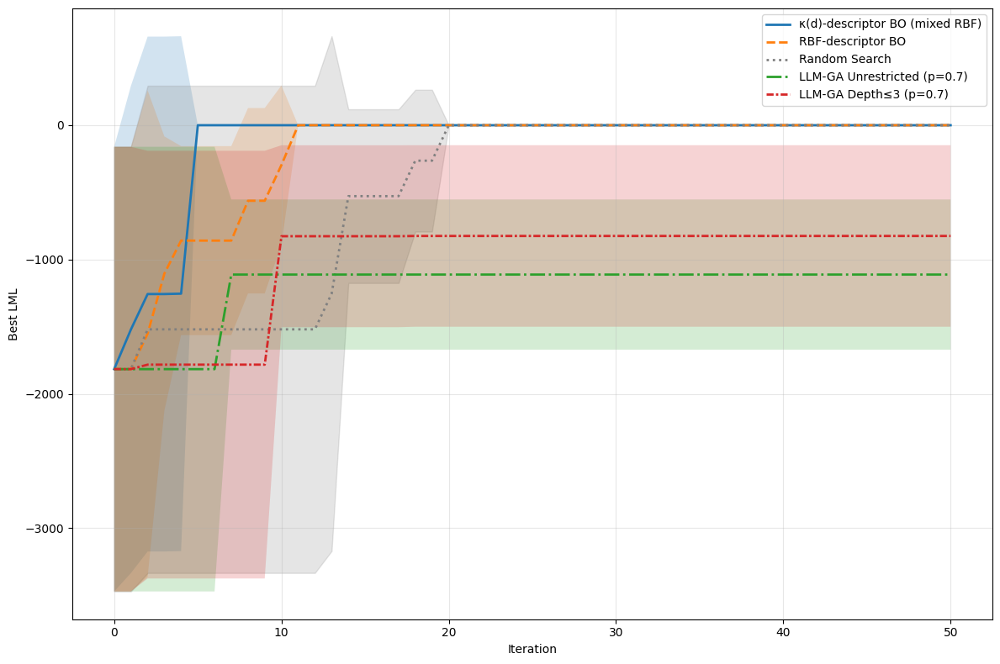


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML           Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     32.082662      1.360926     -1.500145       0.00000  [8, 14, 12, 13, 5]           10.4       3.382307
                     RBF BO     74.485772     21.767276     -1.500145       0.00000  [2, 13, 12, 8, 19]           10.8       5.635601
              Random Search     31.645013      4.047902     -1.500206       0.00003 [48, 28, 2, 20, 37]           27.0      15.594871
LLM-GA Unrestricted (p=0.7)    270.612485     23.356815  -1112.684433     558.80753     [0, 0, 0, 7, 0]            1.4       2.800000
     LLM-GA Depth≤3 (p=0.7)    235.391479     18.490067   -825.509414     675.30679   [0, 0, 6, 10, 18]            6.8       6.764614


Saved results → schwefel-results.csv
Saved summary → schwefel-summary.csv
Saved plot    → schwefel_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Egg Function Dataset
x_data = torch.linspace(-5.0, 5.0, 100).unsqueeze(-1)
x_scaled = x_data * 100.0
y_raw = 418.9829 - x_scaled * torch.sin(torch.sqrt(torch.abs(x_scaled)))

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/schwefel_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/schwefel-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/schwefel-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/schwefel-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/schwefel-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/schwefel_comparison_with_llm_ga.png")

## Rastrigin Function

C:\Users\shakt\AppData\Local\Temp\ipykernel_21144\3653243256.py:123: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_raw = 10 + (x_scaled**2 - 10 * np.cos(2 * np.pi * x_scaled))



PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.39 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo


Run 1 | init: ['((PER * SE) * PER)', '(PER + (RQ + RQ))', '((PER * PER) + PER)', '(SE + (PER * SE))', '(RQ * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=24, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=209, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=224, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=124, LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 27 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=138, LML=-4946.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=74, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=9, LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 38 → idx=41, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=197, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=89, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=136, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=164, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 45 → idx=36, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=152, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=57, LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=229, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=86, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=160, LML=-4946.375


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=188, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=45, LML=-4946.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=64, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=15, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=207, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=89, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=186, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=112, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=76, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=70, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=60, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=27, LML=-4946.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=109, LML=-4946.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=20, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=194, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=178, LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=161, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original

[LLM-GA] iter=01 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * (PER + PER)))... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER) + PER)... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * PER) + PER)... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + ((PER * PER) + PER))... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * PER) + PER)... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * PER) + PER)... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + ((PER * PER) + PER))... LML=-4946.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * (PER + PER)))... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.377
[WARN] Kernel (SE + (PER * (PER + 1))) failed: AttributeError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER) + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * (PER + PER)))... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * PER) + (PER * PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * PER) + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER) + (PER * PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER) + ((PER * PER) * PER) + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * PER) + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER) + (PER * PER * PER) + ((PER * PER) * PER) ... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER) + ((PER * PER) * PER) + (PER * PER * PER) ... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * PER) + (PER * (PER * PER)) + ((PER * PER) * PER... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * PER) + (PER * (PER * PER)) + ((PER * PER) * PER... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * (PER + PER)) + ((PER * PER) * PER))... LML=-4946.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * PER) + (PER * PER * PER) + ((PER * PER) * PER) ... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * PER) + (PER * PER * PER) + ((PER * PER) * PER) ... LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * PER) + (PER * PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER) + ((PER * PER) * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER) + (PER * (PER * PER)))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + SE)... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (SE * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * SE) + (SE * PER))... LML=-4946.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * SE) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * SE) + (PER * PER))... LML=-4946.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * SE) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original


Run 2 | init: ['(RQ + (SE * SE))', '(RQ + (SE * PER))', '(SE * (PER + PER))', '(SE * (SE * PER))', '(RQ * (PER * PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=222, LML=-4946.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=206, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=8, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 05 → idx=172, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=41, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=130, LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=224, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=207, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=174, LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=227, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=54, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=215, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 36 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 38 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=120, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=136, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=19, LML=-4958.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=209, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 03 → idx=135, LML=-5036.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=32, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=60, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=54, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=189, LML=-4946.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=227, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=86, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=71, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=22, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=136, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=15, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=219, LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=223, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=72, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=217, LML=-4946.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=64, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[WARN] Kernel ((PER + RQ) * RQ) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (RQ + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER + SE * (PER * PER))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER) + (SE * RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + (SE * RQ) + (PER * RQ)... LML=-4944.031


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((RQ + (SE * PER)) * (SE + PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER) + (SE * RQ) + (RQ * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + ((SE * RQ) * (SE * PER))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (RQ * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + ((SE * RQ) * (PER + RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ) * PER... LML=-4946.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (SE * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ) + (SE + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (SE * RQ) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (SE * RQ)) * (PER + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (RQ * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (RQ * (SE * PER)))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ) + (SE + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * SE)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + (SE * (PER * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + (SE * (PER * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=21 mutation  → ((SE + RQ) * PER)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → ((SE * PER) + (RQ)) * SE... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (SE * RQ)) * (PER + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (SE * (PER * RQ)))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE + RQ) * PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + (SE * RQ)) * (SE + PER)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (SE * (PER * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=29 mutation  → ((SE + RQ) * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * RQ * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (SE * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + (SE * RQ) + ((SE * PER) * (PER * PER))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + (SE * RQ * (SE * PER))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * SE)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.401


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * PER) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (SE * RQ) + (SE * (PER * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (SE * RQ)) * (SE + PER)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER) + (SE * RQ) + (SE * RQ)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + (SE * RQ) + (PER * RQ * (SE * PER))... LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER) + (SE * RQ) + (SE * RQ * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (SE * RQ)) + ((SE * PER) * RQ)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE + RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (SE * RQ)) * (SE + PER)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + (SE * RQ) + (PER * PER * RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE * (PER * PER)) + ((SE + RQ) * PER))... LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ) + (SE + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + (SE * RQ) + (PER * RQ * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + (SE * RQ) + ((SE * PER) * RQ)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + (SE * RQ) + (SE * (PER * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (SE * RQ)) * (PER + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE * RQ)) * (SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + (SE * RQ)) * (PER + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (RQ + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + (SE * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (RQ + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (RQ * SE))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * (PER + RQ))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER)... LML=-4946.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + RQ) * PER)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + SE) * PER... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=29 crossover → ((SE + RQ) * PER)... LML=-4946.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE + RQ) * PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + SE)... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * RQ) + (SE + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + SE) * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER) * RQ... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo


Run 3 | init: ['(PER * (RQ * SE))', '((SE * RQ) * PER)', '((SE + SE) * SE)', '((PER + RQ) * PER)', '(SE * (RQ * RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=11, LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=215, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e

[BO] iter 03 → idx=177, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=4, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=172, LML=-6590721000.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=19, LML=-4958.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=1, LML=-4946.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=2, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=6, LML=-4946.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=7, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 16 → idx=8, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=152, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=130, LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=120, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=15, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=32, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=204, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=80, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=136, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=110, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((PER * RQ) + PER) failed: ModelFittingError
[BO] iter 31 → idx=9, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=109, LML=-4946.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=26, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=164, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=20, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=64, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=229, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=174, LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=162, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=54, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=55, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=139, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=189, LML=-4946.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=212, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=17, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=43, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=50, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=175, LML=-4946.375


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=45, LML=-4946.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=64, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=141, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=83, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=207, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=71, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=2, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=148, LML=-4946.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=183, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=70, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=27, LML=-4946.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=125, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=109, LML=-4946.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=61, LML=-4946.375


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[WARN] Kernel ((PER * RQ) + PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * RQ) + ((SE + PER) * RQ))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * (RQ * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (RQ * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (SE + SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * (SE + SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (((SE + SE) * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (((SE * RQ) + PER) * ((SE + PER) * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * (SE + SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + (RQ * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + SE * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ) + (SE * RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ) + (SE * RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + (RQ * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=22 crossover → ((SE + RQ) * PER)... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * (SE + SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * PER)... LML=-4946.418


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * RQ) + (SE + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * RQ) + PER) * SE... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + SE) * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * RQ) + (PER * (SE + RQ)))... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (((SE * RQ) + PER) * ((SE + PER) * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + ((SE + PER) * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + RQ)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * RQ) + ((SE + SE) * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * RQ) + ((SE + PER) * RQ) + PER)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + ((SE + PER) * RQ))... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + (SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (PER * RQ) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER)... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * PER)... LML=-4946.418


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (SE + SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE + RQ) * PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * SE) + RQ... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + SE)... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + SE) * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + SE) * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + SE) * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (SE * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + SE) * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + (SE + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo


Run 4 | init: ['((PER * PER) * RQ)', '(RQ * (SE * PER))', '((PER + PER) + PER)', '(SE + (RQ + PER))', '((RQ + SE) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=130, LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=214, LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=206, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 16 → idx=112, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=174, LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=32, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=227, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=19, LML=-4958.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=215, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=120, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 34 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=224, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=209, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=136, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=102, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=172, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=4, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=41, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=16, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=119, LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=54, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=86, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=25, LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=214, LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=148, LML=-4946.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=61, LML=-4946.375


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=2, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=227, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=32, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=43, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=224, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=45, LML=-4946.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=141, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=27, LML=-4946.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 

[LLM-GA] iter=01 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * PER)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (((SE + RQ) * PER) + (PER + PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=04 crossover → ((SE + RQ) * PER) + ((PER + PER) + PER)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + ((PER + PER) + PER)... LML=-4946.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * PER) + (PER + PER))... LML=-4946.434


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER) + ((PER + PER) + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER) + ((PER + PER) + PER)... LML=-4946.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (PER + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * PER) + ((PER + PER) + PER)... LML=-4946.419


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER) + (PER * (PER + PER))... LML=-4946.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * PER)... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + RQ) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * RQ) + ((PER + PER) * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) + (PER * PER))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * (PER + PER + PER))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) * PER) + (PER * ((PER + PER) * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * PER) + ((PER + PER) * PER)... LML=-4946.374


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER) + ((PER + PER) * RQ)... LML=-4946.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE + RQ) * PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * PER)... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * PER) + (PER * (PER + PER))... LML=-4946.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER) + (PER * PER)... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * PER) + ((PER + PER) + PER)... LML=-4946.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) + (PER + PER))... LML=-4946.395


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * (PER + PER) + (PER + PER))... LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * PER)... LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * PER)... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * (PER + PER) + PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE * PER) + ((PER + PER) * RQ) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) + (PER + PER))... LML=-4946.395


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE + RQ) * PER + (PER + PER)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + ((PER + PER) * RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * PER)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + RQ) * (PER + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * PER)... LML=-4946.487


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=50 crossover → (SE * PER) + ((PER + PER) * RQ)... LML=-4946.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + RQ) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + RQ) * PER)... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER + PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER + PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER + PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER + PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 


Run 5 | init: ['(PER * (RQ + RQ))', '((SE + RQ) + RQ)', '(PER + (SE * RQ))', '((RQ * SE) * RQ)', '((PER * SE) * SE)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=215, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 12 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=171, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=110, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=24, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=174, LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=130, LML=-4946.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=222, LML=-4946.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=89, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=207, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=41, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=209, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=224, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=20, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=109, LML=-4946.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=152, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=206, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_op

[WARN] Kernel (RQ + (RQ * PER)) failed: ModelFittingError
[BO] iter 50 → idx=177, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=5, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=213, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=4, LML=-4946.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=215, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=190, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=108, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=0, LML=-1.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=46, LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=18, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-1.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=10, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=93, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=189, LML=-4946.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=236, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=23, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=107, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=233, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=216, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=105, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=149, LML=-76.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=2, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=227, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=230, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=35, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=95, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=24, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=138, LML=-4946.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=32, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=218, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=228, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=146, LML=-1.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=231, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=144, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=141, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=33, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=134, LML=-1.402


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=45, LML=-4946.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=64, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=163, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=61, LML=-4946.375


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=71, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 49 → idx=150, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=143, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda

[LLM-GA] iter=01 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * SE) + ((RQ * SE) * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + ((RQ * SE) * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((RQ * SE) + (PER * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((RQ * SE) + (PER * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + (SE + PER))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + (SE + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + ((PER * SE) * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * RQ) + ((PER * SE) * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * SE) + ((RQ * SE) * RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + ((SE + PER) * RQ))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) + RQ)... LML=-4946.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * RQ) + (SE + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * RQ) + PER) * SE... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE + PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (SE + PER))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (SE * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (SE + PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + ((SE + PER) * RQ))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + SE) * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + (SE + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (SE + PER))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE + RQ) * PER)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + SE) * RQ)... LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * (SE + RQ))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * SE) + (RQ * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4946.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + SE) * RQ... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * (PER + RQ))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * (PER + RQ))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER)... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * (PER + RQ))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + PER... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (RQ + PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE) + RQ... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + SE) * RQ... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + RQ... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.583


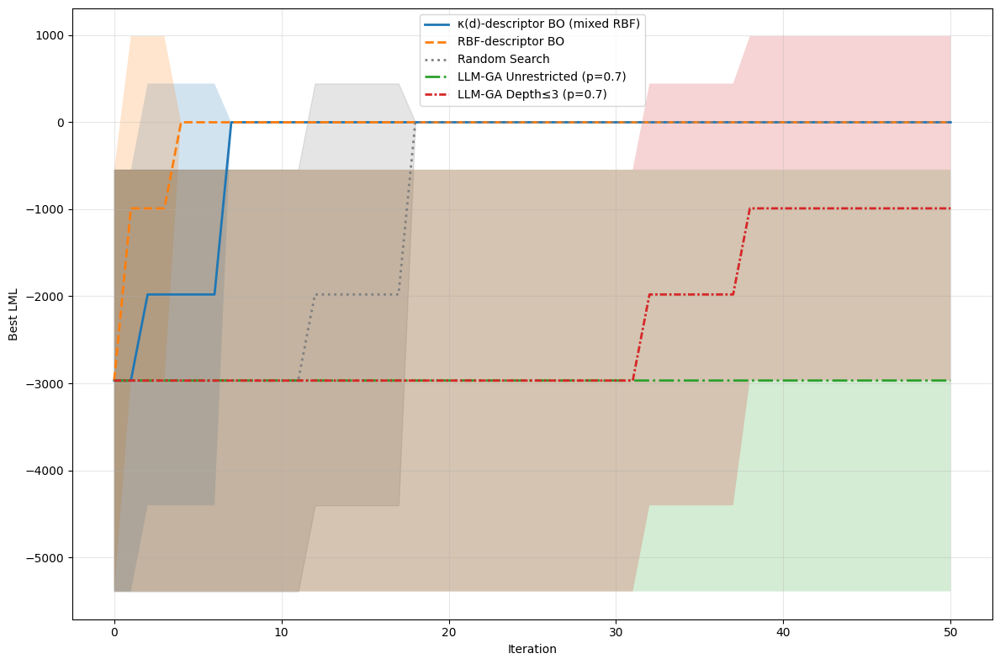


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML            Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     51.981274      6.451788     -1.350193      0.003117   [9, 16, 25, 3, 11]           12.8       7.386474
                     RBF BO     87.279069      6.462305     -1.348634      0.000000     [2, 7, 22, 8, 5]            8.8       6.910861
              Random Search     56.590795      5.723270     -1.366719      0.020723 [12, 24, 12, 34, 50]           26.4      14.388885
LLM-GA Unrestricted (p=0.7)    351.572308     52.838259  -2967.910514   2422.103956      [1, 3, 2, 0, 5]            2.2       1.720465
     LLM-GA Depth≤3 (p=0.7)    290.340208     17.894755   -990.383801   1977.962891    [1, 38, 32, 5, 5]           16.2      15.535765


Saved results → rastrigin-results.csv
Saved summary → rastrigin-summary.csv
Saved plot    → rastrigin_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 5
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Rastrigin Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5.0, 5.0, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
y_raw = 10 + (x_scaled**2 - 10 * np.cos(2 * np.pi * x_scaled))

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/rastrigin_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/rastrigin-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/rastrigin-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/rastrigin-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/rastrigin-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/rastrigin_comparison_with_llm_ga.png")

## Egg Function


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.70 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)



Run 1 | init: ['((PER * PER) + PER)', '(RQ * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=24, LML=-3238.852


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=19, LML=-4021.691


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=35, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=197, LML=-4690.816


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=14, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=235, LML=-3258.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=63, LML=-3426.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=89, LML=-4210.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=1, LML=-2949.699


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=224, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=93, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 41 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=156, LML=-3020.246


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=9, LML=-3648.026


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=177, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 46 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=104, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=16, LML=-4646.998


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=181, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=194, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=6, LML=-4024.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=86, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=185, LML=-4562.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=4, LML=-3381.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=225, LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=118, LML=-2978.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=157, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=87, LML=-1740.140


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=92, LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=145, LML=-4482.747


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=93, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=188, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=45, LML=-3441.045


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=105, LML=-1571.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=16, LML=-4646.998


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=130, LML=-3378.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=74, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=25, LML=-4271.558


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=113, LML=-2550.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=46, LML=-3484.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=148, LML=-4602.994


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4359.707


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ * SE))... LML=-3486.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (SE * RQ))... LML=-4566.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-3486.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (PER + PER))... LML=-3289.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + PER) * RQ... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER) + (PER * PER))... LML=-1307.814


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * PER) + PER)... LML=-1305.452


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * PER) + (PER * RQ))... LML=-4507.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * PER) + PER)... LML=-1305.452


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (PER * PER)... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * PER) + PER)... LML=-1305.452


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (PER * PER))... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER) + (PER * PER) + (PER * PER)... LML=-2504.804


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (PER * PER))... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (PER * PER)... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + ((PER * PER) * SE))... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (PER * PER) + (SE * SE)... LML=-4411.789


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * PER) + PER)... LML=-1952.844


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-4411.789


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * SE) + PER)... LML=-1740.140


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + (PER * PER))... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + PER) * PER... LML=-3289.521


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + ((PER * PER) * SE))... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-4411.789


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-1952.844


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + (PER * PER) + (PER * PER)... LML=-2504.804


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + PER)... LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER) + (PER * PER)... LML=-1211.206


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-4283.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-3486.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + (SE * PER))... LML=-2089.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * SE) + PER)... LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + PER)... LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + PER)... LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * SE) + PER)... LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + SE)... LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * SE) + PER)... LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (SE * PER))... LML=-1654.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)



Run 2 | init: ['(SE * (SE + PER))', '(RQ + (SE + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=144, LML=-1459.421


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=14, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=125, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=24, LML=-3238.852


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=4, LML=-3381.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=64, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=43, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=36, LML=-1960.792


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 32 → idx=19, LML=-4021.691


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=224, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=156, LML=-3020.246


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=9, LML=-3648.026


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 44 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=20, LML=-2019.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=177, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=212, LML=-1420.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=109, LML=-2949.699


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=23, LML=-1419.822


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=95, LML=-1465.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=218, LML=-1465.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=35, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=110, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=148, LML=-4602.994


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=231, LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=107, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=76, LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=224, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=23, LML=-1419.822


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=181, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=89, LML=-4210.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=36, LML=-1960.792


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=130, LML=-3378.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=116, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=82, LML=-4534.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=65, LML=-3242.190


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=30, LML=-2521.034


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=178, LML=-4605.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=118, LML=-2978.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (SE * PER) + PER)... LML=-4203.542


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * PER) + ((SE + PER) * RQ)... LML=-4374.525


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * (SE + RQ))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (SE * RQ))... LML=-4544.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * (SE * RQ))... LML=-4544.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (SE + RQ))... LML=-4408.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * (SE * RQ))... LML=-4544.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * (SE * RQ))... LML=-4544.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * (SE * RQ))... LML=-4544.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER) * RQ... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (RQ * SE))... LML=-4320.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE + RQ + RQ))... LML=-4200.692


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE + RQ))... LML=-4408.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (SE + RQ))... LML=-4408.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * (SE + PER))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((RQ + SE) * PER)... LML=-3747.819


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((RQ + SE) + PER)... LML=-4645.149


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (RQ * SE)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (RQ + (SE * PER))... LML=-4581.673


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((RQ * SE) + PER)... LML=-3648.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (RQ * (SE + PER))... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (RQ * (SE + PER))... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (RQ * PER) + SE... LML=-4450.183


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (RQ * SE) + PER... LML=-3648.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → SE... LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (RQ * (SE + PER))... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 3 | init: ['(SE * (RQ + PER))', '((SE + SE) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=39, LML=-3480.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=19, LML=-4021.691


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=146, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=63, LML=-3426.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=89, LML=-4210.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=43, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=36, LML=-1960.792


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=14, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=235, LML=-3258.800


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=156, LML=-3020.246


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=93, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 41 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=212, LML=-1420.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=31, LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=6, LML=-4024.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=35, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=231, LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=105, LML=-1571.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=55, LML=-4483.376


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=196, LML=-2565.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=219, LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=105, LML=-1571.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=142, LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=190, LML=-3216.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=4, LML=-3381.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=1, LML=-2949.699


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=23, LML=-1419.822


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=135, LML=-3395.468


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=212, LML=-1420.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=60, LML=-3376.015


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=43, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=76, LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=194, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=54, LML=-3335.127


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=45, LML=-3441.045


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=63, LML=-3426.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=7, LML=-3020.172


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=82, LML=-4534.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=202, LML=-3332.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=160, LML=-3475.667


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=176, LML=-4552.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-3927.676


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * RQ) + (SE * PER) + (PER * RQ)... LML=-3782.111


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-3927.676


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-3927.676


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + RQ + PER))... LML=-4534.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * RQ) + (SE * PER) + (PER * RQ) + (SE + RQ)... LML=-4150.479


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (RQ + PER)) + (PER * RQ)... LML=-4142.909


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * RQ) + (SE * PER) + (PER * RQ) + (SE * (RQ + PER))... LML=-4460.683


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + (PER * SE)... LML=-3687.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * RQ) + (PER * RQ))... LML=-4590.587


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * RQ) + (PER * RQ))... LML=-4590.587


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * (SE + RQ))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * (SE + RQ) * RQ)... LML=-4759.900


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE * PER) + RQ)... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-3782.738


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (SE + RQ) + RQ)... LML=-4757.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * (SE + RQ))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + (PER * SE))... LML=-3687.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * (PER + RQ))... LML=-2565.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (SE * RQ))... LML=-4577.479


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * (SE + RQ + RQ))... LML=-4200.692


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (SE + RQ)) + (SE * RQ)... LML=-4714.230


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * (PER + RQ))... LML=-2565.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * (PER + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE * PER) + RQ)... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (SE * RQ))... LML=-4577.479


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * RQ) + (SE * PER))... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ) + (SE * PER)... LML=-3687.869


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ) + (PER * RQ)... LML=-4590.587


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER + (PER * SE))... LML=-2858.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * RQ) + PER)... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER + SE) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * PER)... LML=-2551.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER + SE) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * PER))... LML=-2298.054


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + (SE * PER))... LML=-2298.054


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 4 | init: ['((PER * PER) * RQ)', '((RQ + SE) + SE)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=39, LML=-3480.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=19, LML=-4021.691


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=32, LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=35, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=63, LML=-3426.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=14, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=104, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=89, LML=-4210.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=93, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 38 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=156, LML=-3020.246


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=177, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=64, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=16, LML=-4646.998


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=125, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=177, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=97, LML=-4568.772


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=86, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=29, LML=-4614.666


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=133, LML=-3616.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=4, LML=-3381.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=102, LML=-2095.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=64, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=207, LML=-4782.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=75, LML=-2520.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=116, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=231, LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=45, LML=-3441.045


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=39, LML=-3480.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=168, LML=-3493.074


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=93, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=25, LML=-4271.558


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=14, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=157, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=113, LML=-2550.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=46, LML=-3484.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=225, LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=105, LML=-1571.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=70, LML=-3242.190


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * RQ) + (SE * RQ))... LML=-4601.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ + SE) * (PER * PER))... LML=-4628.076


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (PER * PER))... LML=-3542.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (SE * RQ))... LML=-4601.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * (PER * RQ))... LML=-3425.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (PER + RQ))... LML=-4566.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * (RQ + PER))... LML=-3344.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (PER * RQ))... LML=-3425.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ) + PER... LML=-4838.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + (PER * PER)) * RQ)... LML=-4803.134


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (PER * RQ))... LML=-3425.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * (PER * RQ))... LML=-3425.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (PER * RQ))... LML=-3425.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * PER) + (RQ * PER))... LML=-4652.676


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * (RQ + PER))... LML=-3344.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4569.536


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (SE + PER))... LML=-1827.517


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * (SE * PER))... LML=-4372.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-4569.536


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ) + PER... LML=-3648.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + PER) * RQ... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER) * RQ... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * (SE + PER)) + RQ... LML=-4628.642


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER + (SE * PER))... LML=-4387.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((RQ + SE) * PER)... LML=-3747.819


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ + SE) * SE)... LML=-3701.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (RQ + (SE * PER))... LML=-4581.673


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((RQ + SE) * PER)... LML=-3747.819


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((RQ + SE) * PER)... LML=-3747.819


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + SE)... LML=-4448.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((RQ + SE) * SE)... LML=-3701.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((RQ + SE) * SE)... LML=-3701.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((RQ * SE) + PER)... LML=-3648.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (RQ * (SE + PER))... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → SE... LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + RQ)... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (RQ * (SE + PER))... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (PER * RQ))... LML=-4584.084


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4607.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (RQ * PER))... LML=-4448.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)



Run 5 | init: ['(PER * (RQ + SE))', '((PER * SE) * SE)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=24, LML=-3238.852


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=110, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=206, LML=-1419.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=181, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=88, LML=-4562.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=9, LML=-3648.026


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=35, LML=-1570.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=32, LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=134, LML=-1419.822


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=43, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=63, LML=-3426.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=230, LML=-641.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=1, LML=-2949.699


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=224, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=41, LML=-4450.183


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=174, LML=-3569.893


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=120, LML=-1916.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=177, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=212, LML=-1420.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=74, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=16, LML=-4646.998


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=104, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=229, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=80, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=74, LML=-2114.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=183, LML=-4581.673


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=111, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=1, LML=-2949.699


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=18, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=236, LML=-1379.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=112, LML=-3023.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=50, LML=-3332.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=181, LML=-2639.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=216, LML=-1599.563


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=220, LML=-3216.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=87, LML=-1740.140


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=207, LML=-4782.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=2, LML=-1916.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=149, LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=5, LML=-1635.947


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=171, LML=-3427.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=214, LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=135, LML=-3395.468


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=189, LML=-3437.066


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=136, LML=-3423.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=233, LML=-1405.887


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=105, LML=-1571.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=209, LML=-1420.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=138, LML=-3514.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=213, LML=-1312.696


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=25, LML=-4271.558


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=143, LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=41, LML=-4450.183


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=15, LML=-2521.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=215, LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=227, LML=-4210.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=152, LML=-2070.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=229, LML=-3505.002


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=82, LML=-4534.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=4, LML=-3381.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=172, LML=-3595.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=43, LML=-2807.516


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=28, LML=-3401.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=161, LML=-4429.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=192, LML=-1916.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * SE) + (RQ * SE))... LML=-3687.709


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) * (RQ + SE))... LML=-4575.412


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * SE) + ((PER * SE) * RQ))... LML=-4587.978


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * (SE + RQ))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * (SE + RQ) + RQ)... LML=-4757.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * (RQ + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * (SE + RQ) * RQ)... LML=-4759.900


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * SE) + (RQ * SE))... LML=-3687.709


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * SE) + (SE * RQ))... LML=-4339.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (RQ + SE + PER))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * (RQ + SE + PER))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * (PER + SE))... LML=-2258.387


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4584.028


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * SE) + (RQ * SE))... LML=-3687.709


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (((SE + PER) * RQ) + (SE * RQ))... LML=-4461.460


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1472.744


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (SE * PER))... LML=-4739.805


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (PER + RQ))... LML=-2565.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (PER + SE)... LML=-1299.982


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + RQ... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + SE... LML=-4739.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-2607.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER) + (SE * SE)... LML=-4378.722


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + RQ)... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + PER)... LML=-1740.140


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * SE) + (SE * PER))... LML=-4303.181


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * SE) + (PER * SE))... LML=-4124.750


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER) + SE... LML=-4739.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + SE)... LML=-4739.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (PER + SE))... LML=-4690.816


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * SE) + (SE * PER))... LML=-4303.181


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + RQ)... LML=-4585.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + SE)... LML=-4739.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4782.949


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * SE))... LML=-4470.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * SE) + (SE * PER))... LML=-4303.181


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (SE * SE))... LML=-4378.722


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER + SE) * SE)... LML=-4782.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE * SE))... LML=-4378.722


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-2031.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + (SE * RQ))... LML=-3614.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4452.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * SE) + (SE * PER))... LML=-4303.181


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-3553.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + (SE * SE))... LML=-1770.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + RQ) * PER)... LML=-4529.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + SE)... LML=-4739.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (PER * SE)... LML=-2031.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * SE) + (SE * PER))... LML=-4303.181


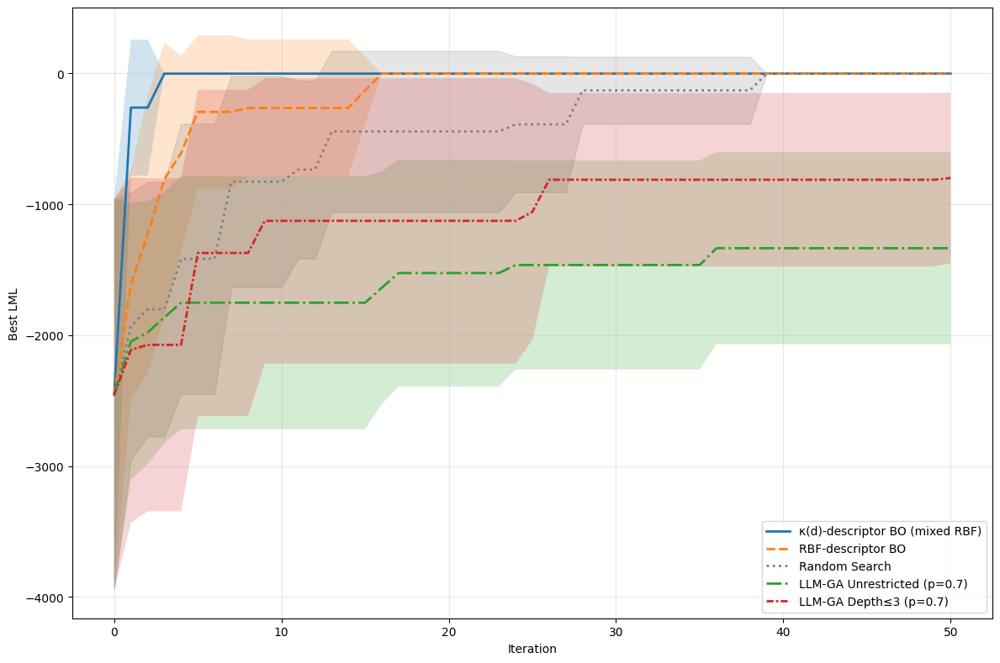


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML          Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     40.766082      1.843221     -1.500159      0.000000 [0, 17, 12, 11, 4]            8.8       6.046487
                     RBF BO    116.697321      9.777563     -1.500159      0.000000 [0, 16, 18, 18, 9]           12.2       6.939741
              Random Search     39.433823      4.282958     -1.500217      0.000029 [0, 28, 39, 7, 13]           17.4      14.207041
LLM-GA Unrestricted (p=0.7)    273.857842     30.547475  -1335.623533    733.182530 [0, 4, 45, 17, 36]           20.4      17.579534
     LLM-GA Depth≤3 (p=0.7)    251.697457     17.902183   -799.089274    651.792887  [0, 50, 5, 26, 1]           16.4      19.272779


Saved results → egg-results.csv
Saved summary → egg-summary.csv
Saved plot    → egg_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 2
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Egg Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5, 5, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
y = 0.0

y_raw = - (y + 47) * torch.sin(torch.sqrt(torch.abs(100*x_scaled/2 + (y+47)))) \
        - 100*x_scaled * torch.sin(torch.sqrt(torch.abs(100*x_scaled - (y+47))))

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/egg_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/egg-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/egg-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/egg-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/egg-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/egg_comparison_with_llm_ga.png")

## Dropwave Function

C:\Users\shakt\AppData\Local\Temp\ipykernel_31912\3625408620.py:123: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_raw = - (1 + np.cos(12*x_scaled)) / (0.5*x_scaled**2 + 2)



PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.20 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues th


Run 1 | init: ['(RQ * (RQ + RQ))', '(PER + (RQ + RQ))', '((PER * PER) + PER)', '((PER * SE) * PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=26, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=130, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=87, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=149, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=228, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=177, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=203, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel ((SE * RQ) + RQ) failed: ModelFittingError
[BO] iter 25 → idx=82, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=1, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=2, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=6, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=7, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 32 → idx=8, LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=9, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=10, LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=11, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=13, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=14, LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 38 → idx=15, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=16, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=17, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=19, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=20, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=22, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=23, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=24, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=25, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=27, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=28, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=29, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=149, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=207, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=71, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=130, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=178, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=86, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=157, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=232, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=58, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=147, LML=-1.379


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=57, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=148, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=223, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=93, LML=-4946.357


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=168, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=30, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=214, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=218, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=7, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=209, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=6, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=51, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=227, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=27, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=173, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=213, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=217, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=203, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=172, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=16, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=154, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=146, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + RQ)))... LML=-2.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ * PER))... LML=-4946.350


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (RQ + (PER * PER)))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (RQ + (PER * PER)))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (RQ + (PER * PER)))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (RQ + RQ))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (RQ + PER)) + (RQ * (RQ + RQ))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * (RQ + RQ))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * RQ) + (RQ * PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (RQ + (PER * PER)))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (RQ + (PER * PER)))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((RQ * (RQ + RQ)) + (PER * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (SE * RQ))... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * RQ) + (RQ * (RQ + PER)))... LML=-6.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * RQ) + ((PER * PER) * SE))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (RQ + PER)) + (RQ * (RQ + RQ))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + ((RQ + PER) * PER)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (RQ * ((PER * PER) + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * (RQ + RQ))... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + (PER * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (RQ + PER)) + (RQ * (RQ + RQ))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (RQ * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * SE) + (RQ * (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * SE) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + (RQ * SE) + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * SE) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + (RQ * (RQ + RQ))) * SE... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + RQ) * (RQ + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * SE) + (RQ * SE) + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (RQ + PER)) + (PER * RQ)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (RQ + PER + SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (RQ + (PER * SE)))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * (RQ + SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + (SE * RQ) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + (SE * PER) + (PER * RQ))... LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (RQ + SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE * RQ) + RQ failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((RQ + SE) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((RQ * SE) + SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((RQ + SE) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * RQ) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * RQ) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (RQ + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 


Run 2 | init: ['(RQ + (SE * RQ))', '(SE * (SE * RQ))', '(RQ + (SE + PER))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=110, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=172, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=203, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=54, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=57, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=26, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=95, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=182, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=23, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=25, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=161, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=181, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=197, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=191, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=229, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=164, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=190, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=107, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=80, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=223, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=169, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=213, LML=-2.612
[BO] iter 44 → idx=236, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 45 → idx=97, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=142, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 02 → idx=179, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=209, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=23, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=177, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=51, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=25, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=9, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=172, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=17, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=28, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=229, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=163, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=207, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=1, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=220, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=190, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=62, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=147, LML=-1.379


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=112, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=149, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=8, LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=45, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=19, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=215, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=223, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=213, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=160, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=203, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=157, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=222, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((RQ + (SE * RQ)) + PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ + (SE * RQ)) + PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((RQ + (SE * RQ)) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * RQ) + (SE * (PER + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER) + (RQ * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((RQ + (SE * RQ)) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * RQ) + (RQ * PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * (RQ + PER)) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((RQ + (SE * RQ)) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER + (SE * RQ))... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (SE * RQ) + (PER * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (SE * RQ) + (PER * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((RQ + (SE * RQ)) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * RQ) + (RQ * PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (SE * PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((RQ + (SE * RQ)) * (SE + PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (RQ + PER)) + ((SE * RQ) * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((RQ + (SE * RQ)) + ((SE * PER) * PER))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (SE * RQ) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER) + (SE * RQ) + (RQ * (SE + PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (SE * RQ) + (PER * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((RQ + (SE * RQ)) + (SE * PER) + (SE * SE))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * RQ) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (RQ + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (PER + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (PER + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues th


Run 3 | init: ['((SE + SE) + PER)', '((PER + RQ) * PER)', '(PER * (RQ * SE))', '(SE * (RQ * SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=215, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=58, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=191, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=57, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=213, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=228, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=232, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=23, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=25, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=120, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=53, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=62, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=35, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=45, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=80, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=190, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=139, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 44 → idx=82, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 46 → idx=83, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=161, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=107, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=175, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=236, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=86, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=58, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 07 → idx=184, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=185, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=80, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=139, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=181, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=227, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=53, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=180, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=205, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=89, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=157, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=226, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=28, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=190, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=221, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=70, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=164, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=47, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=85, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=44, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=220, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=188, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=163, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=35, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=232, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=94, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 43 → idx=82, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=158, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=101, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 47 → idx=179, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=160, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=182, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + (RQ * SE)) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (RQ * (SE + PER)))... LML=-1097.680


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * (RQ + PER)) + (SE * (RQ * SE)))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (RQ + PER)) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + (RQ * SE)) * (SE * (RQ + PER)))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (RQ * SE) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * (RQ + PER)) + (SE * PER)) + (SE * RQ)... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER) + (RQ + SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + (PER * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER) + (RQ + SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (SE * RQ) + (RQ * PER))... LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (PER + RQ)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (PER + RQ)) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER) + ((SE * RQ) + (SE * (PER + RQ)))... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + (SE * (PER + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (PER + RQ)) + (SE * RQ) * (PER + RQ)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (PER + RQ)) + (SE * (RQ + SE))... LML=-1.416


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * RQ) + (PER * (SE + RQ))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * PER) + (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + (PER * RQ)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + (RQ * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (PER * RQ)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (PER * RQ)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * RQ) + (RQ * PER)... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (PER * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * RQ) + (PER * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * RQ) + (PER * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * RQ) + (PER * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues th


Run 4 | init: ['(SE + (RQ + RQ))', '((PER * PER) * RQ)', '((RQ + SE) + RQ)', '((PER + PER) + PER)']
[BO] iter 01 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 02 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=34, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=57, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=229, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=161, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=32, LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=149, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=182, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=23, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=82, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=28, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=178, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=45, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=163, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=112, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=146, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=89, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=190, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=169, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=130, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=226, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=81, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=185, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=80, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=83, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=53, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=229, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=101, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=115, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=86, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=181, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=89, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=147, LML=-1.379


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=178, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=236, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=212, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=4, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=214, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=139, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=133, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=160, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=49, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=169, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=79, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=61, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=209, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=107, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=161, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=163, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=83, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=170, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=185, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=98, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=184, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=22, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * PER) + (RQ + RQ)... LML=-4945.720


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * RQ) + (SE + (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * RQ) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + (SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * RQ) + (SE * PER) + (SE * PER * RQ))... LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * RQ) + (SE * PER) + RQ * PER)... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * RQ) + (SE + (RQ * RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * (SE + (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * (SE + (RQ * RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * RQ) + (SE * (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * (SE + RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * (SE + (RQ * RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + RQ) * (SE + PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + RQ) * (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * (SE + (RQ * PER)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * RQ) + (SE + (RQ * RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * (SE + RQ + PER))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * RQ) + (SE * (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * RQ) + (SE * PER) + (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * RQ) + (SE * (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * RQ) + (SE * PER) + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * RQ) + (SE * (RQ + RQ)))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * (RQ + RQ)) + (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * PER) + (SE * (RQ + RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * RQ) + (SE * RQ) + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * (SE + PER))... LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * RQ) + ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + RQ) * (SE + PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (PER * PER))... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE * RQ) + (RQ + RQ) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ) * PER... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=13 crossover → (SE * RQ) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * RQ) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ) + SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → SE... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues th


Run 5 | init: ['(PER + (SE * RQ))', '((RQ * SE) * RQ)', '(PER * (RQ + RQ))', '((PER * SE) * SE)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=181, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=171, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=5, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=230, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=164, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=209, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=160, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=89, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=35, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=139, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=213, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=214, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=103, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[BO] iter 23 → idx=82, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=188, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=222, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=174, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=203, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=143, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=224, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=50, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=161, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=191, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=45, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=147, LML=-1.379
[BO] iter 41 → idx=236, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 42 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=144, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=32, LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=36, LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=130, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=86, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=58, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=175, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=107, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=148, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=160, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=189, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=104, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=218, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=235, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=206, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=149, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=227, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=53, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=47, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=64, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=231, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=86, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=226, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=58, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=120, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=80, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=45, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=89, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=63, LML=-2.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=178, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=205, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=136, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=10, LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=95, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=228, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=212, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=105, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=25, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=43, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=87, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=111, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=233, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=147, LML=-1.379


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=46, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=18, LML=-1.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=34, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=232, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=157, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=65, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=144, LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=51, LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=88, LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda

[LLM-GA] iter=01 crossover → ((RQ * SE) + (PER * RQ))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((RQ * SE) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ * SE) + (SE + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + (RQ * SE)) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((RQ * SE) + (SE * PER) + (PER * RQ))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (RQ * SE) + PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (RQ * SE) + (RQ * PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER + RQ * SE)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((RQ * SE) + (SE * PER) + PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + (RQ * SE) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (RQ * SE) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((RQ * SE) + (SE * PER) + (PER * RQ))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + ((RQ * SE) * PER))... LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE * PER) + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * PER) + ((RQ + SE) * PER)... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + (RQ * SE) + PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ * PER)... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((RQ * SE) + (SE * PER) + (PER * RQ))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * (RQ + PER)) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ) + (PER * RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((RQ * SE) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER) * RQ... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((RQ * PER) + ((SE * RQ) * PER))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * RQ) + (SE * PER) + (RQ * PER)... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER) + (RQ * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * RQ) + (SE * PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * RQ) + (SE * PER) + (RQ * PER))... LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER) + (SE * (RQ + PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + (SE * (RQ + PER))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE * RQ) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((RQ * SE) + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (RQ * PER) + (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((RQ * SE) + (RQ * PER))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (RQ * PER))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (PER + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (RQ * SE))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (RQ + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((RQ * SE) + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * RQ) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ) + (RQ * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + (RQ * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + (SE + RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (RQ * RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * (SE + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + (RQ * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * RQ) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + (SE * PER)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (PER + RQ))... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * SE)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * RQ) + PER... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=48 crossover → (SE * RQ) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER) + RQ... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-2.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + (SE * RQ)... LML=-1.290


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-2.612


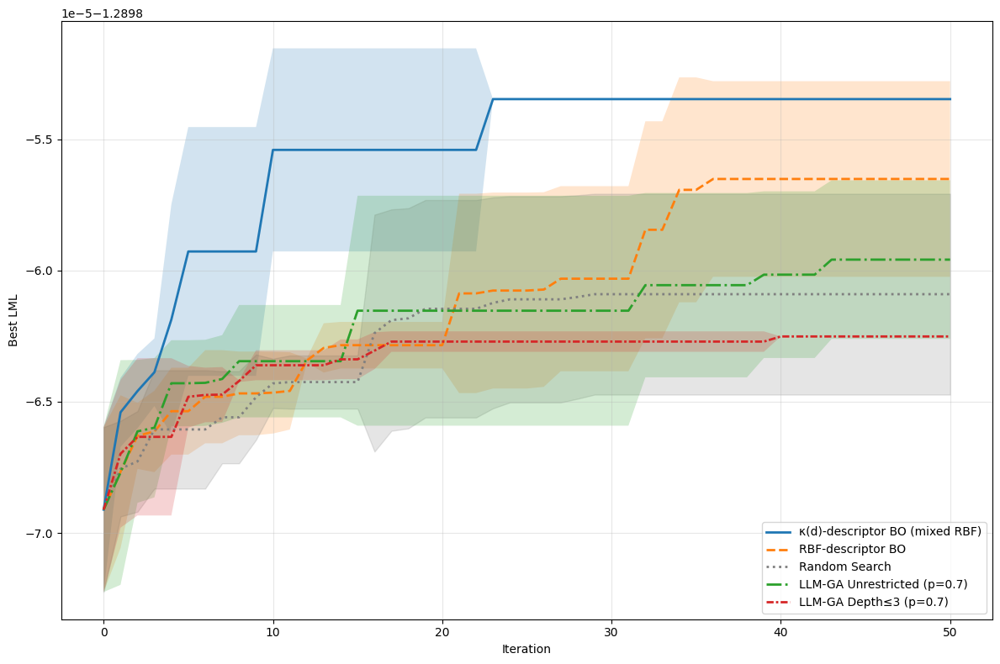


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML            Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     47.519722     10.089832     -1.289853      0.000000   [23, 10, 4, 5, 10]           10.4       6.770524
                     RBF BO     88.244573     13.843451     -1.289857      0.000004 [34, 41, 13, 36, 26]           30.0       9.777525
              Random Search     60.664910      7.671549     -1.289861      0.000004  [23, 0, 36, 29, 19]           21.4      12.142487
LLM-GA Unrestricted (p=0.7)    381.353234     32.857672     -1.289860      0.000003   [43, 1, 8, 15, 39]           21.2      16.809521
     LLM-GA Depth≤3 (p=0.7)    289.593416     28.059966     -1.289863      0.000000 [14, 40, 17, 14, 16]           20.2       9.967949


Saved results → dropwave-results.csv
Saved summary → dropwave-summary.csv
Saved plot    → dropwave_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 4
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Dropwave Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5, 5, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
y_raw = - (1 + np.cos(12*x_scaled)) / (0.5*x_scaled**2 + 2)

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/dropwave_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/dropwave-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/dropwave-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/dropwave-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/dropwave-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/dropwave_comparison_with_llm_ga.png")

## Levy

C:\Users\shakt\AppData\Local\Temp\ipykernel_21144\3610007385.py:124: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_raw = np.sin(np.pi * w)**2 + (w - 1)**2 * (1 + np.sin(2 * np.pi * w)**2)



PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.57 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=110, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=112, LML=-4946.376


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=233, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=64, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=32, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=172, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=14, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=136, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=149, LML=-4946.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=36, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=89, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=152, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\

[BO] iter 35 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=146, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=230, LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=192, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=182, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=189, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=192, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=87, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=86, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=236, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=219, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=64, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=227, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=157, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=82, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=190, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=160, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=199, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=117, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=150, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=153, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=148, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=75, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=23, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=1, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=120, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=6, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=7, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=10, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=11, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=12, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * (SE + RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE + RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + (PER * RQ)) + ((PER * PER) + PER))... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (PER * SE))... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * (PER + RQ))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (SE * PER) + SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + (PER * PER))... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (PER * PER))... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (PER * PER) + SE)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + (SE * PER) + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (((PER * PER) + PER) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE * PER) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (PER * PER))... LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-4946.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE * PER) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + PER)... LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + SE)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * RQ))... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + SE)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + (SE * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * SE) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + SE)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * SE) + PER)... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + RQ)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * PER))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)



Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=89, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=233, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=90, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 04 → idx=219, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=149, LML=-4946.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=110, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=130, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=204, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\

[BO] iter 27 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=136, LML=-4946.377


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=35, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=36, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=224, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=172, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=93, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=192, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=230, LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=152, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=82, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=184, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=205, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=1, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=236, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=10, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=90, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=87, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=204, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=6, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=7, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=11, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=12, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=13, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=14, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=17, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=20, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=22, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=23, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=24, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=26, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=27, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=29, LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=28, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=30, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=31, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=32, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=33, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * (SE * SE)) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * (SE * SE)) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (RQ + (SE * PER))... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (RQ + (SE * (SE * SE)))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (RQ * PER)) * (SE * SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ) + (SE * (SE * SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE * RQ) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (RQ * PER)) * (RQ + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + (RQ * PER)) * (SE + PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE * RQ) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * RQ) + (SE * SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((RQ + SE) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (RQ * PER) + (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (RQ * PER)) * (SE * (SE + PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (RQ + (SE * (SE * SE)))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (RQ * PER)) * (SE * (SE * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ) + (SE + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + (SE + RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * SE) + (RQ * (SE * SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE * SE)) + (RQ + (SE * SE)))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + (RQ * PER)) * SE)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * (SE + (SE * SE)))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (RQ + (SE * SE) + (SE * (SE * SE)))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + (RQ * PER)) + (RQ * (SE * SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * PER) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * PER) + (SE * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * (SE * PER))... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + (RQ * PER)) * (SE * SE)) + (RQ + (SE * SE) + (SE * (S... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (RQ * PER)) * (SE + (SE * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (RQ + (SE * SE) + (SE * (SE * PER)))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + RQ) * (SE * PER))... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (RQ * PER)) * (SE + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + (RQ * PER)) * SE) + (RQ * (SE * SE))... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (RQ * PER)) * SE... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + RQ) * (SE + (RQ * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * (SE * PER))... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * (SE + (SE * SE)))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + RQ) * (SE + PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (RQ * PER)) * (SE + RQ)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * SE) + (RQ * PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + PER * RQ)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (RQ + SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → SE... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (RQ + SE) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (RQ * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * RQ)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (RQ * SE))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER + RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=230, LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=233, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=110, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 10 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=130, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=172, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=14, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\

[BO] iter 26 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=136, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=149, LML=-4946.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=36, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=89, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=152, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=224, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=192, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=189, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=115, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=87, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=96, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=1, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=235, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=236, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=86, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=10, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=178, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=166, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=199, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=204, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=64, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=45, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=120, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=61, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=6, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=7, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=11, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=12, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=13, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * PER) + (RQ * PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + ((RQ + PER) * SE)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + ((PER + RQ) * SE)... LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + (RQ * SE)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ) + (PER * SE)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (SE * (RQ + PER))... LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ) + (PER * SE)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (RQ * SE)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + (RQ * PER) + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (SE * RQ) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + (RQ * PER)) * (SE + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (RQ * (SE + PER)) + (SE * RQ)... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (RQ * (SE + PER))) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (RQ + PER)) + (RQ * PER)... LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (RQ * PER)) * (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (RQ * PER) + (SE * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (RQ * PER)) * (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (SE + RQ))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (RQ * SE)) * PER... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (SE * RQ)) * PER... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (RQ * PER)) * PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ) + PER... LML=-4946.403


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (RQ * SE)) * PER... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + (RQ * (SE + PER))) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + (RQ * SE)) + (RQ * PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) * RQ) + ((RQ * SE) * PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (RQ * SE)) * (SE + PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (RQ * SE)) * PER... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE * RQ) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (SE * RQ)) + (SE * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * RQ) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ) + PER... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + RQ) * (RQ + PER))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (RQ * SE)) * RQ... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + (SE * RQ)) * (SE + PER)... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (RQ * PER) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE + RQ)) * PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * RQ) + PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * RQ) + (SE * PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (PER + RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) * (PER + SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (RQ * SE))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (RQ * SE))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ) + PER... LML=-4946.403


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + RQ... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → PER... LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=233, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=161, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 04 → idx=224, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=207, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 18 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 20 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=112, LML=-4946.376


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=14, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=35, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=172, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=120, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\

[BO] iter 31 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=136, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=149, LML=-4946.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=89, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=152, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=189, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=115, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=184, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=106, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=236, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=86, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=127, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=207, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=190, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=143, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=120, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=61, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=228, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=166, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=197, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=148, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=64, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=17, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=221, LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=67, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=10, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=23, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=117, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=6, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=7, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=9, LML=-4946.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=11, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=12, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + RQ) * (PER + PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * (PER + RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + RQ) * SE) + PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ) + PER... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ) + PER... LML=-4946.383


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER) + (SE + (RQ * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (RQ * PER) + (SE * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (RQ * PER) + (SE * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * (PER * PER))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((RQ + SE) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (RQ + SE))... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (RQ * SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ) + PER... LML=-4946.401


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * (PER + RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE * RQ) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + (RQ * PER)) * (RQ + SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE * RQ) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (RQ * PER) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + ((SE + RQ) * PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ) + PER... LML=-4946.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + ((SE + RQ) * PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ) + PER... LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * (PER + (RQ * SE)))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE * RQ) + PER)... LML=-4946.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE * RQ) + PER)... LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * (SE + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (RQ * PER) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ) + PER... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (RQ * PER) + (PER * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (RQ * PER) + (PER * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + (PER * RQ)) + SE)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ) + PER... LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (RQ * PER) + (RQ * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (RQ * PER) + (PER * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (RQ * (PER + SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (RQ * PER) + (PER * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + SE) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (PER + RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (SE * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * RQ)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (PER * RQ))... LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (RQ + (SE * PER))... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((RQ + SE) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((RQ + SE) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (RQ * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((RQ * PER) + SE)... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((RQ * SE) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((RQ * SE) + (RQ * PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((RQ * SE) + PER)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((RQ * SE) + PER)... LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((RQ + SE) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (RQ * SE))... LML=-4946.401


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER + (PER * RQ))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((RQ + SE) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.352
[LLM-GA] iter=32 crossover → ((RQ * SE) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((RQ + SE) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((RQ * SE) + PER)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER + (RQ * SE))... LML=-4946.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (RQ * SE))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (RQ + PER))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=136, LML=-4946.397


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=230, LML=-4946.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=112, LML=-4946.376


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=110, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=130, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=172, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=174, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=32, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=35, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=88, LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\

[BO] iter 26 → idx=63, LML=-4946.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=89, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=149, LML=-4946.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=36, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=43, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=177, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=152, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=25, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=224, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=93, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=15, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=171, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=192, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=233, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=156, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=189, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=113, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=105, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=45, LML=-4946.397


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=87, LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=214, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=81, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=0, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=108, LML=-56.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=111, LML=-1444.605


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=234, LML=-1.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=213, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=181, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=86, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=133, LML=-4946.380


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=10, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=18, LML=-1444.645


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=236, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=16, LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=4, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=150, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=54, LML=-4946.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=199, LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=208, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=120, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=19, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=64, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=227, LML=-4946.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=206, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=178, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=207, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=61, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=190, LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=46, LML=-4946.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=41, LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=117, LML=-4946.370


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=1, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=144, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=215, LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=23, LML=-4946.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=209, LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=125, LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=2, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=5, LML=-4946.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=6, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=8, LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 

[LLM-GA] iter=01 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * SE) * SE)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER + SE) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + (SE * RQ)) + ((PER + SE) * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * SE) + (SE * SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + (RQ * PER)) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ) + (RQ * PER))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + (RQ * PER)) * PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * (SE + (SE * RQ)))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * SE) + (SE * RQ))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + (SE * RQ)) + (RQ * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER + RQ)... LML=-4946.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + (PER * RQ)) * (PER + (SE * SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + (RQ * PER)) * (PER + (SE * SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * RQ))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * SE) + (SE * PER))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + (SE * RQ)) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * (SE + (SE * RQ)))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + (SE * RQ)) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + (RQ * PER)) * (PER + (SE * SE)))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (SE * RQ))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * RQ) + PER)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER + SE) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * SE))... LML=-4946.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * (RQ + SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (RQ * PER))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + PER... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * (SE + SE))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + PER)... LML=-4946.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (PER + (SE * RQ))... LML=-4946.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + (SE * SE))... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + RQ) * PER... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + PER) * RQ... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (RQ + (SE * SE))... LML=-4946.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * RQ)... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (RQ + (SE * PER))... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (RQ * SE))... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-4946.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + RQ) * SE)... LML=-4946.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * SE) + RQ)... LML=-4946.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + RQ) * PER)... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + (SE * RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (PER + RQ))... LML=-4946.363


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * SE))... LML=-4946.361


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-4946.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (RQ * SE))... LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.345


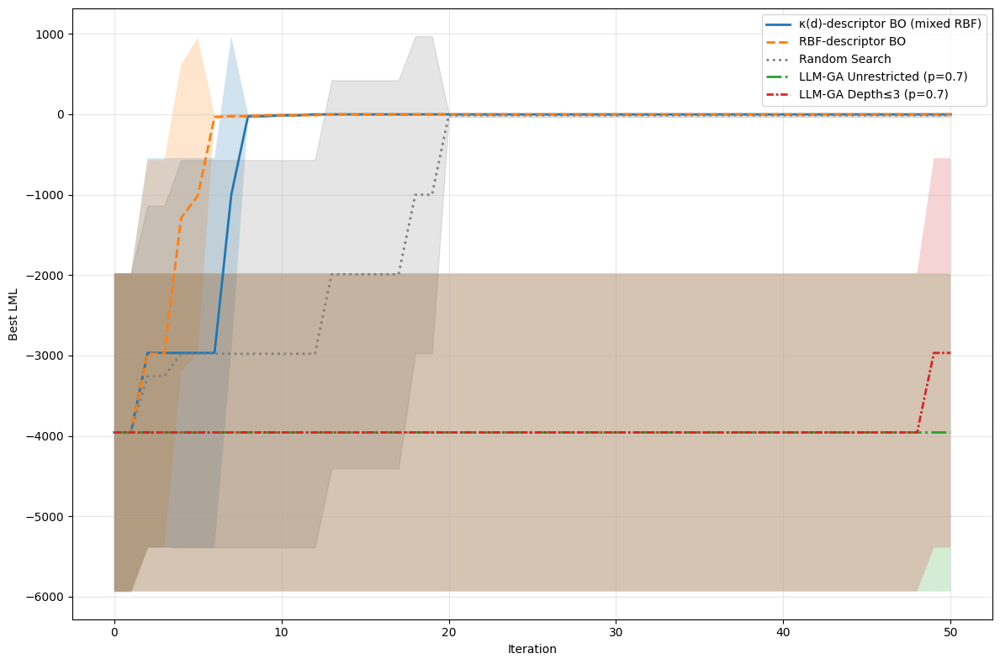


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML          Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     41.524731      1.856941     -1.308482      0.000000  [4, 12, 10, 8, 3]            7.4       3.440930
                     RBF BO     66.017017      4.725921     -1.308482      0.000000  [2, 9, 16, 19, 9]           11.0       5.966574
              Random Search     30.849715      3.655140    -12.398855     21.893260 [0, 28, 4, 35, 13]           16.0      13.520355
LLM-GA Unrestricted (p=0.7)    274.603456     19.428312  -3957.362637   1977.931203   [0, 7, 12, 2, 0]            4.2       4.664762
     LLM-GA Depth≤3 (p=0.7)    249.162765     15.263877  -2968.355297   2422.505300  [0, 15, 49, 5, 0]           13.8      18.432580


Saved results → levy-results.csv
Saved summary → levy-summary.csv
Saved plot    → levy_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Levy Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5, 5, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
w = 1 + (x_scaled - 1) / 4
y_raw = np.sin(np.pi * w)**2 + (w - 1)**2 * (1 + np.sin(2 * np.pi * w)**2)

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/levy_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/levy-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/levy-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/levy-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/levy-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/levy_comparison_with_llm_ga.png")

## Bukin

C:\Users\shakt\AppData\Local\Temp\ipykernel_21144\2704226767.py:124: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_raw = 100 * np.sqrt(np.abs(y - 0.01 * (x_scaled - 10)**2)) + 0.01 * np.abs((x_scaled - 10) + 10)



PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.72 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=110, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=24, LML=-1870.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=89, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=74, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=207, LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=174, LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 27 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=20, LML=-2969.828


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=6, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=172, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=88, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=224, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=118, LML=-3257.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=8, LML=-2191.731


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=144, LML=-1189.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=105, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=156, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=122, LML=-2969.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=86, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=164, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=87, LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=231, LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=45, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=76, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=109, LML=-186.495


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=74, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=36, LML=-4946.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=95, LML=-1078.755


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=112, LML=-2375.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=231, LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=130, LML=-3071.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=27, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=25, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=224, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=14, LML=-2969.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=72, LML=-2969.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=51, LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=66, LML=-3123.322


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=64, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=75, LML=-1665.082


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=15, LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=105, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=6, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=173, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=39, LML=-3084.769


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=227, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ + SE))... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + SE) * RQ)... LML=-3353.510


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) * PER)... LML=-2007.973


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER + SE) * PER) + (SE * RQ)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * RQ) + (PER * RQ))... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * PER) + (SE * PER))... LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * PER) + PER)... LML=-1209.782


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE + PER))... LML=-1040.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (PER + PER))... LML=-1486.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * (PER + PER))... LML=-1486.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + ((PER * PER) + PER))... LML=-1209.782


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * (PER + PER))... LML=-1486.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + PER)... LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (PER * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + RQ)... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER * (SE + PER))... LML=-2376.596


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * ((SE + PER)))... LML=-2376.596


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * PER))... LML=-2082.784


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + SE)... LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * SE) + PER)... LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (SE * PER))... LML=-1969.917


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * SE) + PER)... LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * SE) + (SE * SE))... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * PER))... LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * SE) + PER)... LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * PER)... LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * SE) + PER)... LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=80, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=4, LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 05 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=110, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 07 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 18 → idx=74, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=228, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=174, LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=6, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=227, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=191, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=58, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_op

[BO] iter 40 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 41 → idx=156, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=35, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 44 → idx=172, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=118, LML=-3257.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 46 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=31, LML=-3353.510


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=50, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=195, LML=-2969.775


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=145, LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=182, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=164, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=119, LML=-3148.410


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=16, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=122, LML=-2969.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=174, LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=225, LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=224, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=142, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=227, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=146, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=75, LML=-1665.082


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=31, LML=-3353.510


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=105, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=110, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=64, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=55, LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=6, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=15, LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=117, LML=-3310.682


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + RQ))... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * SE) + (PER * RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * (SE * SE)) + (PER * RQ))... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + PER + (PER * RQ))... LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (SE + PER))... LML=-3746.404


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * (SE * SE))... LML=-4946.295


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * (SE * SE)) + (SE * PER))... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * (SE * SE)) + (PER * RQ))... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * (SE * SE)) + PER)... LML=-1191.086


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * (SE * SE)) + (PER * RQ))... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (SE * SE))... LML=-4946.295


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * (SE * SE)) + PER)... LML=-1191.086


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + PER + RQ)... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * (SE * SE)) + (SE * PER))... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ) * PER... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * (SE * SE)) + PER)... LML=-1191.086


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * (SE * SE)) + (SE * PER))... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * (SE * SE)) + (SE * PER))... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + (SE * (SE * SE)))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + RQ))... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + RQ))... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * SE) + (PER * RQ))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + SE)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * SE) + (SE * PER))... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * SE) + (SE * PER))... LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + (SE * SE)... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 08 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=89, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 18 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=4, LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=74, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 26 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=58, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=80, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=88, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=174, LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 36 → idx=150, LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=229, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=35, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=231, LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=218, LML=-1078.755


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=172, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=228, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=118, LML=-3257.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e

[BO] iter 47 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=192, LML=-2969.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=69, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=228, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=194, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=123, LML=-2376.596


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=227, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=157, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=160, LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=231, LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=72, LML=-2969.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=130, LML=-3071.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=36, LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=118, LML=-3257.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=109, LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=27, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=16, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e

[BO] iter 35 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=82, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=113, LML=-2811.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=224, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=15, LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=64, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=86, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=159, LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=134, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → ((SE + RQ) + PER)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + SE) * RQ)... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * (SE + SE))... LML=-4644.752


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * (PER + RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + SE) * PER)... LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + ((PER + RQ) * PER))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (SE + RQ))... LML=-4841.578


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + ((PER + RQ) * PER))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * (PER + RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * (SE + PER))... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + ((PER + RQ) * PER))... LML=-4946.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + SE) * (SE * PER))... LML=-2969.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + SE) * (SE + PER))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + SE) * PER)... LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + SE) * PER)... LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (SE * PER))... LML=-2965.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + (RQ * PER)) * PER)... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) + RQ)... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + RQ) * PER... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:3


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=172, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 05 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 09 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=125, LML=-1771.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=35, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=89, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=207, LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=74, LML=-2427.659


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 26 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=80, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=58, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=88, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=192, LML=-2969.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e

[BO] iter 41 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=228, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=119, LML=-3148.410


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=156, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=96, LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=86, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=43, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=112, LML=-2375.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=143, LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=4, LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=14, LML=-2969.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=76, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=53, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=169, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=32, LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=235, LML=-2651.061


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=58, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=117, LML=-3310.682


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=144, LML=-1189.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=231, LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=105, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=15, LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=173, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=70, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=113, LML=-2811.698


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=82, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * (PER + SE))... LML=-4841.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * PER) + (SE * RQ) + (PER * RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + (SE * (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + ((SE + PER) * RQ))... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (SE * RQ) + (PER * RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE * RQ) + PER)... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (RQ + PER))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + RQ) * (PER + SE))... LML=-4841.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (PER * RQ))... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE * RQ))... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER) * (RQ + SE)... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * (PER + RQ))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (RQ * SE))... LML=-4946.313


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + PER... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + RQ) * PER... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + RQ) * PER... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + PER) * RQ... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + RQ... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=136, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 02 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=89, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 05 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=192, LML=-2969.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=4, LML=-4946.294


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=24, LML=-1870.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 16 → idx=9, LML=-3074.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=207, LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=35, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=28, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 24 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 26 → idx=80, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=138, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=230, LML=-967.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=36, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=104, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 34 → idx=88, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=191, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=156, LML=-4946.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_op

[BO] iter 42 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=209, LML=-955.316


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=228, LML=-1221.515


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=172, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=2, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=146, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=29, LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=45, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=0, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=108, LML=-15.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=197, LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=24, LML=-1870.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=89, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=214, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=181, LML=-4946.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=213, LML=-1203.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=171, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=130, LML=-3071.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=5, LML=-828.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=90, LML=-2084.367


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=51, LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=54, LML=-3232.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=19, LML=-2554.643


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=41, LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=23, LML=-815.593


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=138, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=110, LML=-2969.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=102, LML=-2347.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=189, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=215, LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\linear_operator\utils\cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e

[BO] iter 31 → idx=152, LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=18, LML=-1035.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=111, LML=-1030.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=236, LML=-967.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=233, LML=-967.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=177, LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=101, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=16, LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=144, LML=-1189.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=120, LML=-2969.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=35, LML=-1192.745


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=149, LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=43, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=150, LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=182, LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=93, LML=-1008.988


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=15, LML=-1791.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=206, LML=-968.523


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=82, LML=-4946.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (PER + (SE * SE))... LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * (SE + SE)))... LML=-1078.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (SE * RQ)... LML=-2239.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * (SE + RQ))... LML=-4841.578


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER + RQ)... LML=-4946.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + (PER * RQ)) * (PER + (SE * SE)))... LML=-4946.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * (SE + PER)))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (SE * RQ) + (PER * RQ)... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * SE) + (SE * (SE + RQ))... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + (SE * (SE + PER)))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * (SE + SE))... LML=-4644.752


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + RQ) * PER)... LML=-3124.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * SE) + (SE * SE))... LML=-1171.788


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * SE) + (SE * (SE + SE)))... LML=-1577.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + PER) * SE... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (SE + SE))... LML=-4946.295


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * SE) + (PER * SE))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER + (SE * (SE + RQ)))... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + (SE * SE) + (SE * RQ))... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (SE * SE)... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (SE * SE))... LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (SE * SE) + (SE * RQ))... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER) + (SE * SE)... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * SE) + (SE * PER))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * SE) + (SE * (SE + PER)))... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (SE * (SE + PER)))... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * (SE + SE)) + PER)... LML=-967.369


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (SE * RQ))... LML=-4946.308


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + SE... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * SE))... LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * SE))... LML=-804.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * SE) + PER)... LML=-1221.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * PER) + RQ)... LML=-4946.303


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (SE * PER))... LML=-4946.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + SE)... LML=-1108.171


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (PER + RQ)... LML=-4946.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * (SE + RQ))... LML=-4841.578


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (RQ + (SE * SE))... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * SE))... LML=-4946.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * PER) + SE)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * SE)... LML=-1570.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-1570.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (SE * SE))... LML=-4946.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-1570.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-2969.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1008.538


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * RQ))... LML=-4946.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER + SE) * SE)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-3353.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (RQ * PER))... LML=-2137.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER + SE) * RQ)... LML=-3353.510


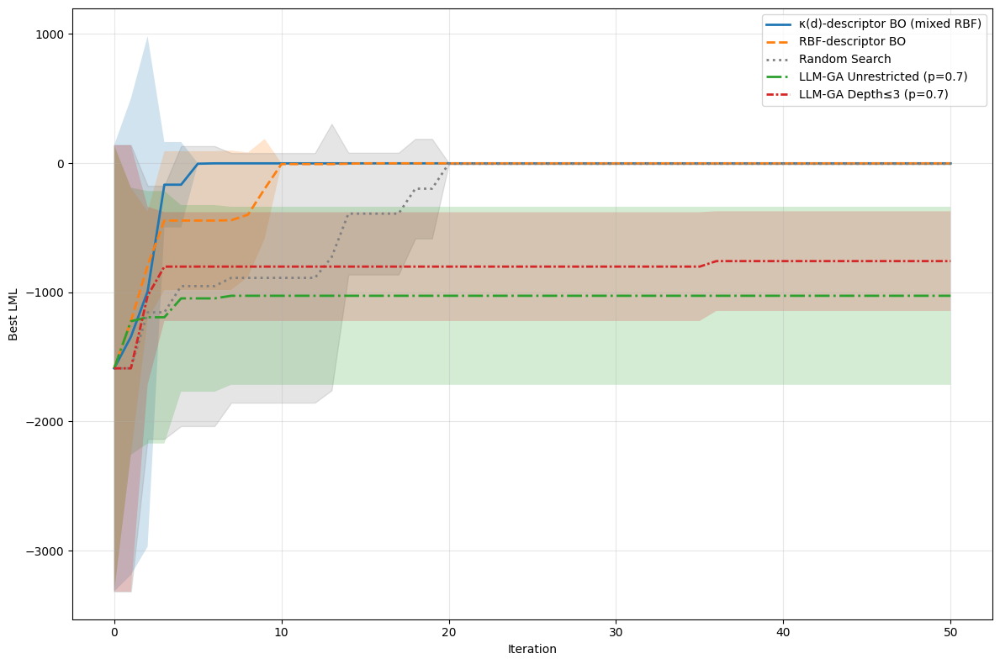


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML           Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     59.128296      3.219488     -1.500172      0.000000 [0, 16, 33, 29, 14]           18.4      11.740528
                     RBF BO    136.555647     13.074183     -1.500172      0.000000 [0, 23, 17, 18, 22]           16.0       8.318654
              Random Search     60.501596      4.510288     -4.255234      5.510063  [0, 18, 4, 35, 13]           14.0      12.280065
LLM-GA Unrestricted (p=0.7)    315.541523     30.164190  -1026.838232    689.334212     [0, 0, 0, 7, 0]            1.4       2.800000
     LLM-GA Depth≤3 (p=0.7)    262.103314     21.646577   -758.407012    385.837332    [0, 0, 36, 3, 0]            7.8      14.147791


Saved results → bukin-results.csv
Saved summary → bukin-summary.csv
Saved plot    → bukin_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Bukin Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5, 5, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
y = 1
y_raw = 100 * np.sqrt(np.abs(y - 0.01 * (x_scaled - 10)**2)) + 0.01 * np.abs((x_scaled - 10) + 10)

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/bukin_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/bukin-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/bukin-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/bukin-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/bukin-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/bukin_comparison_with_llm_ga.png")

## Ackley


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 2.24 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=24, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=174, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 19 → idx=235, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=125, LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=32, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=89, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 23 → idx=204, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=164, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=229, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=35, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=150, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=136, LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=19, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=50, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=45, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=4, LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=41, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=190, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=86, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=133, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=158, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=168, LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=24, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=98, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=189, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=114, LML=-3204.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=224, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=84, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=223, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=80, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=178, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=146, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=61, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=205, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=25, LML=-4946.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (PER + PER))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER) + RQ)... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * PER) + RQ)... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * (RQ + PER)))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE * PER) + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * PER) + RQ)... LML=-4946.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + ((PER * PER) + PER))... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE * PER) + SE)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * (PER + RQ)))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * PER)) * RQ... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + (PER * PER)) * PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-2269.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * PER) + PER)... LML=-4946.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + RQ)... LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + PER)... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * RQ) + PER... LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * (PER + RQ))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * SE) + (PER * PER))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * SE) + (SE * PER))... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * PER))... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + (PER * SE))... LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + PER... LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * PER))... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + SE)... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=80, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=4, LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 05 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 10 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=125, LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 14 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=112, LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 21 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=174, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=74, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 34 → idx=105, LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=229, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 36 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=136, LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=150, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 41 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=58, LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=19, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=152, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=31, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=205, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=1, LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=187, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=96, LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=69, LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=45, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=174, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=219, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=74, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=83, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=51, LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=86, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=75, LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=181, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=76, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=112, LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=85, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=231, LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=36, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=105, LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=224, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=148, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 48 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=166, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=10, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * SE) + (SE * PER))... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (SE + RQ))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + (SE * RQ)))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * (SE * SE)) + (SE * RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * SE) + PER... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + PER))... LML=-4946.343
[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE * SE))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * (SE * SE)) + (SE + PER))... LML=-4946.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * (SE * SE)) + PER)... LML=-4946.352


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (SE * SE))... LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * SE) + PER)... LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 03 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 08 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=120, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=80, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 20 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=125, LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=174, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=74, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=229, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=150, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=136, LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=58, LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=192, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=19, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=152, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=4, LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=6, LML=-3204.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=157, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=86, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=190, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=194, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=82, LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=164, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=160, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=58, LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=224, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=156, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=133, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=141, LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=17, LML=-4946.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=106, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=63, LML=-4946.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=45, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=1, LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=124, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=146, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + SE) * PER)... LML=-4946.318


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) + (SE * RQ))... LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER) + ((SE + SE) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * (SE + PER))... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + SE) * (SE + PER))... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + ((SE + SE) * RQ)... LML=-4946.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ) * PER... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + (SE + RQ)... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + RQ) + PER)... LML=-4946.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE * RQ) + PER)... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER) + (SE + (SE * RQ))... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (RQ + PER)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=120, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=117, LML=-4946.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 03 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 06 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=143, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=80, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 21 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=207, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=125, LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=74, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=35, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=41, LML=-4946.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=136, LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 41 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=58, LML=-4946.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=192, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=152, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=19, LML=-4946.356


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=115, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=200, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=109, LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=36, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=150, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=130, LML=-2758.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=135, LML=-2735.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=160, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=4, LML=-4946.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=87, LML=-4946.253


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=181, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=10, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=139, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=98, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=146, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=112, LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=66, LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=224, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=194, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=45, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=228, LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + ((PER * PER) * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (PER * PER * RQ))... LML=-4946.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * RQ) + (PER * RQ))... LML=-4946.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + RQ)... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + (PER * PER))... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * RQ) + SE)... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → SE... LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * PER)... LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → RQ... LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + (PER * RQ))... LML=-2758.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 12 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=223, LML=-4946.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 16 → idx=215, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=80, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=32, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=9, LML=-2778.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 21 → idx=112, LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=174, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=5, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=213, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=35, LML=-2421.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=227, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=136, LML=-4946.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=88, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=139, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=150, LML=-3204.610


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=177, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 44 → idx=152, LML=-4946.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=15, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 46 → idx=229, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=172, LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=16, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=18, LML=-36.512


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=111, LML=-36.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=108, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=181, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=86, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=110, LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=171, LML=-4946.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=206, LML=-121.580


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=39, LML=-2779.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=207, LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=50, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=112, LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=68, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=209, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=109, LML=-3204.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=236, LML=-7.999


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=185, LML=-4946.337


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=71, LML=-4946.332


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=163, LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=28, LML=-4946.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=233, LML=-2452.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=212, LML=-2455.768


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=226, LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=224, LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=107, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=134, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=93, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=33, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=75, LML=-4946.347


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=45, LML=-4946.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=144, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=104, LML=-121.582


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=216, LML=-8.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=76, LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=149, LML=-1891.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=230, LML=-121.583


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=65, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=57, LML=-4946.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=214, LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=46, LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=105, LML=-2421.619


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=23, LML=-8.292


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ) + (PER * (SE + RQ))... LML=-4946.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + (RQ * SE)))... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + (PER * RQ)) * (PER + (SE * SE)))... LML=-4946.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + RQ * PER)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * RQ) + (PER * SE) + (PER * RQ)... LML=-4946.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER)... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + (PER * RQ)) * (PER + (SE * SE))) + (SE * PER)... LML=-4946.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + (PER * RQ)) * (SE + RQ))... LML=-4946.319


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + (RQ * PER))... LML=-4946.317


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (RQ + SE))... LML=-4946.326


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * RQ) + (PER * RQ)... LML=-4946.339


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE + (RQ * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + PER) * SE... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * RQ))... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ) + PER... LML=-4946.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-4946.341


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER + SE) * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + RQ)... LML=-4946.344


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * SE) + RQ)... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * RQ) + SE... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * RQ) + (SE * RQ)... LML=-4946.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-1858.601


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + PER) * RQ... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * PER) + RQ... LML=-4946.333


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * PER)... LML=-4946.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * RQ))... LML=-4946.336


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-4946.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + RQ) * PER... LML=-4946.307


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-4946.342


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (SE * PER))... LML=-4946.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-4946.342


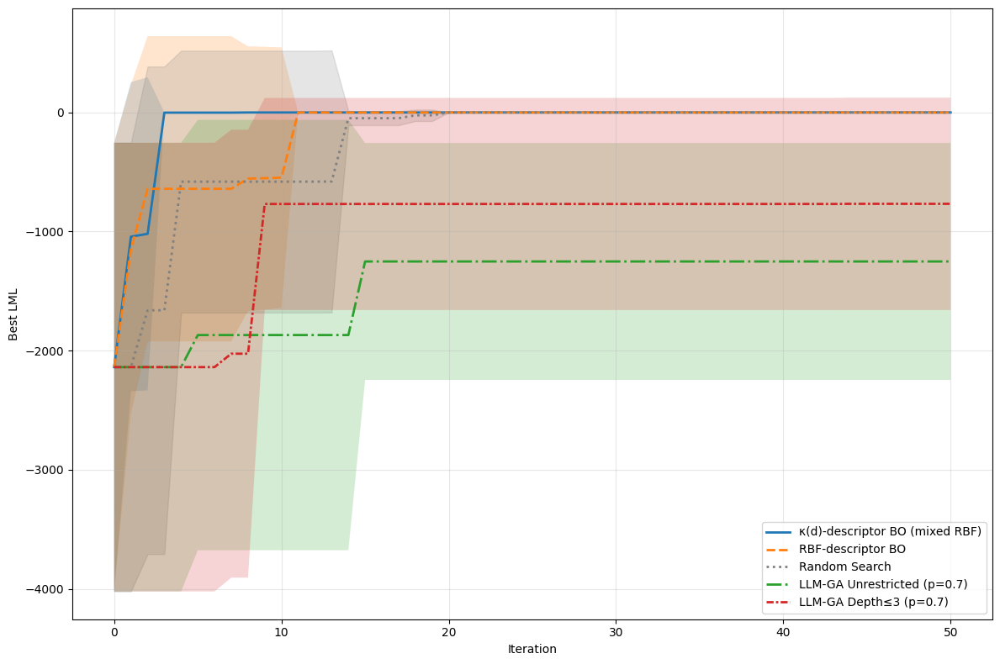


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML           Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO    100.637712      3.783995     -1.500221      0.000000  [10, 6, 13, 7, 11]            9.4       2.576820
                     RBF BO    162.789136     26.943790     -1.500221      0.000000 [17, 17, 15, 27, 6]           16.4       6.681317
              Random Search     97.844849     20.523018     -1.500226      0.000006 [48, 28, 4, 20, 13]           22.6      14.961283
LLM-GA Unrestricted (p=0.7)    444.789364     47.960851  -1252.380167    994.538510    [0, 0, 0, 5, 15]            4.0       5.830952
     LLM-GA Depth≤3 (p=0.7)    413.351573     56.016594   -768.356482    891.259959    [0, 0, 7, 44, 9]           12.0      16.407315


Saved results → ackley-results.csv
Saved summary → ackley-summary.csv
Saved plot    → ackley_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) Ackley Function Dataset
# ----------------------------------------------------------------------
x_data = torch.linspace(-5, 5, 100).unsqueeze(-1)
x_scaled = x_data * 1.0
y_raw = -20 * torch.exp(-0.2 * torch.abs(x_scaled)) \
              - torch.exp(torch.cos(2 * math.pi * x_scaled)) + 20 + math.e

y_mean = y_raw.mean()
y_std = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).reshape(-1, 1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/ackley_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/ackley-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/ackley-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/ackley-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/ackley-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/ackley_comparison_with_llm_ga.png")

## Thermal History Data


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.84 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=108, LML=-1806.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=230, LML=-71.945


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=209, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=110, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 07 → idx=130, LML=-82.087


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=19, LML=-85.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=152, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=64, LML=-1621.702


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=80, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=36, LML=-1723.897


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=20, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=134, LML=-71.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=137, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 20 → idx=174, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=212, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=143, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 26 → idx=93, LML=-71.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=214, LML=-2139.039


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 28 → idx=9, LML=-74.883


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=26, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=142, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=43, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=171, LML=-265.638


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=2, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=14, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=78, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=87, LML=-71.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=200, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=111, LML=-147.100


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=102, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=119, LML=-1482.152


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=74, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=149, LML=-71.954


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=4, LML=-81.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=160, LML=-71.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=151, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=135, LML=-73.155


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=110, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[WARN] Kernel ((PER * PER) * PER) failed: ModelFittingError
[BO] iter 07 → idx=0, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=96, LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=134, LML=-71.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=58, LML=-71.853


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=6, LML=-215.468


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=149, LML=-4.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=111, LML=-1.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=231, LML=-71.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=77, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=233, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[WARN] Kernel ((RQ * PER) + PER) failed: ModelFittingError
[BO] iter 22 → idx=39, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=228, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 24 → idx=130, LML=-73.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=70, LML=-1811.986


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=232, LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=123, LML=-106.615


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=131, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=105, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=76, LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=194, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=190, LML=-1685.350


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=117, LML=-233.146


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=10, LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=43, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=146, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=9, LML=-77.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=200, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=225, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=89, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=50, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=164, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=159, LML=-67.670


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=33, LML=-71.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=82, LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[WARN] Kernel ((RQ * PER) + PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-73.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-72.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (SE * RQ))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-2053.826


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-72.201


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (RQ * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-71.721


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (RQ * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-4.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-72.400


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-71.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * PER)... LML=-72.652


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-71.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-75.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-73.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=13 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-71.488


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER)... LML=-65.330


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER) + (PER * PER)... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-72.031


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-64.092


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-71.845


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * PER)... LML=-72.127


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * PER) + PER)... LML=-71.863


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + ((PER * PER) * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + ((PER * PER) + PER)... LML=-72.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-72.109


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-1259.127


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-69.839


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-83.814


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + (PER * PER)) * SE... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * PER) + (PER * PER) + (SE * SE))... LML=-71.772


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-72.023


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER) + ((PER * PER) * SE)... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + PER)... LML=-2.321


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-1702.063


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-65.391


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-71.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-71.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-71.844


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-71.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-75.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-84.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * PER) + (PER * PER))... LML=-71.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-75.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * RQ)... LML=-1818.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-73.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-72.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * PER)... LML=-87.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-72.201


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * PER)... LML=-72.948


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + SE)... LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + RQ)... LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-4.009


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-66.174


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * (RQ + SE))... LML=-1482.152


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-71.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * SE) + PER)... LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-24.335


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-1886.820


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * SE) + PER)... LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER + RQ) * SE)... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-81.145


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * PER)... LML=-22.390


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-72.031


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel ((SE + PER) * PER) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-72.127


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-66.922


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (PER * SE))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * PER) + SE)... LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (PER * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-71.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (PER * SE))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-31.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (PER * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-72.109


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + SE)... LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-72.426


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-69.839


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-74.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-73.913


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER * (SE + PER))... LML=-228.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-71.844


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + (PER * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-71.958


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel (PER * (SE + PER)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-5.534


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-71.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-71.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (PER * RQ))... LML=-119.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-75.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * (SE + PER))... LML=-204.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-75.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (SE * PER))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (PER * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * PER)... LML=-70.490


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * SE) + PER... LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-83.730


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (PER * PER))... LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-525.547


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-371.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (PER * SE))... LML=-77.739


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (PER * SE))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (PER * SE))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-47.782


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + SE)... LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER * (SE + PER))... LML=-75.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-60.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * (SE + PER))... LML=-72.965


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + (PER * PER))... LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-72.005


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (PER * PER))... LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-1965.065


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + (SE * PER))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-159.708


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER + SE) * PER)... LML=-78.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-102.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel (PER + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-87.914


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=108, LML=-1.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 08 → idx=0, LML=-1.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=2, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=111, LML=-1.631


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=9, LML=-84.760


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=143, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=136, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=174, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=41, LML=-75.034


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=233, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=54, LML=-730.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=14, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=89, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=35, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=235, LML=-1885.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 27 → idx=142, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=104, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=120, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=137, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=109, LML=-1394.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 34 → idx=172, LML=-1877.490


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=102, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=11, LML=-80.781


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=152, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=156, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=230, LML=-71.945


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=45, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=110, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=13, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=17, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=81, LML=-71.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=165, LML=-1480.108


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=197, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=74, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=51, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=80, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=108, LML=-1.331


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 04 → idx=0, LML=-1.373


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=1, LML=-1394.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=194, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=111, LML=-1.631


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=160, LML=-71.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=225, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=189, LML=-316.403


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=212, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=236, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=127, LML=-1818.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=139, LML=-78.240


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=51, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=64, LML=-261.468


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=171, LML=-1929.669


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=149, LML=-71.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=76, LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=105, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=45, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=214, LML=-1618.438


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=222, LML=-71.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=42, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 34 → idx=90, LML=-138.926


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=74, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=230, LML=-71.945


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=233, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=81, LML=-2.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=130, LML=-77.746


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=221, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=54, LML=-730.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=208, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=152, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=136, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=79, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=161, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE * SE) + (PER * RQ))... LML=-1938.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE * (PER + RQ)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-225.945


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-878.504


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * RQ) + (RQ * SE))... LML=-10.168


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (SE * RQ) + (PER * RQ)... LML=-9.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * PER) + RQ)... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + (RQ * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (PER + RQ)) + (PER * RQ)... LML=-1892.978


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ)) * SE... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (RQ * SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (SE * RQ) + PER)... LML=-72.464


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ) + PER... LML=-71.897


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (SE * (RQ + PER)) + (PER * RQ)... LML=-84.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=14 mutation  → (SE * RQ) + (PER * RQ)... LML=-5.237


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * RQ) + (PER * RQ) + (PER * SE)... LML=-110.621


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + (PER * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER) + (SE * (PER * RQ)) + ((SE + PER) * RQ)... LML=-177.635


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER) + (SE * RQ) + (PER * RQ) + (SE * (PER * RQ))... LML=-80.564


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (RQ * SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * RQ) + (SE + PER)... LML=-72.042


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * PER) + (PER * RQ)... LML=-1730.522


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ)) * (SE + RQ)... LML=-71.958


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + PER)... LML=-2.597


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE * PER) + (RQ * (SE + PER)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + (SE * PER)) * PER... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE * RQ) + (PER * SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-71.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + RQ)... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-15.388


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=30 crossover → (SE * RQ) + (PER * RQ)... LML=-1880.201


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (RQ * PER))... LML=-1987.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * RQ) + (SE * PER))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-6.548


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (RQ * PER))... LML=-17.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (RQ * PER))... LML=-264.535


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (RQ * PER))... LML=-84.753


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-84.977


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-68.529


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + ((SE + PER) * RQ)... LML=-80.589


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-72.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + (PER * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (PER + RQ)) + ((SE + PER) * RQ)... LML=-1724.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-69.904


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ) + (RQ * SE))... LML=-10.168


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (RQ * PER))... LML=-141.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + PER) * (SE + RQ)... LML=-7.476


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + ((SE * RQ) + PER)... LML=-75.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-71.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * RQ) + (SE * PER)) * PER... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + (PER * SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ) + (SE * PER)... LML=-80.576


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (RQ * PER))... LML=-84.994


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → SE... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (SE * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (SE * PER))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * PER) + (SE + RQ)... LML=-1712.867


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * PER) + (RQ)... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * (SE + PER))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (SE + PER))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * RQ) + PER... LML=-71.826


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → RQ... LML=-1885.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * RQ) + (PER * RQ)... LML=-82.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (SE + PER))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → RQ... LML=-1885.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → RQ... LML=-1885.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → RQ... LML=-1885.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → PER... LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-70.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-68.656


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + SE)... LML=-71.938


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-71.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-69.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER)... LML=-66.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-72.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + PER)... LML=-71.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + PER)... LML=-69.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-66.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + PER)... LML=-68.534


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-71.980


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + SE)... LML=-72.181


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-71.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER + SE)... LML=-68.348


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-71.864


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + PER)... LML=-69.729


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-71.937


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-60.648


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-6.548


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-80.688


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-67.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * RQ) + PER... LML=-71.894


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (PER + SE)... LML=-63.980


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-72.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * PER) + PER... LML=-72.617


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (PER + SE)... LML=-67.873


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-68.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + SE)... LML=-72.020


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-71.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + SE)... LML=-72.044


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (PER + SE)... LML=-72.016


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-71.961


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=171, LML=-80.001


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=0, LML=-21.872


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-149.510


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=1, LML=-1394.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=172, LML=-241.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=82, LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=63, LML=-72.060


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=39, LML=-51.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=87, LML=-17.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=111, LML=-1.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=138, LML=-5.154


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=136, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=93, LML=-72.152


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=45, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=174, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=2, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 22 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=4, LML=-738.603


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 25 → idx=6, LML=-66.015


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=8, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=9, LML=-73.142


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=10, LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=11, LML=-250.456


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=12, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=13, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=14, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=16, LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=17, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=19, LML=-85.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=20, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=22, LML=-80.202


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=23, LML=-71.694


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=26, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=27, LML=-5.154


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=28, LML=-78.240


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 46 → idx=29, LML=-1831.037


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=30, LML=-62.823


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\py

[BO] iter 48 → idx=31, LML=-79.774


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=33, LML=-71.914


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=174, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 02 → idx=36, LML=-251.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=236, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=202, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=204, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=171, LML=-214.905


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=0, LML=-154.704


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=17, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=89, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 17 → idx=111, LML=-1.310


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=63, LML=-72.060


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=87, LML=-71.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=149, LML=-72.755


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=179, LML=-149.539


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=45, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=136, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=212, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=186, LML=-71.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=123, LML=-39.650


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=177, LML=-94.038


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=39, LML=-73.142


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=42, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=224, LML=-81.723


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=90, LML=-74.056


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=81, LML=-71.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=80, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=16, LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=169, LML=-34.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=101, LML=-81.723


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=43, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=220, LML=-71.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=108, LML=-1.359


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=161, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=232, LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=31, LML=-268.247


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationW

[LLM-GA] iter=01 crossover → ((SE * RQ) + (PER * RQ))... LML=-255.984


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + (SE * (RQ + PER))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ) + PER... LML=-71.884


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * PER) + (SE * RQ))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (RQ + (PER * RQ)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ) + (PER * RQ)... LML=-1997.451


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + (SE * (RQ + PER)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * (RQ + PER)) + (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + (SE * (PER + RQ)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + (SE * (PER + RQ))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * PER) + ((SE * RQ) * PER)... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE * RQ) + PER) * SE... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * RQ) + ((SE + PER) * RQ)... LML=-80.589


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + ((SE + PER) * RQ)... LML=-80.589


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (PER + RQ)) + (SE * RQ)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER) + (SE * (PER + RQ))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (PER + RQ)) + PER... LML=-63.832


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ) + (PER * RQ)... LML=-86.440


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ) + PER... LML=-71.883


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * RQ) + (SE * PER) + (RQ * PER)... LML=-839.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * RQ) + PER... LML=-17.188


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * RQ) + (PER * RQ)... LML=-874.460


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * RQ) + ((SE + RQ) * PER)... LML=-207.897


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * RQ) + PER) * SE... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * RQ) + PER) * (SE + PER)... LML=-72.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * RQ) + (PER * RQ)... LML=-85.094


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * RQ) + (PER * RQ)... LML=-372.591


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * RQ) + (PER * RQ)... LML=-185.212


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + (PER * RQ)... LML=-268.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE * RQ) + (PER * RQ)... LML=-57.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + (PER * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * (PER + RQ)) + (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * RQ) + (PER * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE * RQ) + (PER * RQ) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * RQ) + (PER * RQ)... LML=-9.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + (SE * PER)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * RQ) + (PER * RQ)... LML=-1735.639


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + (PER * RQ)... LML=-85.131


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (RQ * PER))... LML=-5.138


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (RQ * PER))... LML=-84.191


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (RQ * PER))... LML=-1554.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-6.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-129.320


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-621.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → PER... LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-68.534


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-71.951


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + SE)... LML=-71.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-71.827


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-71.880


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER + SE)... LML=-72.025


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-71.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + SE)... LML=-72.229


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-71.950


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER + SE)... LML=-71.836


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER + SE)... LML=-74.124


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + SE)... LML=-63.908


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + SE)... LML=-71.826


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-71.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-71.839


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-68.567


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + SE)... LML=-68.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-72.007


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + SE)... LML=-73.149


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-65.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + SE)... LML=-75.358


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-72.085


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + SE)... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-72.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-71.996


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-2007.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=26 crossover → (PER * RQ) + (SE * RQ)... LML=-1884.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-69.842


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel (PER + SE) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-73.135


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-73.092


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER + SE)... LML=-71.836


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (PER + SE)... LML=-68.840


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-73.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + SE)... LML=-39.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-75.435


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-72.050


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-71.940


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER + SE)... LML=-71.955


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + SE)... LML=-71.984


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-674.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * RQ) + PER)... LML=-71.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-69.884


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + SE)... LML=-71.867


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + SE)... LML=-71.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-71.968


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-71.720


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + SE)... LML=-136.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-71.956


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-72.040


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + PER)... LML=-71.965


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + PER)... LML=-71.828


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-71.813


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER + SE)... LML=-71.656


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + SE)... LML=-71.894


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + SE)... LML=-71.817


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (RQ + PER))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (PER + SE)... LML=-71.798


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + SE)... LML=-72.051


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (PER + SE)... LML=-71.880


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=171, LML=-71.679


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=172, LML=-1701.505


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-1.415


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=136, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=143, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 10 → idx=111, LML=-1.454


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=0, LML=-1.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=137, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=23, LML=-71.899


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=142, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 19 → idx=130, LML=-52.383


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=54, LML=-730.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=19, LML=-85.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=152, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=164, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=87, LML=-14.036


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=20, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=213, LML=-71.749


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=45, LML=-5.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=35, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=189, LML=-79.553


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=231, LML=-71.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=63, LML=-72.060


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=43, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=222, LML=-71.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=122, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=13, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=9, LML=-73.559


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=85, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=81, LML=-71.831


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=26, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=115, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=162, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=207, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=51, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=119, LML=-93.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=132, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=87, LML=-71.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=131, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=104, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=148, LML=-79.446


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=43, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=189, LML=-6.453


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=149, LML=-6.740


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=231, LML=-71.822


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=212, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=75, LML=-2.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=141, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=143, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=51, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=209, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=23, LML=-71.899


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 24 → idx=135, LML=-130.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=208, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=144, LML=-71.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=203, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=142, LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=33, LML=-71.902


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=68, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=81, LML=-12.460


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 32 → idx=111, LML=-1481.897


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=127, LML=-1818.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=8, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=16, LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=0, LML=-22.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=171, LML=-1991.360


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=227, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=160, LML=-71.931


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=120, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=173, LML=-149.539


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=108, LML=-257.883


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=24, LML=-72.492


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=30, LML=-74.637


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=205, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=72, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=57, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=50, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationW

[LLM-GA] iter=01 crossover → (SE + (PER * RQ))... LML=-1753.842


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * (SE + RQ))... LML=-28.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER) + (SE * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * PER) + ((SE + PER) * RQ)... LML=-80.589


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * RQ) + PER)... LML=-72.143


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ) + PER... LML=-70.207


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + (SE + PER))... LML=-71.644


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-4.679


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + PER) * RQ... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-2.683


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * (PER + RQ))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-2.599


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * RQ))... LML=-398.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-267.414


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE * RQ) + PER)... LML=-72.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → ((SE * RQ) + PER)... LML=-12.460


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE * RQ) + (SE + PER))... LML=-71.132


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-60.670


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + (RQ * PER))... LML=-93.737


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (RQ * PER))... LML=-1960.198


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * RQ) + (SE * PER))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-74.196


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-63.817


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + (SE + PER))... LML=-71.658


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (RQ * PER))... LML=-189.671


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * RQ) + (SE + PER))... LML=-75.981


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + (SE + PER))... LML=-72.010


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (RQ * PER))... LML=-84.455


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * RQ) + ((SE + PER) * RQ)... LML=-80.589


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-66.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * RQ) + (SE + PER))... LML=-71.901


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-69.709


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (RQ * PER))... LML=-1716.209


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * RQ) + (SE + PER))... LML=-71.878


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (RQ * PER))... LML=-84.596


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-72.632


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * RQ) + (SE + PER))... LML=-74.093


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (RQ * PER))... LML=-1978.189


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE * RQ) + (SE + PER))... LML=-71.700


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-72.355


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE * RQ) + (SE + PER))... LML=-76.815


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * RQ) + (SE + PER))... LML=-71.892


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * RQ) + (SE * PER))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-2004.476


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + (SE * PER))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-69.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (RQ * PER))... LML=-84.929


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * RQ) + (SE + PER))... LML=-71.611


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * (SE + RQ) * PER)... LML=-6.752


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * (SE + RQ) * RQ)... LML=-71.953


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * (SE + RQ) * RQ)... LML=-71.945


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * (SE * RQ))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=45 mutation  → ((SE + RQ) * (SE + PER))... LML=-1046.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * RQ) + (SE + PER))... LML=-71.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * (SE + RQ) * PER) + (SE * RQ)... LML=-87.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * (SE + RQ) * PER * RQ)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * (SE + RQ) + PER)... LML=-74.642


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel (PER + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + RQ)... LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-4.679


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER + RQ))... LML=-71.458


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + (PER * RQ))... LML=-2.683


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-72.109


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-398.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + RQ)... LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * RQ)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * RQ) + (SE * RQ))... LML=-86.063


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER * RQ) + (SE * RQ))... LML=-1697.506


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-9.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-71.835


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-72.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-74.196


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE + PER)... LML=-63.817


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-74.571


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (PER * RQ))... LML=-80.776


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-70.763


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * RQ) + (SE * RQ))... LML=-260.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * RQ) + (SE * RQ))... LML=-254.539


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-82.140


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-1696.606


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * RQ) + (SE * RQ))... LML=-268.079


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-80.496


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-58.717


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-73.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * (SE + RQ))... LML=-64.797


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-1185.213


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * (SE + RQ))... LML=-58.987


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-1851.183


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-2004.476


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * RQ) + RQ)... LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-82.912


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * SE)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-271.384


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + SE)... LML=-54.886


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-80.462


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * RQ) + (SE * RQ))... LML=-1814.572


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-24.327


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=34 crossover → ((PER * RQ) + (SE * RQ))... LML=-1933.175


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-344.682


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * RQ) + SE)... LML=-84.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (SE + (PER * RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * SE) + RQ... LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (SE * RQ))... LML=-2062.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * RQ) + (SE * RQ)... LML=-1933.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-111.868


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-80.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * RQ) + (SE * RQ))... LML=-83.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-1261.650


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * RQ) + RQ)... LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-30.743


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=43 crossover → (PER * RQ) + (SE * RQ)... LML=-84.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-81.372


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER * RQ) + (SE * RQ)... LML=-1985.936


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-1988.468


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * RQ) + SE)... LML=-10.426


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-85.159


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-82.378


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * RQ) + (SE * RQ))... LML=-80.977


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-23.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-272.137


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-1977.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * RQ))... LML=-144.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-193.081


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * RQ) + SE)... LML=-49.033


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recomm

[BO] iter 01 → idx=4, LML=-1217.445


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=2, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=227, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=234, LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=111, LML=-1.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[BO] iter 07 → idx=0, LML=-1801.078


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=144, LML=-1985.819


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=113, LML=-74.870


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=206, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=41, LML=-96.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=233, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=165, LML=-1260.084


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=6, LML=-97.930


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=120, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=179, LML=-149.539


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=83, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=192, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)


[WARN] Kernel ((RQ * PER) + PER) failed: ModelFittingError
[BO] iter 22 → idx=39, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 23 → idx=1, LML=-1394.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=8, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=9, LML=-72.435


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=10, LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=11, LML=-84.067


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=12, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 32 → idx=13, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=16, LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=17, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=19, LML=-85.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=20, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=22, LML=-80.202


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=23, LML=-71.730


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=24, LML=-74.218


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=25, LML=-85.586


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=26, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=27, LML=-5.154


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=28, LML=-78.240


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=29, LML=-1831.037


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=30, LML=-78.892


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=31, LML=-251.519


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=33, LML=-72.926


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=34, LML=-71.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=127, LML=-1818.502


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=66, LML=-269.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=41, LML=-77.071


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=125, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=218, LML=-71.551


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=215, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=112, LML=-176.161


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=196, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=0, LML=-22.203


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=216, LML=-67.421


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=113, LML=-73.033


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=1, LML=-1394.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=47, LML=-71.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=183, LML=-92.653


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 15 → idx=123, LML=-71.675


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=111, LML=-1.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=8, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=92, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=174, LML=-2193.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=3, LML=-2.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=108, LML=-1.312


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=2, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=18, LML=-3.824


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=149, LML=-69.903


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[WARN] Kernel ((SE + PER) * PER) failed: ModelFittingError
[BO] iter 25 → idx=90, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=4, LML=-71.539


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=95, LML=-71.551


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=105, LML=-81.103


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=147, LML=-1.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=32, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=54, LML=-730.697


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=5, LML=-63.630


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, 

[BO] iter 33 → idx=6, LML=-259.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=7, LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=9, LML=-73.143


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=10, LML=-18.499


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=11, LML=-84.477


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=12, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=13, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=15, LML=-75.812


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=225, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 42 → idx=16, LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=77, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=17, LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=154, LML=-256.626


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=19, LML=-85.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=233, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=80, LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=20, LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=21, LML=-1.343


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original

[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-85.152


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * (RQ + SE)) + (SE * SE)... LML=-1627.955


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-32.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-36.149


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * SE) + RQ... LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + PER)... LML=-71.954


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-262.244


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * (SE + RQ))... LML=-1935.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[WARN] Kernel (PER * (SE + RQ)) failed: ModelFittingError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-1251.416


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * (SE + RQ))... LML=-78.224


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-624.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * RQ) + (PER * RQ))... LML=-1774.168


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER + (SE * (RQ + SE)))... LML=-63.832


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((PER * RQ) + (SE * SE))... LML=-96.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-74.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER + (SE * RQ) + (SE * SE))... LML=-71.863


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER * (SE + RQ))... LML=-6.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * (SE + RQ)) + (SE * SE)... LML=-267.918


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * (SE + RQ)) + (RQ * SE)... LML=-267.918


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-59.883


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * (SE + (RQ * SE)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-1691.031


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * (SE + RQ))... LML=-254.075


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-536.995


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + SE)... LML=-42.053


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-82.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER + SE) * RQ)... LML=-12.258


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-79.884


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * (SE + RQ))... LML=-1547.967


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * (RQ + PER))... LML=-71.942


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER * (SE + RQ))... LML=-265.028


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-6.110


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER + SE) * (RQ + SE))... LML=-79.594


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (PER * RQ))... LML=-1791.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * (SE + RQ))... LML=-273.939


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * RQ) + (SE * SE))... LML=-71.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-102.956


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER + SE) * (SE + SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-1307.833


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + (SE * SE))... LML=-88.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-82.909


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * (SE * RQ))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-78.212


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * (SE + RQ))... LML=-6.431


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * (SE + RQ)) + (PER * RQ)... LML=-11.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * (SE + (RQ * SE)))... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-2006.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * (RQ + SE)) + (SE * RQ)... LML=-1627.955


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * (SE + RQ))... LML=-2231.116


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * RQ) + (SE * SE))... LML=-83.877


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-265.854


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * (SE + RQ))... LML=-85.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (RQ * PER))... LML=-5.962


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + SE)... LML=-1641.637


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=40 crossover → ((PER * RQ) + SE)... LML=-847.005


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-11.733


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + (RQ * SE)... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-10.480


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * (RQ + SE))... LML=-85.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-1719.182


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * RQ) + (PER * (SE + RQ))... LML=-66.864


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * (SE + RQ)) + (SE * SE))... LML=-267.918


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + RQ) * PER... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-711.751


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-267.918


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-1472.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * (SE + RQ)) + ((SE + RQ) * PER)... LML=-297.340


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-1662.388


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-267.918


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (PER * RQ))... LML=-288.203


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-5.571


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * SE) + RQ... LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-80.611


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * RQ) + SE... LML=-42.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-32.825


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (PER * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-1867.298


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER + (SE * SE))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-32.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * RQ) + SE... LML=-85.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-36.149


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * SE) + (SE * SE))... LML=-71.941


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-80.426


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER * (SE + RQ))... LML=-83.338


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER + SE) * RQ)... LML=-83.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((RQ + SE) * PER)... LML=-269.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * (SE + RQ))... LML=-64.715


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=11 crossover → (PER * (RQ + SE))... LML=-615.789


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * SE) + RQ... LML=-103.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-55.505


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-1251.416


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (PER * SE))... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-1976.107


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-624.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-74.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → SE... LML=-71.944


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-1665.668


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-102.411


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-31.282


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-59.883


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-64.419


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * PER)... LML=-78.114


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-536.995


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-80.491


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-82.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (RQ + (SE * SE))... LML=-92.653


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-79.884


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying origina

[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-6.110


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE + (PER * RQ))... LML=-84.606


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER) + RQ... LML=-450.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-1791.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-267.536


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-187.841


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (PER + RQ)... LML=-80.998


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-84.726


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-934.705


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-71.943


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → PER... LML=-1.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-72.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + SE)... LML=-72.087


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-68.798


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + (SE * RQ))... LML=-13.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-73.295


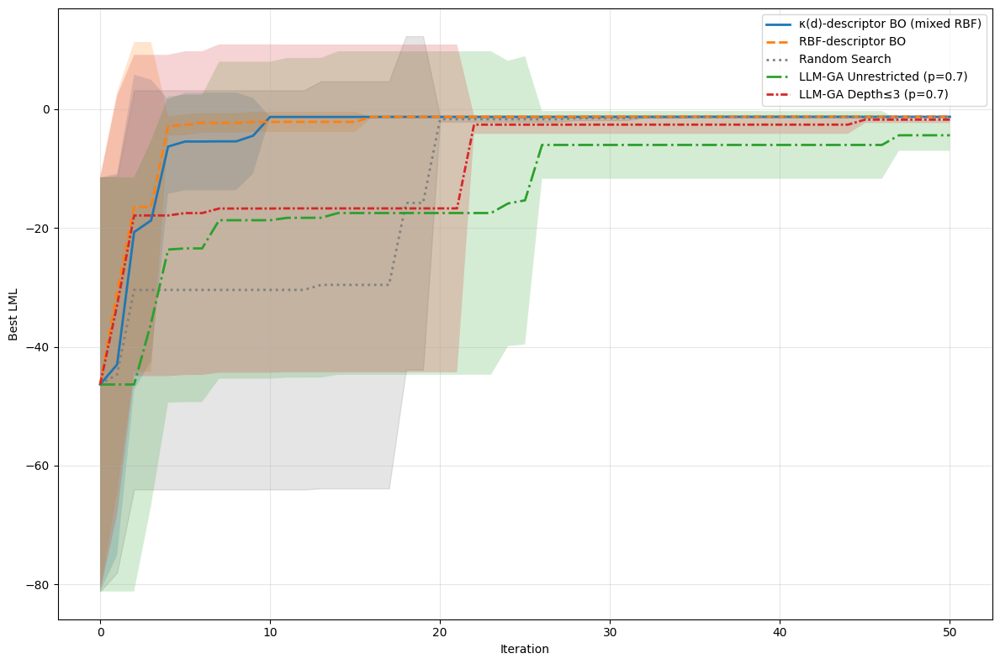


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML           Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     64.679475     10.979314     -1.278777      0.039209  [29, 9, 10, 17, 5]           14.0       8.438009
                     RBF BO    103.023834     17.470672     -1.248252      0.000000  [5, 16, 22, 5, 29]           15.4       9.436101
              Random Search     59.055207     10.210849     -1.298108      0.044168 [32, 28, 2, 35, 13]           22.0      12.537942
LLM-GA Unrestricted (p=0.7)    382.125056     55.711999     -4.389312      2.614296  [0, 25, 47, 13, 0]           17.0      17.652195
     LLM-GA Depth≤3 (p=0.7)    362.447934     76.820947     -1.759526      0.576497  [36, 22, 7, 5, 45]           23.0      15.709870


Saved results → timetemp-results.csv
Saved summary → timetemp-summary.csv
Saved plot    → timetemp_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) REAL DATASET (100 linspaced samples)
# ----------------------------------------------------------------------
DATA_CSV = "timetemp.csv"   # your uploaded file

df_data = pd.read_csv(DATA_CSV)

# Choose input & output columns
# Example: Time → input, Temp → target
x_all = df_data["Time"].values
y_all = df_data["Temp"].values

# Sort by x (important for interpolation)
idx = np.argsort(x_all)
x_all = x_all[idx]
y_all = y_all[idx]

# Create 100 linspace X points
x_lin = np.linspace(x_all.min(), x_all.max(), 100)

# Interpolate real target values onto these 100 points
y_lin = np.interp(x_lin, x_all, y_all)

# Convert to torch
x_data = torch.tensor(x_lin, dtype=torch.double).unsqueeze(-1)
y_raw  = torch.tensor(y_lin, dtype=torch.double)

# Normalize Y same as before
y_mean = y_raw.mean()
y_std  = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).unsqueeze(-1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/timetemp_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/timetemp-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/timetemp-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/timetemp-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/timetemp-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/timetemp_comparison_with_llm_ga.png")

## Mauna Loa Data


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.70 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=192, LML=-478.862


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=171, LML=-1972.139


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=39, LML=-1986.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=230, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=209, LML=-4869.646


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=181, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=224, LML=-117.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=32, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=152, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 15 → idx=174, LML=-1877.037


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=215, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=63, LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=146, LML=-2144.880


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=177, LML=-2064.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=191, LML=-117.266


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=58, LML=-2210.872


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=64, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 30 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=65, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=223, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=162, LML=-117.209


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=26, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=196, LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you f

[BO] iter 39 → idx=204, LML=-741.406


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=117, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=123, LML=-123.175


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=159, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=150, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=229, LML=-117.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=136, LML=-117.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=25, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=120, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=201, LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=143, LML=-117.281
[WARN] Kernel ((RQ * RQ) + PER) failed: ModelFittingError
[BO] iter 50 → idx=45, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=206, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=143, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=214, LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=39, LML=-1986.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=55, LML=-117.255


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=32, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=225, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=233, LML=-4871.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=96, LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=7, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=231, LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=46, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=134, LML=-4945.667


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=56, LML=-117.258


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=30, LML=-123.558


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=89, LML=-124.003


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=160, LML=-117.170


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=226, LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=139, LML=-117.268


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=212, LML=-4884.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=102, LML=-117.249


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=156, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=122, LML=-116.623


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=64, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=215, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=45, LML=-117.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=82, LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=172, LML=-2100.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=185, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=116, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=235, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=199, LML=-47.098


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=183, LML=-1967.480


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=158, LML=-47.100


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=152, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=105, LML=-117.177


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=200, LML=-81.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ + SE))... LML=-117.259


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (SE * PER))... LML=-117.481


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * SE) + (PER * RQ))... LML=-117.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * PER)... LML=-120.690


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * PER) + (SE * RQ) + PER)... LML=-4615.640


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * PER) + (SE * RQ) + PER)... LML=-4615.640


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * SE) + (PER * RQ))... LML=-117.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((RQ * (RQ + SE)) + ((PER * PER) * SE))... LML=-117.225


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((RQ * (RQ + SE)) + (PER * PER))... LML=-117.222


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * SE) + (RQ * (PER + SE)))... LML=-2408.663


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE * SE) + PER)... LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((RQ * (RQ + SE)) + (PER * PER))... LML=-117.222


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-117.224


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((PER * SE) + (PER * RQ))... LML=-117.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((PER * RQ) + (SE * PER))... LML=-117.481


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + (PER * SE))... LML=-702.614


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-117.224


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((RQ * (RQ + SE)) + PER)... LML=-117.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-117.224


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((PER * RQ) + (PER * SE))... LML=-117.844


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((RQ * (RQ + SE)) + ((PER * PER) + PER))... LML=-4594.365


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * RQ) + (SE * PER))... LML=-117.481


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * SE) + (PER * RQ))... LML=-117.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + (SE * RQ) + PER)... LML=-4615.640


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (RQ * PER))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * PER) + (PER * RQ))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * PER) + (RQ * SE) + PER)... LML=-4192.147


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (RQ * (SE + (PER * PER)))... LML=-117.247


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((RQ * (RQ + SE)) + (PER * PER))... LML=-117.222


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (RQ * SE) + PER)... LML=-4192.147


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + SE)... LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER * RQ) + (PER * PER))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * SE) + RQ)... LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (PER * RQ))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * PER) + SE)... LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((PER * PER) + (PER * RQ))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (RQ * PER) + SE... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * (PER + SE))... LML=-121.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (RQ * (SE + PER))... LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((PER * PER) + (PER * SE))... LML=-702.614


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * (PER + RQ))... LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * RQ) + PER... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → SE... LML=-4869.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((PER * PER) + (PER * SE))... LML=-2195.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (RQ * PER) + SE... LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((PER * PER) + (PER * SE))... LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * SE) + PER)... LML=-1898.652


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (RQ * PER) + SE... LML=-2121.836


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * PER))... LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((PER * RQ) + (RQ * SE))... LML=-117.463


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((PER * PER) + (PER * RQ))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((PER * PER) + (SE * RQ))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + (PER * SE))... LML=-4110.240


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * RQ) + (SE * RQ))... LML=-117.399


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER * RQ) + (SE * PER))... LML=-117.481


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (RQ * PER) + SE... LML=-2231.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER * (PER + RQ))... LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (RQ * PER) + SE... LML=-117.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((PER * RQ) + (SE * PER))... LML=-117.481


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((PER * RQ) + PER)... LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + (PER * RQ))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + SE)... LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((PER * PER) + (SE * PER))... LML=-2177.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * PER) + (RQ * SE))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=172, LML=-2100.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=236, LML=-4869.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=138, LML=-1910.070


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=25, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=143, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=192, LML=-478.862


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=194, LML=-553.315


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=125, LML=-117.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=92, LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 15 → idx=171, LML=-1972.139


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=136, LML=-117.299


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 18 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=26, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 21 → idx=156, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=28, LML=-117.203


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=82, LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=31, LML=-111.616


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=235, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=46, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=178, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=108, LML=-117.257
[WARN] Kernel ((RQ * RQ) + PER) failed: ModelFittingError
[BO] iter 30 → idx=45, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 35 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=6, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=7, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=8, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=9, LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=10, LML=-2092.895


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=11, LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=12, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=13, LML=-117.208


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=14, LML=-1103.390


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 45 → idx=15, LML=-1898.652


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=16, LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=17, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=19, LML=-117.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=20, LML=-551.701


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=181, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=9, LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=77, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=143, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=45, LML=-117.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=113, LML=-121.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=214, LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=94, LML=-117.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=40, LML=-2087.077


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=105, LML=-117.177


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=180, LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=141, LML=-1014.397


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=163, LML=-47.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=135, LML=-1046.258


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=203, LML=-117.220


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=177, LML=-2064.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=80, LML=-81.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=134, LML=-4945.667


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=122, LML=-551.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=160, LML=-117.170


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=224, LML=-117.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=25, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=63, LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=230, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=182, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=178, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=207, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=209, LML=-4869.646


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=221, LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=188, LML=-117.247


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=11, LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[WARN] Kernel (PER + (RQ * RQ)) failed: ModelFittingError
[BO] iter 49 → idx=136, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=51, LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 

[LLM-GA] iter=01 crossover → ((SE * (SE * SE)) + (RQ * (SE + SE)))... LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * PER) + (RQ * SE))... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (SE * PER))... LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * (RQ + (SE * SE)))... LML=-112.864


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (RQ * PER))... LML=-117.297


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * (SE + RQ))... LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (RQ * PER))... LML=-2557.992


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (RQ + (SE * SE))) + (RQ + (SE * SE))... LML=-117.085


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE * (RQ + (SE * SE))) + (SE * (RQ + (SE * SE)))... LML=-111.256


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE + RQ) * (SE + PER))... LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * (RQ + (SE * SE))) + (RQ + (SE * SE)))... LML=-117.085


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER))... LML=-107.042


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + (SE * SE))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + SE)... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * (RQ + (SE * PER))) + ((SE * PER) * RQ)... LML=-115.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER) + RQ)... LML=-116.968


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + SE)) + (SE *... LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ))... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE * RQ))... LML=-117.222


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (RQ + SE)) + (SE * (RQ + (SE * SE)))... LML=-112.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (RQ * PER))... LML=-2170.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (((SE... LML=-116.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + (RQ * PER)))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + (RQ * PER))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (RQ + (SE * SE))) + ((SE * PER) * (RQ + SE))... LML=-2631.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + ((SE ... LML=-116.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + PER))... LML=-730.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + (SE * (RQ + (... LML=-117.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + SE)) * (SE +... LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE *... LML=-111.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ))... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ + PER))... LML=-735.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + PER))... LML=-730.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + ((SE ... LML=-117.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE *... LML=-111.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (((SE... LML=-116.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (RQ * PER))... LML=-2235.586
[WARN] Kernel ((((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE * PER)) * (SE + RQ)) failed: SyntaxError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) * (SE +... LML=-117.277


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (((SE... LML=-116.793


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (RQ * PER))... LML=-117.272


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + (RQ * PER))... LML=-4946.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (RQ + SE)) * PER... LML=-117.288


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + ((SE ... LML=-117.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE * RQ) + (PER * (SE + RQ)))... LML=-122.855


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ) + (SE * ... LML=-111.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + (RQ * PER))... LML=-117.300


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE *... LML=-111.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ))... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ))... LML=-107.875


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE + (RQ * PER)) * SE)... LML=-1438.160


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * ((SE + RQ) + (SE *... LML=-110.438


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + PER))... LML=-730.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE * RQ) + (PER * SE))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE *... LML=-111.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * (RQ + (SE * SE))) + ((SE * PER) * (RQ + SE))... LML=-2631.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ) + (PER * SE)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (((SE * (RQ + (SE * SE))) + (SE * PER)) * (SE + RQ)) + (SE *... LML=-117.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-111.759


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * RQ) + RQ)... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE * RQ) + RQ)... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + (SE * RQ))... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + SE... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (RQ * SE))... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + SE... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → RQ... LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (RQ + (SE * PER))... LML=-1967.480


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + SE... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * RQ) + (SE * PER)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * RQ) + SE... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (SE * RQ))... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (RQ + SE)... LML=-117.266


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (RQ + RQ))... LML=-112.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * RQ)... LML=-111.759


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * RQ) + (SE * PER)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + RQ)... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * RQ) + SE... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * RQ) + (SE * PER)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * RQ) + (SE * PER)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + RQ... LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * RQ) + (SE * RQ)... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE * RQ) + (SE * RQ))... LML=-117.289


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 03 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=89, LML=-124.003


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=143, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=88, LML=-117.111


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=207, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=74, LML=-113.525


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=149, LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=233, LML=-4871.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=50, LML=-81.007


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=172, LML=-2100.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=94, LML=-117.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=156, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=82, LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 21 → idx=92, LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=6, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 23 → idx=138, LML=-1910.070


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=206, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=116, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 27 → idx=159, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=98, LML=-117.266


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=90, LML=-120.690


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 32 → idx=185, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=136, LML=-117.266


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 36 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=51, LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=165, LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=137, LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 42 → idx=150, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=45, LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=32, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 45 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=115, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=87, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=8, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=206, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=185, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=190, LML=-117.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=45, LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=174, LML=-1877.037


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=41, LML=-117.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=188, LML=-117.247


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=179, LML=-117.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=205, LML=-81.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=152, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=107, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=131, LML=-117.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=113, LML=-121.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=160, LML=-117.170


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=28, LML=-1810.037


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=12, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=212, LML=-4884.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=10, LML=-2092.895


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=214, LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=43, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=143, LML=-117.281


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=189, LML=-117.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=149, LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=38, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=236, LML=-4869.802


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=125, LML=-117.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=155, LML=-117.244


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=23, LML=-4945.667


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=220, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=106, LML=-117.254


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=186, LML=-117.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=148, LML=-117.044


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=225, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=67, LML=-122.328


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=56, LML=-117.258


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=136, LML=-117.248


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE * RQ) + (PER * RQ))... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE * RQ) + (PER * RQ) + PER)... LML=-117.709


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE * RQ) + (PER * RQ))... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-553.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * (RQ + (SE + PER)))... LML=-111.463


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * (RQ + (SE + PER)))... LML=-111.463


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + (SE * (RQ + PER))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (RQ * PER))... LML=-2224.198


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * PER) + (SE * RQ)... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * RQ) + (SE * PER) + (RQ * PER)... LML=-117.329


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * RQ) + (SE * (RQ + PER))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * (SE + PER))... LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-117.212


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (RQ * PER))... LML=-117.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (RQ * PER))... LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (RQ * PER))... LML=-2063.989


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + ((PER + RQ) * PER)... LML=-2357.602


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER + RQ)... LML=-117.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-117.212


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (RQ * PER))... LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * (RQ + SE))... LML=-117.220


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * RQ) + (SE * PER)) * RQ... LML=-117.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * (SE + PER))... LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + (PER * RQ)) * PER... LML=-117.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE * RQ) + (PER * RQ))... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE * (RQ + (SE + PER)))... LML=-111.463


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE * (RQ + PER)) + (SE * RQ)... LML=-117.212


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + (SE * (RQ + (SE * PER)))... LML=-117.190


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (RQ * PER))... LML=-2016.022


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (RQ + (SE + PER))) + (SE * RQ)... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * (RQ + PER)) + (SE * (RQ + (SE + PER)))... LML=-2279.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER) * RQ... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * RQ) + PER) * SE... LML=-117.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * RQ) + (SE * (RQ + PER))... LML=-117.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (RQ * PER))... LML=-1974.612


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + (SE * (RQ + (PER * SE)))... LML=-117.191


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-119.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * (RQ + PER)) + ((SE * RQ) * PER)... LML=-117.187


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * (RQ + PER))... LML=-117.261


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + (RQ * (SE + PER))... LML=-119.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (RQ * PER))... LML=-117.293


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * RQ) + (SE * PER)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * RQ) + (PER * RQ)... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (SE * PER))... LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER)... LML=-553.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * (RQ + SE))... LML=-117.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * (SE + RQ))... LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + (PER * SE)... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * PER) + (RQ * SE)... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE * PER) + (PER * RQ)... LML=-117.480


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * RQ) + (SE * PER))... LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-117.267


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * RQ) + (PER * RQ)... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * RQ) + (PER * RQ)... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) + SE)... LML=-2139.735


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * PER) + (PER * RQ)... LML=-117.480


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (SE * PER))... LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=233, LML=-4871.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=181, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=161, LML=-117.201


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 04 → idx=65, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=26, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=123, LML=-123.175


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-1972.139


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=180, LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=46, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=162, LML=-117.209


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=159, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=43, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=169, LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=223, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=115, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=117, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=196, LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=187, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=74, LML=-695.990


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=173, LML=-1942.202


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=186, LML=-117.368


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=192, LML=-478.862


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=31, LML=-111.616


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=61, LML=-117.152


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=190, LML=-117.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=19, LML=-117.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 38 → idx=7, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=118, LML=-117.411


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=125, LML=-117.250


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=206, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=158, LML=-47.100


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=150, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=82, LML=-117.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=200, LML=-81.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=28, LML=-935.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=165, LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=172, LML=-2100.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=163, LML=-47.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=89, LML=-124.003


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=131, LML=-117.291


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=160, LML=-117.170


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=212, LML=-4884.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=235, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=139, LML=-935.211


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=226, LML=-117.280


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=227, LML=-123.756


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=157, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=171, LML=-1972.139


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=214, LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=12, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=156, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=26, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=49, LML=-47.095


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=191, LML=-117.266


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=25, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=30, LML=-123.558


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=190, LML=-117.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=178, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=202, LML=-112.791


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=17, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=44, LML=-47.100


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=228, LML=-117.177


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=152, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=92, LML=-117.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=51, LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=6, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=7, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=45, LML=-117.283


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=47, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=97, LML=-117.122


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=194, LML=-4795.755


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=185, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * (PER + SE))... LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER) + (PER * RQ)... LML=-2180.899


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + RQ) * PER) + SE... LML=-117.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + RQ) * PER) + (SE * (SE + RQ))... LML=-117.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (((SE + RQ) * PER) + SE) * (SE + RQ)... LML=-112.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE * PER) + RQ) * (SE + RQ)... LML=-1447.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER) + (PER * RQ)... LML=-2180.899


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (((SE * RQ) + PER) * SE)... LML=-117.238


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (((SE + RQ) * PER) + (SE * PER))... LML=-117.234


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (((SE * PER) + RQ) * SE)... LML=-111.624


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (((SE * PER) + (SE * RQ)) * (SE + PER))... LML=-117.237


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * PER) + (RQ * SE))... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + ((SE + RQ) * RQ))... LML=-117.227


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * PER) + (RQ * SE))... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (((SE * PER) + (SE * RQ)) * PER)... LML=-117.233


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (((SE + RQ) * PER) + SE)... LML=-117.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (((SE * PER) + (RQ * SE)) * PER)... LML=-117.233


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + RQ) * PER) + (SE * RQ)... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (RQ * (SE + RQ)))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (RQ * SE))... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (((SE + RQ) * PER) + ((SE * RQ) + SE))... LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (((SE * PER) + RQ) * PER)... LML=-117.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (((SE + RQ) * PER) + SE)... LML=-117.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (((SE * PER) + RQ) * (SE + RQ))... LML=-1447.314


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (RQ * SE))... LML=-117.231


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (((SE + RQ) * PER) + SE)... LML=-117.197


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (((SE * PER) + SE) * RQ)... LML=-2209.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (((SE + RQ) * PER) + RQ) * SE... LML=-99.904


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (((SE + RQ) * PER) + RQ) * (SE + RQ)... LML=-117.150


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (((SE + RQ) * PER) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (((SE + RQ) * PER) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (((SE * PER) + (RQ * SE)) * PER)... LML=-117.233


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE * PER) + RQ)... LML=-1964.157
[WARN] Kernel ((((SE + RQ) * PER) + SE) * RQ) + (SE * PER)) failed: SyntaxError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (((SE + RQ) * PER) + RQ) * (SE + RQ)... LML=-117.150


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (((SE + RQ) * PER) + SE) * (PER + RQ)... LML=-939.164


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (((SE + RQ) * PER) + SE) * RQ... LML=-117.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (((SE + RQ) * PER) + SE) * RQ... LML=-117.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (((SE * PER) + (SE * RQ)) * SE)... LML=-117.233


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE * PER) + RQ) * SE... LML=-111.624


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (((SE + RQ) * SE) + PER)... LML=-117.296


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (((SE + RQ) * PER) + (SE * RQ))... LML=-122.530


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (((SE + RQ) * PER) + RQ) * (SE + RQ)... LML=-117.150


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE * PER) + RQ)... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (((SE + RQ) * PER) + SE) * RQ... LML=-117.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * RQ) + SE)... LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + SE) * RQ)... LML=-111.616


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (PER * PER))... LML=-117.223


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * PER)... LML=-553.101


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) + RQ)... LML=-117.354


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * SE))... LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * RQ) + SE)... LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE * RQ) + (PER * RQ)... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * RQ) + PER... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((PER * RQ) + SE)... LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE * RQ) + (PER * RQ)... LML=-117.424


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * RQ)... LML=-117.420


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (RQ * SE))... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + (PER * RQ))... LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=192, LML=-478.862


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=227, LML=-123.756


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=230, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=15, LML=-1898.652


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=88, LML=-117.111


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=104, LML=-4869.646


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=2, LML=-471.305


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=6, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=7, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=8, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=9, LML=-118.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=10, LML=-2092.895


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 20 → idx=11, LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=12, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=13, LML=-117.208


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=16, LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=17, LML=-117.274


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=19, LML=-117.325


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=20, LML=-551.701


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=22, LML=-1954.935


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=23, LML=-4945.667


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=108, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=129, LML=-959.091


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=112, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=113, LML=-121.323


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=24, LML=-116.128


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=190, LML=-117.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 38 → idx=159, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=233, LML=-4871.634


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=117, LML=-117.245


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=36, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=123, LML=-123.175


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=90, LML=-120.690


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=120, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=132, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=25, LML=-117.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=32, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=31, LML=-111.616


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=207, LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=22, LML=-1954.935


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=171, LML=-1972.139


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=85, LML=-81.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=177, LML=-2064.430


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=206, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=150, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=101, LML=-117.287


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=212, LML=-4884.178


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=102, LML=-117.249


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=131, LML=-2781.834


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=100, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=231, LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=0, LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=12, LML=-471.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=146, LML=-2144.880


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[WARN] Kernel (PER + (RQ * RQ)) failed: ModelFittingError
[BO] iter 17 → idx=136, LML=-1000000000.000


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=172, LML=-2100.837


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=5, LML=-117.263


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=215, LML=-117.275


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=21, LML=-1.264


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=152, LML=-117.232


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=185, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=94, LML=-117.385


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=190, LML=-117.216


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=3, LML=-111.475


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=192, LML=-478.862


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=111, LML=-38.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=227, LML=-123.756


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=118, LML=-117.411


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=175, LML=-2210.872


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=4, LML=-1840.925


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=214, LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=213, LML=-117.262


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=216, LML=-4945.790


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=204, LML=-553.447


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=130, LML=-4946.382


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=181, LML=-116.080


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=178, LML=-117.089


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=104, LML=-4869.646


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=54, LML=-117.304


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=18, LML=-38.724


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=43, LML=-117.210


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=139, LML=-117.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=77, LML=-117.276


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=39, LML=-1986.334


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=1, LML=-117.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=90, LML=-120.690


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=165, LML=-117.242


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-88.569


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * SE) + RQ... LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + (SE * SE)) * (RQ + SE))... LML=-117.692


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER * (SE + RQ)) + (SE * SE)... LML=-117.379


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER * (SE + (SE * RQ)))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER * (SE + RQ)) + (PER * (SE * RQ))... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → ((SE * RQ) + PER)... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * (SE + RQ) * (SE + RQ))... LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER * (SE + RQ) * (SE + RQ))... LML=-117.252


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER * (SE + (RQ * SE)))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * (SE + RQ) * (SE + (SE * RQ)))... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER) + RQ... LML=-1964.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * (SE + RQ) + (SE * RQ))... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER * SE + RQ)... LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER * (SE + RQ)) + (PER * (RQ * SE))... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * (SE + RQ) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER * SE + RQ)... LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER * (SE + RQ) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER * (SE + RQ) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER * (SE + RQ) + SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * (SE + RQ) + (SE * RQ))... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER * (SE + RQ)) + (SE * RQ)... LML=-121.957


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER * (SE + RQ) * SE)... LML=-117.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER * (SE + RQ * SE))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER * (SE + RQ)) + (PER * (SE * RQ))... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER * (SE + RQ) * (SE + (SE * RQ)))... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER * (SE + RQ)) + ((SE + RQ) * (SE * RQ))... LML=-117.023


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER * (SE + RQ)) + (PER * (SE * RQ))... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * (PER + RQ))... LML=-117.260


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER * (SE + (RQ * SE)))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER * SE) + (RQ * (SE + PER))... LML=-2407.716


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER * (SE + RQ) * RQ)... LML=-117.186


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER * (SE + (RQ * SE)))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * (SE + RQ)) + ((SE * RQ) * PER)... LML=-117.257


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * (SE + RQ * SE))... LML=-117.226


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * (SE + RQ + (SE * RQ)))... LML=-117.240


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + RQ) * PER)... LML=-118.024


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE + RQ)... LML=-1945.386


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * (SE + RQ))... LML=-88.569


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER * (SE + RQ * SE) + (SE * RQ))... LML=-117.236


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * (SE + RQ))... LML=-88.569


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER * (SE + RQ))... LML=-88.569


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER * RQ) + SE... LML=-117.278


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER * (SE + RQ))... LML=-88.569


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-117.241


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER * SE)... LML=-532.653


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-117.279


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (PER + (SE * RQ))... LML=-117.285
[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (PER + (RQ * SE))... LML=-117.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + PER)... LML=-117.306


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * RQ))... LML=-117.285


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + SE)... LML=-117.309


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (PER + SE)... LML=-117.309


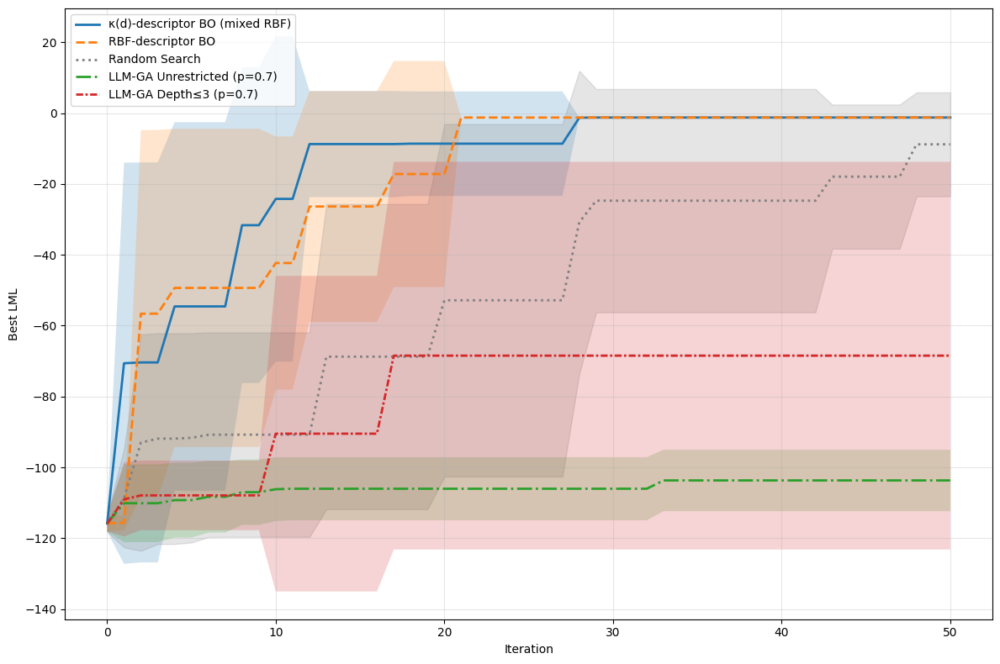


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML           Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     62.725470      2.872868     -1.264254      0.000000  [1, 10, 10, 29, 1]           10.2      10.225458
                     RBF BO     91.453512      6.856802     -1.264254      0.000000  [3, 2, 12, 17, 21]           11.0       7.509993
              Random Search     50.230424      0.619493     -8.831390     14.662329 [48, 28, 2, 35, 13]           25.2      16.191356
LLM-GA Unrestricted (p=0.7)    328.372232     28.926644   -103.690659      8.663098   [0, 10, 6, 33, 1]           10.0      12.049896
     LLM-GA Depth≤3 (p=0.7)    260.546246     31.025035    -68.472589     54.707580   [0, 1, 0, 17, 10]            5.6       6.829348


Saved results → mauna-results.csv
Saved summary → mauna-summary.csv
Saved plot    → mauna_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) REAL DATASET (100 linspaced samples)
# ----------------------------------------------------------------------
DATA_CSV = "mauna.csv"   # your uploaded file

df_data = pd.read_csv(DATA_CSV)

# Choose input & output columns
# Example: Time → input, Temp → target
x_all = df_data["year"].values
y_all = df_data["co2"].values

# Sort by x (important for interpolation)
idx = np.argsort(x_all)
x_all = x_all[idx]
y_all = y_all[idx]

# Create 100 linspace X points
x_lin = np.linspace(x_all.min(), x_all.max(), 100)

# Interpolate real target values onto these 100 points
y_lin = np.interp(x_lin, x_all, y_all)

# Convert to torch
x_data = torch.tensor(x_lin, dtype=torch.double).unsqueeze(-1)
y_raw  = torch.tensor(y_lin, dtype=torch.double)

# Normalize Y same as before
y_mean = y_raw.mean()
y_std  = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).unsqueeze(-1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/mauna_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/mauna-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/mauna-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/mauna-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/mauna-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/mauna_comparison_with_llm_ga.png")

## Airline Passenger Data


PRETRAINING HYPERKAPPA KERNEL
[Pretrain] step 100 | loss=0.000001
[Pretrain] step 200 | loss=0.000000
[Pretrain] step 300 | loss=0.000000
[Pretrain] step 400 | loss=0.000000
[Pretrain] step 500 | loss=0.000000
[Pretrain] Final hyperkernel loss on D0: 0.000000
[Pretrain] Time taken: 1.79 seconds


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 1 | init: ['(PER + (RQ + SE))', '(RQ * (RQ + SE))', '((PER * PER) + PER)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=110, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=112, LML=-85.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=19, LML=-113.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=130, LML=-48.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=214, LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=152, LML=-264.195


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=88, LML=-115.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=174, LML=-119.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=6, LML=-96.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 30 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 31 → idx=235, LML=-115.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 32 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 33 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 35 → idx=39, LML=-58.239


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 36 → idx=86, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 37 → idx=164, LML=-135.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 39 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 40 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 41 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 42 → idx=15, LML=-72.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 43 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=81, LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 47 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 48 → idx=229, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=235, LML=-115.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=84, LML=-84.394


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=130, LML=-48.324


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=225, LML=-146.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=12, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=23, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=134, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=33, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=6, LML=-96.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=85, LML=-135.133


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=153, LML=-113.390


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=133, LML=-206.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=45, LML=-108.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=172, LML=-2121.880


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=63, LML=-108.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=202, LML=-135.123


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=232, LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=82, LML=-62.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=178, LML=-60.381


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=189, LML=-108.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=101, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=95, LML=-14.050


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=37, LML=-113.421


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original

[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * (RQ + SE)))... LML=-247.449


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (SE + (PER * PER) + (PER * RQ))... LML=-362.135


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((PER * PER) + (SE * PER))... LML=-132.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * PER) + (PER * RQ))... LML=-362.135


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + PER + (PER * PER))... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + PER + (SE * PER))... LML=-147.536


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + PER) * SE... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (SE + PER + (PER * PER))... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → ((SE + PER) * RQ)... LML=-146.907
[WARN] Kernel (SE + (PER * (PER + 1))) failed: AttributeError


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * (PER + PER))... LML=-134.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + PER + (PER * PER))... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((PER * PER) + (SE * PER))... LML=-41.576


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + PER + (PER * PER))... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((PER * PER) + (SE * PER))... LML=-132.193


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER * SE) + (SE * PER))... LML=-84.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * PER) + PER)... LML=-13.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER) + (PER * PER)... LML=-208.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * (PER + PER))... LML=-84.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * (PER + PER))... LML=-84.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * (PER + PER))... LML=-134.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((PER * PER) + (RQ * SE))... LML=-134.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * PER) + (RQ * SE))... LML=-202.992


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER * PER) + (RQ * SE))... LML=-207.311


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + RQ)... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (SE * PER))... LML=-146.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE * PER) + SE)... LML=-146.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((PER * PER) + (SE * PER))... LML=-233.672


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((PER * PER) + (SE * PER))... LML=-287.520


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + SE)... LML=-146.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE + PER) * RQ... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + PER)... LML=-290.702


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * PER))... LML=-208.073


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((PER * PER) + (SE * PER))... LML=-273.450


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * PER)... LML=-225.592


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER) + (PER * PER)... LML=-208.284


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + (PER * PER))... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + PER)... LML=-290.702


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((PER * PER) + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((PER * SE) + (PER * PER))... LML=-65.345


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



Run 2 | init: ['(SE * (SE * SE))', '(RQ + (SE * SE))', '(SE * (PER + RQ))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 01 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=15, LML=-72.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=125, LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=214, LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=235, LML=-115.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 22 → idx=80, LML=-135.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=19, LML=-113.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=74, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=23, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=35, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=148, LML=-108.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=216, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=6, LML=-96.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=144, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=134, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=146, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=33, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=174, LML=-119.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 47 → idx=231, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=20, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=110, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=86, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=164, LML=-135.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=157, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=30, LML=-225.640


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=150, LML=-96.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=177, LML=-2121.879


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=133, LML=-206.979


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=45, LML=-108.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=153, LML=-113.390


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=156, LML=-113.422


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=64, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=137, LML=-134.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=68, LML=-60.531


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=135, LML=-48.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=175, LML=-108.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=231, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=218, LML=-14.050


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=105, LML=-51.504


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=148, LML=-108.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=35, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=15, LML=-72.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=228, LML=-51.504


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: 

[LLM-GA] iter=01 crossover → (SE * (RQ + SE))... LML=-63.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * (SE + RQ))... LML=-60.507


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ) + (SE * SE)... LML=-60.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + PER) * (SE + RQ))... LML=-284.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE * (SE * SE)) + (SE + RQ))... LML=-60.473


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + PER) * SE... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * PER))... LML=-146.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE + (SE * PER))... LML=-146.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * (SE + RQ))... LML=-60.507


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * (SE * SE))... LML=-60.543


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + PER) * RQ... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * (SE * SE))... LML=-146.199


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE * (SE * SE)) + (SE * RQ)... LML=-61.396


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + PER) * RQ... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (SE * RQ) + (SE * SE)... LML=-60.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (SE + PER) * RQ... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE + PER) * RQ... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → PER... LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (PER + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (SE * RQ) + (SE * SE)... LML=-60.485


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE * RQ) + (PER * SE)... LML=-60.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (PER + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((PER + SE) * SE)... LML=-227.923


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (PER + SE)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE * SE) + (SE * PER))... LML=-228.017


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 3 | init: ['((PER + RQ) * PER)', '((SE + SE) + PER)', '(SE * (RQ + PER))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=41, LML=-360.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=181, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=23, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 16 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 17 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=125, LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=148, LML=-108.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=74, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 28 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=216, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=80, LML=-135.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=88, LML=-115.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 33 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=19, LML=-113.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=6, LML=-96.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=144, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 43 → idx=134, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 44 → idx=33, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=174, LML=-119.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=231, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=20, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=95, LML=-14.050


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=123, LML=-225.557


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=139, LML=-108.351


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=222, LML=-309.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=221, LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=35, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=189, LML=-108.371


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=14, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=102, LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=112, LML=-85.301


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=52, LML=-60.511


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=82, LML=-62.830


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=46, LML=-67.641


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=223, LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=75, LML=-290.702


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=98, LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=10, LML=-2121.872


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=190, LML=-115.881


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=43, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=23, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=138, LML=-109.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=36, LML=-96.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=60, LML=-113.376


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=101, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=164, LML=-135.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=7, LML=-113.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * (SE + SE))... LML=-65.731


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + SE) * PER)... LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → ((SE + RQ) + PER)... LML=-309.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE * PER) + (SE + RQ))... LML=-60.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE * PER) + (SE * RQ))... LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + SE) * (SE + PER))... LML=-65.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + (SE * RQ))... LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * PER) + RQ... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + SE) * PER)... LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (SE + (SE * PER))... LML=-146.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * PER) + (SE * RQ) + PER)... LML=-134.436


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + SE) * PER + RQ)... LML=-60.487


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE * PER) + (SE + (SE * RQ))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE + RQ) + PER)... LML=-309.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + SE) * (SE + PER))... LML=-65.727


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + SE) * PER) + (SE * RQ)... LML=-275.599


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + SE) * PER)... LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + (SE + RQ)) * PER... LML=-50.012


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (((SE * PER) + (SE * RQ)) * PER)... LML=-246.540


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE * PER) + (SE * RQ))... LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + PER) * (SE + RQ))... LML=-284.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * PER) + (RQ * PER))... LML=-296.079


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE * PER) + ((SE + RQ) * PER)... LML=-245.890


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (((SE + SE) * PER) + (SE * RQ))... LML=-275.599


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE * PER) + ((SE + SE) * RQ))... LML=-274.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE * PER) + (SE + RQ)) * PER... LML=-50.012


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE * PER) + RQ) * PER... LML=-250.676


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * (SE + RQ))... LML=-284.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + ((SE + SE) * RQ))... LML=-274.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (SE + RQ)) * PER... LML=-50.012


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (((SE + SE) * PER) + RQ)... LML=-60.487


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ) + (SE + PER)... LML=-67.983


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (SE * RQ))... LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * PER) + (SE + RQ))... LML=-60.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + ((SE + SE) * RQ))... LML=-274.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE * PER) + (SE * RQ)) * PER... LML=-246.540


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * RQ) + (PER * RQ)... LML=-276.432


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE * PER) + ((SE + SE) * RQ))... LML=-274.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + SE) * PER) + (SE * RQ)... LML=-275.599


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + PER) * (SE + RQ))... LML=-284.185


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (SE * RQ) + PER... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + RQ... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE * PER) + (SE * RQ)... LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * RQ) + PER... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE * PER) + RQ... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 4 | init: ['((RQ + SE) + SE)', '((PER * PER) * RQ)', '((PER + PER) + RQ)']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 01 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 02 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 05 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 06 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=41, LML=-360.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=143, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=19, LML=-113.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 18 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 19 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 20 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 24 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 25 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 26 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 27 → idx=74, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 29 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=80, LML=-135.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=88, LML=-115.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 34 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=235, LML=-115.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=35, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 39 → idx=146, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=58, LML=-108.346


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=231, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 42 → idx=105, LML=-51.504


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 44 → idx=125, LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 45 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 46 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=20, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 48 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 49 → idx=98, LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=81, LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=46, LML=-67.641


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=123, LML=-225.557


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=16, LML=-55.866


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=11, LML=-324.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=65, LML=-67.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=180, LML=-108.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=198, LML=-262.407


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=100, LML=-60.457


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=161, LML=-135.200


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=36, LML=-96.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=220, LML=-60.798


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=45, LML=-108.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=86, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=85, LML=-135.133


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=135, LML=-48.144


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=64, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=148, LML=-108.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=217, LML=-61.020


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=15, LML=-72.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=19, LML=-113.389


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=76, LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=205, LML=-135.133


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=232, LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=98, LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\fit.py:215: OptimizationWarning: `scipy_minimize` terminated with status 3, displaying original message from `scipy.optimize.minimize`: ABNORMAL: 
  result = optimizer(mll, closure=closure, **optimizer_kwargs)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=52, LML=-60.393


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=146, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=87, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=160, LML=-135.180


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + SE)... LML=-324.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((RQ + SE) * PER)... LML=-261.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE + PER) * (SE + PER))... LML=-258.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + PER) * (SE + PER))... LML=-258.808


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-297.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-297.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → ((PER * RQ) + SE)... LML=-324.184


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (SE + RQ) * PER... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE * PER) + ((PER * PER) * RQ))... LML=-297.228


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((RQ + SE) * PER)... LML=-261.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((RQ + SE) * (PER + SE))... LML=-255.678


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((SE * PER) + (RQ + SE))... LML=-60.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → ((SE * PER) + (RQ * SE))... LML=-60.467


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → ((SE * PER) + RQ)... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE * PER) + RQ)... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → ((SE * PER) + (RQ * (SE + PER)))... LML=-246.683


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE * PER) + (RQ + SE))... LML=-60.474


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER * (RQ + SE))... LML=-261.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → ((PER + RQ) * SE)... LML=-272.810


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (RQ * SE)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((PER * RQ) + (RQ * SE))... LML=-277.732


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((RQ + SE) * PER)... LML=-261.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER * RQ) + (SE * RQ))... LML=-274.213


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (RQ * SE)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((RQ + SE) * PER)... LML=-261.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (RQ + (SE * PER))... LML=-60.495


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (RQ + (SE * PER))... LML=-60.495


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (SE + (RQ * SE))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (SE + (RQ * SE))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE + RQ) + SE)... LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((RQ + SE) * PER)... LML=-261.997


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → ((RQ + SE) * SE)... LML=-60.531


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * RQ) + SE)... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE + (RQ * SE))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → ((SE + RQ) * RQ)... LML=-135.126


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE + RQ) * RQ)... LML=-135.126


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * RQ) + (SE * PER)... LML=-60.470


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * RQ) + (PER * SE)... LML=-60.483


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * RQ) + (RQ * PER)... LML=-274.656


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + (RQ * SE))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * RQ) + (SE * PER)... LML=-60.470


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → ((SE + RQ) * SE)... LML=-60.513


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See ht


Run 5 | init: ['((PER * SE) * SE)', '(PER + (SE * SE))', '(PER * (RQ + SE))']


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=136, LML=-108.349


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 02 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 03 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 04 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 06 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 07 → idx=215, LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 08 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 09 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 10 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 11 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 12 → idx=89, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 13 → idx=181, LML=-115.891


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 14 → idx=109, LML=-80.813


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 15 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 17 → idx=35, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 18 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 20 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 21 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 22 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 23 → idx=80, LML=-135.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 25 → idx=149, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=88, LML=-115.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 27 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 28 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 29 → idx=23, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=144, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 31 → idx=174, LML=-119.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=93, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 33 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 34 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=110, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=146, LML=-14.049


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 37 → idx=63, LML=-108.018


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)


[BO] iter 38 → idx=209, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=106, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 40 → idx=216, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=9, LML=-58.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=41, LML=-360.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=33, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=231, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=134, LML=-4.270


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=152, LML=-264.195


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=2, LML=-53.214


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 


[BO] iter 49 → idx=105, LML=-51.504


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=224, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 01 → idx=57, LML=-119.993


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 02 → idx=24, LML=-85.235


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 03 → idx=207, LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 04 → idx=45, LML=-108.353


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 05 → idx=132, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 06 → idx=147, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 07 → idx=51, LML=-135.096


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 08 → idx=206, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 09 → idx=54, LML=-85.205


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 10 → idx=17, LML=-146.157


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 11 → idx=200, LML=-135.173


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 12 → idx=3, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 13 → idx=65, LML=-67.561


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 14 → idx=41, LML=-360.048


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 15 → idx=129, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 16 → idx=233, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 17 → idx=203, LML=-63.286


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 18 → idx=183, LML=-60.495


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 19 → idx=192, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 20 → idx=111, LML=-43.686


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 21 → idx=18, LML=-43.687


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 22 → idx=222, LML=-309.405


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 23 → idx=6, LML=-96.856


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 24 → idx=234, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 25 → idx=108, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 26 → idx=171, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 27 → idx=227, LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 28 → idx=5, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 29 → idx=213, LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 30 → idx=235, LML=-115.889


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 31 → idx=185, LML=-115.706


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 32 → idx=21, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 33 → idx=236, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 34 → idx=150, LML=-96.946


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 35 → idx=215, LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 36 → idx=15, LML=-72.718


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 37 → idx=230, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 38 → idx=53, LML=-60.463


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 39 → idx=107, LML=-3.710


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 40 → idx=212, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 41 → idx=4, LML=-13.847


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 42 → idx=0, LML=-43.664


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 43 → idx=104, LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 44 → idx=229, LML=-65.192


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 45 → idx=120, LML=-53.215


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 46 → idx=115, LML=-113.366


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 47 → idx=62, LML=-135.122


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 48 → idx=188, LML=-60.576


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 49 → idx=126, LML=-1.500


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\botorch\acquisition\analytic.py:337: NumericsWarning: ExpectedImprovement has known numerical issues that lead to suboptimal optimization performance. It is strongly recommended to simply replace

	 ExpectedImprovement 	 --> 	 LogExpectedImprovement 

instead, which fixes the issues and has the same API. See https://arxiv.org/abs/2310.20708 for details.
  legacy_ei_numerics_warning(legacy_name=type(self).__name__)
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[BO] iter 50 → idx=74, LML=-84.364


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(
c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you fo

[LLM-GA] iter=01 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → (PER + (SE * (SE * SE)))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → (PER + (SE * (SE + RQ)))... LML=-68.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → (PER + (SE * (SE * RQ)))... LML=-135.162


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → (SE * PER) + RQ... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (PER + RQ)... LML=-108.302


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER + (SE * (SE + PER)))... LML=-236.453


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + (SE * (SE + PER)))... LML=-236.453


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + (SE * (SE * SE)))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 mutation  → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → (PER + (SE * (SE * SE)))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (PER + (SE * (SE * (SE + SE))))... LML=-32.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → ((PER + (SE * SE)) * (SE + PER))... LML=-253.896


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → (PER + (SE * (SE + RQ)))... LML=-68.118


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → (PER + (SE * SE) * (SE + SE))... LML=-32.933


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (PER + (SE * SE) + (SE * RQ))... LML=-72.974


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (PER + (SE * (SE * (SE + RQ))))... LML=-174.057


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * (SE * PER)))... LML=-65.273


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → (PER + (SE * (SE * (SE + (SE * SE)))))... LML=-47.179


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (PER + (SE * (SE + PER)))... LML=-236.453


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (PER + (SE * (SE * SE))) * RQ... LML=-227.448


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (PER + (SE * (SE * (SE + SE)))) * (SE + PER)... LML=-76.213


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (PER + (SE * (SE * (SE + (SE * SE)))))... LML=-47.179


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (PER + (SE * (SE + SE)))... LML=-32.932


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (PER + (SE * (SE + (SE * SE))))... LML=-60.471


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → ((PER + (SE * (SE * SE))) * (SE + PER))... LML=-71.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → (PER + (SE * (SE * SE))) * (SE + PER)... LML=-71.156


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (PER + (SE * (SE * (SE + (SE * SE)))))... LML=-47.179


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + PER)... LML=-4.269


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE + PER + (SE * SE))... LML=-196.476


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 mutation  → (SE * RQ)... LML=-135.121


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (PER + (SE * (SE * SE)))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER + (SE * SE) + (SE * (SE * SE)))... LML=-67.976


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → ((SE + PER) * SE)... LML=-228.006


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 mutation  → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → ((SE + PER) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (PER + (SE * SE) + (SE * (SE * SE)))... LML=-67.976


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=01 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 crossover → (PER + (SE * PER))... LML=-208.073


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=02 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=03 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 crossover → ((PER + SE) * RQ)... LML=-146.907


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=04 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=05 crossover → ((PER + SE) * SE)... LML=-227.923


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=06 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 crossover → ((SE * RQ) + PER)... LML=-287.556


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=07 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=08 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=09 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=10 crossover → ((PER + SE) * SE)... LML=-227.923


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=11 crossover → (PER + (SE * SE))... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=12 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=13 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 crossover → ((SE + RQ) * PER)... LML=-261.924


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=14 mutation  → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 crossover → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=15 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 crossover → (SE + (PER * RQ))... LML=-360.008


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=16 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=17 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 crossover → ((SE * SE) + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=18 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 crossover → ((SE * SE) + PER)... LML=-11.811


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=19 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 crossover → (PER * (SE + SE))... LML=-57.148


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=20 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=21 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 crossover → ((SE * PER) + SE)... LML=-146.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=22 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=23 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=24 mutation  → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 crossover → ((SE * SE) + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=25 mutation  → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=26 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=27 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=28 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 crossover → ((SE * PER) + (SE * SE))... LML=-228.011


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=29 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=30 crossover → ((SE * PER) + (SE * SE))... LML=-228.011


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=31 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 crossover → (SE * PER) + (SE * SE)... LML=-228.011


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=32 mutation  → (SE + (SE * RQ))... LML=-60.472


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=33 crossover → (SE * (SE + PER))... LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=34 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=35 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 crossover → (SE + (PER * SE))... LML=-146.120


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=36 mutation  → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=37 mutation  → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=38 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=39 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 crossover → ((SE * PER) + SE)... LML=-146.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=40 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 crossover → (SE * PER) + SE... LML=-146.113


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=41 mutation  → (SE + (RQ * PER))... LML=-359.620


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=42 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 crossover → (SE * (SE + PER))... LML=-227.703


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=43 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=44 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=45 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 crossover → ((SE * PER) + RQ)... LML=-60.514


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=46 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 crossover → (PER * SE)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=47 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=48 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 crossover → (PER + (SE * RQ))... LML=-134.654


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=49 mutation  → (SE + RQ)... LML=-60.465


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 crossover → (SE * PER)... LML=-84.362


c:\Users\shakt\miniconda3\envs\pytorch-env\lib\site-packages\gpytorch\models\exact_gp.py:296: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


[LLM-GA] iter=50 mutation  → (SE + (RQ * PER))... LML=-359.620


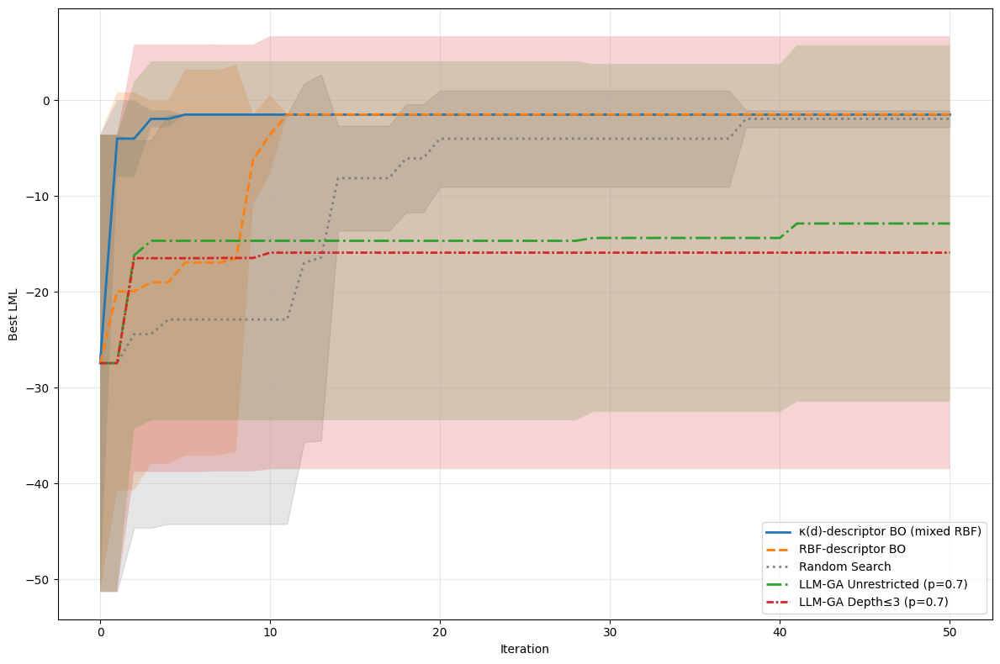


SUMMARY STATISTICS
                     Method  Avg_Time_sec  Std_Time_sec  Avg_Best_LML  Std_Best_LML            Best_Iter  Avg_Best_Iter  Std_Best_Iter
             HyperKernel BO     72.861363      3.349385     -1.500106      0.000000  [1, 34, 27, 22, 19]           20.6      11.038116
                     RBF BO    140.234855     15.101446     -1.500106      0.000000 [11, 11, 43, 36, 24]           25.0      12.946042
              Random Search     90.754920      6.352710     -1.942076      0.883869 [22, 28, 38, 35, 13]           27.2       9.019978
LLM-GA Unrestricted (p=0.7)    413.292230     76.765519    -12.863836     18.605209    [0, 3, 29, 2, 41]           15.0      16.792856
     LLM-GA Depth≤3 (p=0.7)    337.040138     47.292423    -15.908939     22.595214    [0, 10, 2, 7, 15]            6.8       5.418487


Saved results → airline-results.csv
Saved summary → airline-summary.csv
Saved plot    → airline_comparison_with_llm_ga.png


In [ ]:
# ======================================================================
# DISCRETE KERNEL SEARCH COMPARISON:
#   κ(d)-descriptor BO (mixture RBF, pretrained on D0)
#   vs
#   RBF-descriptor BO (single ARD RBF)
#   vs
#   Random Search
#   vs
#   LLM-GA (unrestricted and depth≤3)
# ======================================================================

import os, math, random, time
import numpy as np
import pandas as pd
import torch
import gpytorch
import matplotlib.pyplot as plt
from datetime import datetime

from dotenv import load_dotenv
load_dotenv()

from openai import OpenAI
from gpytorch.kernels import ScaleKernel, RBFKernel, PeriodicKernel, RQKernel
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.optim.optimize import optimize_acqf_discrete

torch.set_default_dtype(torch.double)

# ----------------------------------------------------------------------
# CONFIG
# ----------------------------------------------------------------------
CSV_PATH   = "kernels_JS.csv"
N_INIT     = 3
N_ITER     = 50
N_RESTARTS = 5
MUTATION_PROB = 0.7
NUM_CROSSOVER = 1
NUM_POPULATION = 6
LLM_TEMPERATURE = 0.7
MAX_KERNEL_DEPTH = 3

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY", ""))

# ----------------------------------------------------------------------
# LLM PROMPTS
# ----------------------------------------------------------------------
SYSTEM_PROMPT = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations, e.g., (SE + PER), (SE * RQ), ((SE + PER) * RQ)
"""

SYSTEM_PROMPT_DEPTH_RESTRICTED = """
You are an expert in Gaussian processes and kernel design. 

Available base kernels: SE (Squared Exponential/RBF), PER (Periodic), RQ (Rational Quadratic)
Available operators: + (addition), * (multiplication)

Your task is to propose kernel expressions that maximize the log marginal likelihood (LML) on the observed data.
Higher LML values indicate better fit to the data.

CRITICAL CONSTRAINT: The kernel expression depth must not exceed {max_depth}. 
- Depth 1: Single base kernel (e.g., SE, PER, RQ)
- Depth 2: One operation (e.g., (SE + PER), (SE * RQ))
- Depth 3: Two operations (e.g., ((SE + PER) * RQ), (SE + (PER * RQ)))

IMPORTANT: Output format must be:
Kernel: <kernel_expression>
Analysis: <your reasoning>

Kernel expressions must use parentheses for compound operations. Keep expressions simple and within the depth limit!
"""

CROSSOVER_PROMPT = """
You are given two parent kernels and their LML fitness scores:
Parent 1: {parent1} (LML: {fitness1:.3f})
Parent 2: {parent2} (LML: {fitness2:.3f})

Please propose a new kernel that combines the strengths of both parents and may achieve higher LML.
You can use operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

MUTATION_PROMPT = """
You are given a kernel and its LML fitness score:
Current: {kernel} (LML: {fitness:.3f})

Please propose a modified kernel that may achieve higher LML.
You can replace base kernels with: {base_kernels}
Or add/modify operators: {operators}

{depth_constraint}

Output format:
Kernel: <your_kernel>
Analysis: <brief explanation>
"""

# ----------------------------------------------------------------------
# 0) REAL DATASET (100 linspaced samples)
# ----------------------------------------------------------------------
DATA_CSV = "airline.csv"   # your uploaded file

df_data = pd.read_csv(DATA_CSV)

# Choose input & output columns
# Example: Time → input, Temp → target
x_all = df_data["Year"].values
y_all = df_data["Passengers"].values

# Sort by x (important for interpolation)
idx = np.argsort(x_all)
x_all = x_all[idx]
y_all = y_all[idx]

# Create 100 linspace X points
x_lin = np.linspace(x_all.min(), x_all.max(), 100)

# Interpolate real target values onto these 100 points
y_lin = np.interp(x_lin, x_all, y_all)

# Convert to torch
x_data = torch.tensor(x_lin, dtype=torch.double).unsqueeze(-1)
y_raw  = torch.tensor(y_lin, dtype=torch.double)

# Normalize Y same as before
y_mean = y_raw.mean()
y_std  = y_raw.std()
if y_std < 1e-10:
    y_std = torch.tensor(1.0)

DATA_X = x_data
DATA_Y = ((y_raw - y_mean) / y_std).unsqueeze(-1)

# ----------------------------------------------------------------------
# 1) LOAD CSV + DESCRIPTORS
# ----------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df = df.loc[:, ~df.columns.str.contains("^Unnamed")]

if "kernel" in df.columns and "Kernel" not in df.columns:
    df.rename(columns={"kernel": "Kernel"}, inplace=True)

kernel_names = df["Kernel"].tolist()

feat_cols = [c for c in df.columns if c.upper().startswith("C") and c[1:].isdigit()]
feat_cols = sorted(feat_cols, key=lambda c: int(c[1:]))
X = torch.tensor(df[feat_cols].values, dtype=torch.double)
N, d = X.shape

xmin, xmax = X.min(0).values, X.max(0).values
den = xmax - xmin
den[den == 0] = 1.0
Xn = (X - xmin) / den

D0 = torch.cdist(Xn, Xn, p=2)

# ----------------------------------------------------------------------
# 2) Grammar + LML evaluator
# ----------------------------------------------------------------------
class KernelExpr:
    def __init__(self, name, children=()):
        self.name = name
        self.children = tuple(children)

    def __add__(self, other):
        return KernelExpr("+", (self, other))
    def __mul__(self, other):
        return KernelExpr("*", (self, other))

    def __repr__(self):
        if not self.children:
            return self.name
        return f"({self.children[0]} {self.name} {self.children[1]})"

SE  = KernelExpr("SE")
PER = KernelExpr("PER")
RQ  = KernelExpr("RQ")
_PARSE_ENV = {"SE": SE, "PER": PER, "RQ": RQ}

def parse_kernel_expr(s):
    return eval(s, {"__builtins__": {}}, _PARSE_ENV)

def compute_kernel_depth(expr: KernelExpr) -> int:
    """Compute the depth of a kernel expression tree"""
    if not expr.children:
        return 1
    left_depth = compute_kernel_depth(expr.children[0])
    right_depth = compute_kernel_depth(expr.children[1])
    return 1 + max(left_depth, right_depth)

def check_kernel_depth(kernel_str: str, max_depth: int = None) -> bool:
    """Check if kernel expression satisfies depth constraint"""
    if max_depth is None:
        return True
    try:
        expr = parse_kernel_expr(kernel_str)
        depth = compute_kernel_depth(expr)
        return depth <= max_depth
    except:
        return False

def build_kernel_module(expr: KernelExpr):
    if not expr.children:
        if expr.name == "SE":
            return ScaleKernel(RBFKernel())
        if expr.name == "PER":
            return ScaleKernel(PeriodicKernel())
        if expr.name == "RQ":
            return ScaleKernel(RQKernel())
    L, R = expr.children
    Lm, Rm = build_kernel_module(L), build_kernel_module(R)
    if expr.name == "+":
        return Lm + Rm
    if expr.name == "*":
        return Lm * Rm

def evaluate_kernel_lml_from_string(kernel_str):
    try:
        expr = parse_kernel_expr(kernel_str)
        cov = build_kernel_module(expr)

        model = SingleTaskGP(DATA_X, DATA_Y, covar_module=cov)
        mll = ExactMarginalLogLikelihood(model.likelihood, model)

        model.train(); model.likelihood.train()
        fit_gpytorch_mll(mll)

        model.eval(); model.likelihood.eval()
        with torch.no_grad():
            output = model(DATA_X)
            v = mll(output, DATA_Y)
            return float(v.mean().item())

    except Exception as e:
        print(f"[WARN] Kernel {kernel_str} failed: {type(e).__name__}")
        return -1e9

def evaluate_kernel_lml_by_index(idx: int) -> float:
    return evaluate_kernel_lml_from_string(kernel_names[idx])

# ----------------------------------------------------------------------
# 3) HyperKappaKernel
# ----------------------------------------------------------------------
class HyperKappaKernel(gpytorch.kernels.Kernel):
    def __init__(self, D0, base_scales=(0.3, 1.0, 3.0)):
        super().__init__(has_lengthscale=False)
        self.register_buffer("D0", D0)
        self.M = len(base_scales)
        self.log_ells = torch.nn.Parameter(torch.log(torch.tensor(base_scales, dtype=torch.double)))
        self.log_weights = torch.nn.Parameter(torch.zeros(self.M, dtype=torch.double))

    def forward(self, x1, x2, last_dim_is_batch=False, **kwargs):
        D = torch.cdist(x1, x2, p=2)
        ells = torch.exp(self.log_ells)
        w = torch.softmax(self.log_weights, dim=0)
        K = 0.0
        for m in range(self.M):
            K = K + w[m] * torch.exp(-0.5 * (D / ells[m])**2)
        return K

# ----------------------------------------------------------------------
# 4) PRETRAIN HYPERKERNEL ON D0
# ----------------------------------------------------------------------
def pretrain_hyperkernel_on_D0(D0, Xn, base_scales=(0.3, 1.0, 3.0),
                               n_steps=500, lr=0.05, target_scale=1.0):

    hk = HyperKappaKernel(D0, base_scales=base_scales)
    optimizer = torch.optim.Adam([hk.log_ells, hk.log_weights], lr=lr)

    pretrain_start = time.time()

    with torch.no_grad():
        K_target = torch.exp(-0.5 * (D0 / target_scale)**2)

    for step in range(n_steps):
        optimizer.zero_grad()
        K_pred = hk(Xn, Xn).to_dense()
        loss = ((K_pred - K_target)**2).mean()
        loss.backward()
        optimizer.step()

        if (step+1) % 100 == 0:
            print(f"[Pretrain] step {step+1} | loss={loss.item():.6f}")

    pretrain_time = time.time() - pretrain_start

    print(f"[Pretrain] Final hyperkernel loss on D0: {loss.item():.6f}")
    print(f"[Pretrain] Time taken: {pretrain_time:.2f} seconds")
    return hk, pretrain_time 

print("\n" + "="*80)
print("PRETRAINING HYPERKAPPA KERNEL")
print("="*80)
pretrained_hk, HYPERKAPPA_PRETRAIN_TIME = pretrain_hyperkernel_on_D0(D0, Xn)

# ----------------------------------------------------------------------
# 5) Surrogate Fitters
# ----------------------------------------------------------------------
def fit_surrogate_hyper(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    base_kernel = HyperKappaKernel(D0)
    with torch.no_grad():
        base_kernel.log_ells.copy_(pretrained_hk.log_ells)
        base_kernel.log_weights.copy_(pretrained_hk.log_weights)

    for p in base_kernel.parameters():
        p.requires_grad_(False)

    cov = ScaleKernel(base_kernel)
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

def fit_surrogate_rbf(train_x, train_y_raw):
    y_mean = train_y_raw.mean(); y_std = train_y_raw.std()
    if y_std < 1e-10: y_std = torch.tensor(1.0)
    train_y = (train_y_raw - y_mean) / y_std

    cov = ScaleKernel(RBFKernel(ard_num_dims=train_x.shape[1]))
    model = SingleTaskGP(train_x, train_y, covar_module=cov)
    mll = ExactMarginalLogLikelihood(model.likelihood, model)

    model.train(); model.likelihood.train()
    fit_gpytorch_mll(mll)
    model.eval(); model.likelihood.eval()
    return model, train_y, y_mean, y_std

# ----------------------------------------------------------------------
# 6) BO LOOP (Generic)
# ----------------------------------------------------------------------
def run_bo_generic(seed, init_ids, init_lmls, fitter):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    start_time = time.time()
    evaluated = set(init_ids)
    train_x = Xn[init_ids]
    train_y_raw = torch.tensor(init_lmls).unsqueeze(-1)

    model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)
    best = max(init_lmls)
    curve = [best]
    best_iter = 0

    for t in range(N_ITER):
        remaining = [i for i in range(N) if i not in evaluated]
        if not remaining:
            break

        cand_set = Xn[remaining]
        best_f = train_y_norm.max()

        acq = ExpectedImprovement(model, best_f=best_f)
        cand, _ = optimize_acqf_discrete(acq, q=1, choices=cand_set)

        d = torch.norm(cand_set - cand, dim=1)
        next_idx = remaining[d.argmin().item()]

        y_new = evaluate_kernel_lml_by_index(next_idx)

        train_x = torch.cat([train_x, Xn[next_idx:next_idx+1]], 0)
        train_y_raw = torch.cat([train_y_raw,
                                 torch.tensor([[y_new]], dtype=torch.double)], 0)

        evaluated.add(next_idx)
        model, train_y_norm, y_mean, y_std = fitter(train_x, train_y_raw)

        if y_new > best:
            best = y_new
            best_iter = t + 1
        curve.append(best)

        print(f"[BO] iter {t+1:02d} → idx={next_idx}, LML={y_new:.3f}")

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 6b) RANDOM SEARCH
# ----------------------------------------------------------------------
def run_random(seed, init_ids, initial_best):
    rng = np.random.default_rng(seed)
    start_time = time.time()
    remaining = [i for i in range(N) if i not in init_ids]
    perm = rng.permutation(remaining)

    best = initial_best
    curve = [initial_best]
    best_iter = 0

    for idx_num, idx in enumerate(perm[:N_ITER]):
        y = evaluate_kernel_lml_by_index(int(idx))
        if y > best:
            best = y
            best_iter = idx_num + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 7) LLM-GA FUNCTIONS
# ----------------------------------------------------------------------
def call_llm(prompt, max_depth=None):
    """Call LLM with error handling"""
    try:
        if max_depth is not None:
            system_prompt = SYSTEM_PROMPT_DEPTH_RESTRICTED.format(max_depth=max_depth)
        else:
            system_prompt = SYSTEM_PROMPT
            
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": prompt}
            ],
            temperature=LLM_TEMPERATURE,
            max_tokens=200
        )
        return response.choices[0].message.content
    except Exception as e:
        print(f"LLM call error: {e}")
        return None

def parse_llm_response(response):
    """Parse kernel and analysis from LLM response"""
    if not response:
        return None, None
    
    try:
        lines = response.strip().split("\n")
        kernel = None
        analysis = None
        
        for line in lines:
            if line.startswith("Kernel:"):
                kernel = line.replace("Kernel:", "").strip()
            elif line.startswith("Analysis:"):
                analysis = line.replace("Analysis:", "").strip()
        
        return kernel, analysis
    except:
        return None, None

def run_llm_ga(seed, init_ids, init_lmls, initial_best, max_depth=None):
    """LLM-guided genetic algorithm for kernel search"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    start_time = time.time()
    
    # Initialize population with starting kernels
    population = {}
    for i, lml in zip(init_ids, init_lmls):
        kernel = kernel_names[i]
        if check_kernel_depth(kernel, max_depth):
            population[kernel] = lml

    if not population:
        for base in ["SE", "PER", "RQ"]:
            lml = evaluate_kernel_lml_from_string(base)
            population[base] = lml

    best = max(population.values())
    curve = [best]
    best_iter = 0

    base_kernels = ["SE", "PER", "RQ"]
    operators = ["+", "*"]
    
    if max_depth is not None:
        depth_constraint = f"IMPORTANT: Keep kernel depth at most {max_depth}. Avoid deeply nested expressions!"
    else:
        depth_constraint = ""

    for t in range(N_ITER):
        kernels_list = list(population.keys())
        fitness_array = np.array([population[k] for k in kernels_list])
        
        fitness_normalized = fitness_array - fitness_array.min() + 1.0
        probs = fitness_normalized / fitness_normalized.sum()

        # CROSSOVER
        for crossover_idx in range(NUM_CROSSOVER):
            if len(kernels_list) < 2:
                break
            
            idx1, idx2 = np.random.choice(len(kernels_list), size=2, replace=False, p=probs)
            parent1, parent2 = kernels_list[idx1], kernels_list[idx2]
            fitness1, fitness2 = population[parent1], population[parent2]

            prompt = CROSSOVER_PROMPT.format(
                parent1=parent1,
                parent2=parent2,
                fitness1=fitness1,
                fitness2=fitness2,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                op = np.random.choice(operators)
                kernel = f"({parent1} {op} {parent2})"
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} crossover → {kernel[:60]}... LML={lml:.3f}")

        # MUTATION
        if np.random.rand() < MUTATION_PROB:
            best_kernel = max(population, key=population.get)
            best_fitness = population[best_kernel]

            prompt = MUTATION_PROMPT.format(
                kernel=best_kernel,
                fitness=best_fitness,
                base_kernels=base_kernels,
                operators=operators,
                depth_constraint=depth_constraint
            )
            
            response = call_llm(prompt, max_depth)
            kernel, analysis = parse_llm_response(response)
            
            if not kernel:
                for old_base in base_kernels:
                    if old_base in best_kernel:
                        new_base = np.random.choice([b for b in base_kernels if b != old_base])
                        kernel = best_kernel.replace(old_base, new_base, 1)
                        break
                if not kernel:
                    kernel = np.random.choice(base_kernels)
            
            if not check_kernel_depth(kernel, max_depth):
                kernel = np.random.choice(base_kernels)
            
            if len(kernel) < 200:
                lml = evaluate_kernel_lml_from_string(kernel)
                if lml > -1e9:
                    population[kernel] = lml
                    print(f"[LLM-GA] iter={t+1:02d} mutation  → {kernel[:60]}... LML={lml:.3f}")

        # SURVIVAL SELECTION
        population = dict(sorted(population.items(), key=lambda x: x[1], reverse=True)[:NUM_POPULATION])

        current_best = max(population.values())
        if current_best > best:
            best = current_best
            best_iter = t + 1
        curve.append(best)

    elapsed_time = time.time() - start_time
    return np.array(curve), elapsed_time, best, best_iter

# ----------------------------------------------------------------------
# 8) RUN ALL METHODS
# ----------------------------------------------------------------------
hyper_runs = []
rbf_runs   = []
rand_runs  = []
llm_unres_runs = []
llm_depth3_runs = []

hyper_times = []
rbf_times = []
rand_times = []
llm_unres_times = []
llm_depth3_times = []

hyper_best_lmls = []
rbf_best_lmls = []
rand_best_lmls = []
llm_unres_best_lmls = []
llm_depth3_best_lmls = []

hyper_best_iters = []
rbf_best_iters = []
rand_best_iters = []
llm_unres_best_iters = []
llm_depth3_best_iters = []

for run_seed in range(N_RESTARTS):

    rng = np.random.default_rng(123 + run_seed)
    init_ids = rng.choice(N, size=N_INIT, replace=False).tolist()
    init_lmls = [evaluate_kernel_lml_by_index(i) for i in init_ids]
    initial_best = max(init_lmls)

    print("\nRun", run_seed+1, "| init:", [kernel_names[i] for i in init_ids])

    # hyperkernel BO
    hyper_curve, hyper_time, hyper_best, hyper_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_hyper
    )

    # RBF-descriptor BO
    rbf_curve, rbf_time, rbf_best, rbf_best_iter = run_bo_generic(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        fitter=fit_surrogate_rbf
    )

    # RANDOM SEARCH
    rand_curve, rand_time, rand_best, rand_best_iter = run_random(run_seed + 10, init_ids, initial_best)

    # LLM-GA UNRESTRICTED
    llm_unres_curve, llm_unres_time, llm_unres_best, llm_unres_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=None
    )

    # LLM-GA DEPTH≤3
    llm_depth3_curve, llm_depth3_time, llm_depth3_best, llm_depth3_best_iter = run_llm_ga(
        seed=run_seed + 10,
        init_ids=init_ids,
        init_lmls=init_lmls,
        initial_best=initial_best,
        max_depth=MAX_KERNEL_DEPTH
    )

    hyper_runs.append(hyper_curve)
    rbf_runs.append(rbf_curve)
    rand_runs.append(rand_curve)
    llm_unres_runs.append(llm_unres_curve)
    llm_depth3_runs.append(llm_depth3_curve)

    hyper_times.append(hyper_time + HYPERKAPPA_PRETRAIN_TIME)
    rbf_times.append(rbf_time)
    rand_times.append(rand_time)
    llm_unres_times.append(llm_unres_time)
    llm_depth3_times.append(llm_depth3_time)

    hyper_best_lmls.append(hyper_best)
    rbf_best_lmls.append(rbf_best)
    rand_best_lmls.append(rand_best)
    llm_unres_best_lmls.append(llm_unres_best)
    llm_depth3_best_lmls.append(llm_depth3_best)

    hyper_best_iters.append(hyper_best_iter)
    rbf_best_iters.append(rbf_best_iter)
    rand_best_iters.append(rand_best_iter)
    llm_unres_best_iters.append(llm_unres_best_iter)
    llm_depth3_best_iters.append(llm_depth3_best_iter)

# ----------------------------------------------------------------------
# 9) PAD & PLOT
# ----------------------------------------------------------------------
def pad(arrs, L):
    out = []
    for a in arrs:
        if len(a) < L:
            out.append(np.pad(a, (0, L - len(a)), 'edge'))
        else:
            out.append(a)
    return np.vstack(out)

L = max(
        max(map(len, hyper_runs)),
        max(map(len, rbf_runs)),
        max(map(len, rand_runs)),
        max(map(len, llm_unres_runs)),
        max(map(len, llm_depth3_runs))
)

H = pad(hyper_runs, L)
R = pad(rbf_runs, L)
Z = pad(rand_runs, L)
LU = pad(llm_unres_runs, L)
LD = pad(llm_depth3_runs, L)

h_m, h_s = H.mean(0), H.std(0)
r_m, r_s = R.mean(0), R.std(0)
z_m, z_s = Z.mean(0), Z.std(0)
lu_m, lu_s = LU.mean(0), LU.std(0)
ld_m, ld_s = LD.mean(0), LD.std(0)

iters = np.arange(L)

plt.figure(figsize=(12, 8))

plt.plot(iters, h_m, lw=2, label="κ(d)-descriptor BO (mixed RBF)")
plt.fill_between(iters, h_m - h_s, h_m + h_s, alpha=0.2)

plt.plot(iters, r_m, lw=2, linestyle="--", label="RBF-descriptor BO")
plt.fill_between(iters, r_m - r_s, r_m + r_s, alpha=0.2)

plt.plot(iters, z_m, lw=2, linestyle=":", label="Random Search", color="gray")
plt.fill_between(iters, z_m - z_s, z_m + z_s, alpha=0.2, color="gray")

plt.plot(iters, lu_m, lw=2, linestyle="-.", label=f"LLM-GA Unrestricted (p={MUTATION_PROB})")
plt.fill_between(iters, lu_m - lu_s, lu_m + lu_s, alpha=0.2)

plt.plot(iters, ld_m, lw=2, linestyle=(0, (3, 1, 1, 1)), label=f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})")
plt.fill_between(iters, ld_m - ld_s, ld_m + ld_s, alpha=0.2)

plt.xlabel("Iteration")
plt.ylabel("Best LML")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("output/kernel-opt_benchmark/airline_comparison_with_llm_ga.png", dpi=300)
plt.show()

# ======================================================================
# 10) SAVE RESULTS AS CSV
# ======================================================================

results_df = pd.DataFrame({
    "iteration"        : iters,
    "hyper_mean"       : h_m,
    "hyper_std"        : h_s,
    "rbf_mean"         : r_m,
    "rbf_std"          : r_s,
    "rand_mean"        : z_m,
    "rand_std"         : z_s,
    "llm_ga_unres_mean": lu_m,
    "llm_ga_unres_std" : lu_s,
    "llm_ga_depth3_mean": ld_m,
    "llm_ga_depth3_std" : ld_s,
})

results_df.to_csv("output/kernel-opt_benchmark/airline-results.csv", index=False)

# Save summary statistics
summary_df = pd.DataFrame({
    "Method": ["HyperKernel BO", "RBF BO", "Random Search", 
               f"LLM-GA Unrestricted (p={MUTATION_PROB})", 
               f"LLM-GA Depth≤{MAX_KERNEL_DEPTH} (p={MUTATION_PROB})"],
    "Avg_Time_sec": [np.mean(hyper_times), np.mean(rbf_times), np.mean(rand_times),
                     np.mean(llm_unres_times), np.mean(llm_depth3_times)],
    "Std_Time_sec": [np.std(hyper_times), np.std(rbf_times), np.std(rand_times),
                     np.std(llm_unres_times), np.std(llm_depth3_times)],
    "Avg_Best_LML": [np.mean(hyper_best_lmls), np.mean(rbf_best_lmls), np.mean(rand_best_lmls),
                     np.mean(llm_unres_best_lmls), np.mean(llm_depth3_best_lmls)],
    "Std_Best_LML": [np.std(hyper_best_lmls), np.std(rbf_best_lmls), np.std(rand_best_lmls),
                     np.std(llm_unres_best_lmls), np.std(llm_depth3_best_lmls)],
    "Best_Iter": [hyper_best_iters, rbf_best_iters, rand_best_iters, llm_unres_best_iters, llm_depth3_best_iters],
    "Avg_Best_Iter": [np.mean(hyper_best_iters), np.mean(rbf_best_iters), np.mean(rand_best_iters),
                      np.mean(llm_unres_best_iters), np.mean(llm_depth3_best_iters)],
    "Std_Best_Iter": [np.std(hyper_best_iters), np.std(rbf_best_iters), np.std(rand_best_iters),
                      np.std(llm_unres_best_iters), np.std(llm_depth3_best_iters)]
})

summary_df.to_csv("output/kernel-opt_benchmark/airline-summary.csv", index=False)

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(summary_df.to_string(index=False))
print("\n")
print(f"Saved results → output/kernel-opt_benchmark/airline-results.csv")
print(f"Saved summary → output/kernel-opt_benchmark/airline-summary.csv")
print(f"Saved plot    → output/kernel-opt_benchmark/airline_comparison_with_llm_ga.png")

# Comparative Analysis of Benchmarking Results

In [ ]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Labels, colors, and linestyles for the plots
methods = {
    "hyper": {"label": "BO with multiscale kernel-of-kernels", "color": "tab:blue", "linestyle": "-"},
    "rbf": {"label": "BO with RBF kernel-of-kernels", "color": "tab:orange", "linestyle": "--"},
    "rand": {"label": "Pure Exploration", "color": "tab:grey", "linestyle": ":"},
    "llm_ga_unres": {"label": "LLM-GA Search (p=0.7)", "color": "tab:green", "linestyle": "-."},
    "llm_ga_depth3": {"label": "LLM-GA Search (p=0.7) (Same depth as BO)", "color": "tab:purple", "linestyle": "-."},
}

In [ ]:
# Comparative analysis of benchmarking results
# Find and sort csv files
csv_files = sorted(glob.glob("output/kernel-opt_benchmark/*-results.csv"))
    
if not csv_files:
    print("No files found matching '*-results.csv'. Make sure the script is in the same folder as your data.")

print(f"Found {len(csv_files)} datasets to process...")

for filename in csv_files:
    try:
        # Load data
        df = pd.read_csv(filename)
        
        # Get function name
        base = os.path.basename(filename)
        function = base.split("-")[0]
            
        # Setup plot
        plt.figure(figsize=(9, 6))
            
        # Iterate through methods and plot if columns exist
        for prefix, style in methods.items():
            mean_col = f"{prefix}_mean"
            std_col = f"{prefix}_std"
                
            if mean_col in df.columns and std_col in df.columns:
                plt.plot(df["iteration"], df[mean_col], label=style["label"], 
                color=style["color"], linestyle=style["linestyle"], linewidth=2)
                    
                plt.fill_between(df["iteration"], df[mean_col] - df[std_col],
                df[mean_col] + df[std_col], color=style["color"], alpha=0.2)

        # Formatting
        plt.xlabel("Iteration", fontsize=12)
        plt.ylabel("Best LML", fontsize=12)
        plt.legend(fontsize=10, loc='best', framealpha=0.7)
        plt.tight_layout()
            
        # Save the plot
        output_filename = f"output/Benchmark/{function}.png"
        plt.savefig(output_filename, dpi=300)
        print(f"Saved plot: {output_filename}")
            
        # Close figure to free memory
        plt.close()
            
    except Exception as e:
        print(f"Error processing {filename}: {e}")


Found 10 datasets to process...
Saved plot: ackley.png
Saved plot: airline.png
Saved plot: bukin.png
Saved plot: dropwave.png
Saved plot: egg.png
Saved plot: levy.png
Saved plot: mauna.png
Saved plot: rastrigin.png
Saved plot: schwefel.png
Saved plot: timetemp.png


In [ ]:
# Map the raw CSV method names to the style keys defined above
csv_method_map = {
    "HyperKernel BO": "hyper",
    "RBF BO": "rbf",
    "Random Search": "rand",
    "LLM-GA Unrestricted (p=0.7)": "llm_ga_unres",
    "LLM-GA Depth≤3 (p=0.7)": "llm_ga_depth3"
}

In [ ]:
# Function Name Ordering & Mapping
FUNCTION_ORDER = [
    "Eggholder", 
    "Ackley", 
    "Dropwave", 
    "Schwefel", 
    "Rastrigin", 
    "Lévy", 
    "Bukin", 
    "Airline", 
    "Mauna Loa CO$_2$", 
    "Thermal History"
]

In [ ]:
def get_display_name(filename):
    """
    Maps a filename to the specific Display Name requested.
    Uses LaTeX formatting ($_2$) for subscript.
    """
    base = os.path.basename(filename).lower()
    
    if "eggholder" in base: return "Eggholder"
    if "ackley" in base:    return "Ackley"
    if "dropwave" in base:  return "Dropwave"
    if "schwefel" in base:  return "Schwefel"
    if "rastrigin" in base: return "Rastrigin"
    if "levy" in base:      return "Lévy"
    if "bukin" in base:     return "Bukin"
    if "airline" in base:   return "Airline"
    if "mauna" in base or "co2" in base: return "Mauna Loa CO$_2$"
    if "timetemp" in base:   return "Thermal History"
    
    return base.split('-')[0].title()

Found 10 summary files to process...
Success! Plot saved to: computational time comparison.png


<Figure size 640x480 with 0 Axes>

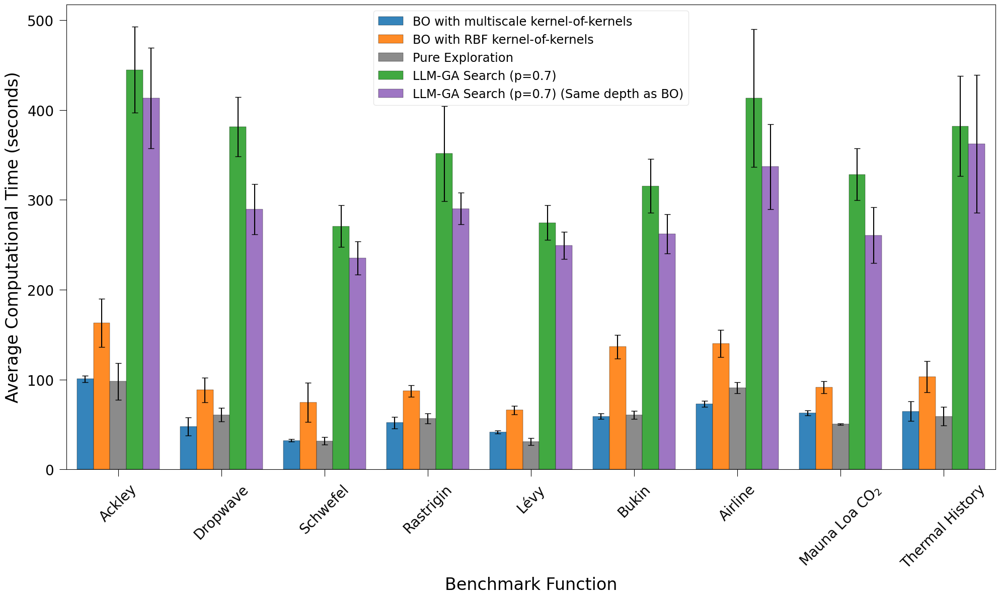

In [ ]:
# Comparative analysis of benchmarking computational time results
# Find and sort csv files
csv_files = sorted(glob.glob("output/kernel-opt_benchmark/*-summary.csv"))

if not csv_files:
    print("No files found matching '*-summary.csv'. Make sure the script is in the same folder as your data.")

print(f"Found {len(csv_files)} summary files to process...")

# Load and combine all data
data_frames = []
for f in csv_files:
    try:
        df = pd.read_csv(f)
        df['Function'] = get_display_name(f)
        data_frames.append(df)
    except Exception as e:
            print(f"Error reading {f}: {e}")

full_df = pd.concat(data_frames, ignore_index=True)

# Apply Method Styles
full_df['StyleKey'] = full_df['Method'].map(csv_method_map)
full_df['PlotLabel'] = full_df['StyleKey'].map(lambda k: methods[k]['label'] if pd.notnull(k) else k)
    
# Pivot for plotting
mean_df = full_df.pivot(index='Function', columns='PlotLabel', values='Avg_Time_sec')
std_df = full_df.pivot(index='Function', columns='PlotLabel', values='Std_Time_sec')

# Reorder ROWS (Functions) according to the specific list
existing_functions = [f for f in FUNCTION_ORDER if f in mean_df.index]
mean_df = mean_df.reindex(existing_functions)
std_df = std_df.reindex(existing_functions)

# Reorder COLUMNS (Methods) according to style definition
desired_cols = [methods[k]['label'] for k in methods.keys() if methods[k]['label'] in mean_df.columns]
mean_df = mean_df[desired_cols]
std_df = std_df[desired_cols]
    
# Extract the corresponding colors for the sorted columns
# Create a lookup dictionary: Label -> Color
label_to_color = {v['label']: v['color'] for k, v in methods.items()}
plot_colors = [label_to_color[label] for label in mean_df.columns]
    
# Generate Plot
plt.figure()

SIDE_GAP = 0.1
BAR_WIDTH = 1 - 2 * SIDE_GAP

ax = mean_df.plot(kind='bar', yerr=std_df, figsize=(20, 12), color=plot_colors, width=BAR_WIDTH, 
                  capsize=4, rot=45, edgecolor='black', linewidth=0.3, alpha=0.9)

n_groups = len(mean_df)
left_limit = 0 - (BAR_WIDTH / 2) - SIDE_GAP
right_limit = (n_groups - 1) + (BAR_WIDTH / 2) + SIDE_GAP
plt.xlim(left_limit, right_limit)

# Formatting
plt.ylabel("Average Computational Time (seconds)", fontsize=24, labelpad=8)
plt.xlabel("Benchmark Function", fontsize=24, labelpad=8)
ax.tick_params(axis='both', which='major', length=10, labelsize=20, pad=8)
plt.xticks(rotation=45, ha='center')
# Legend
plt.legend(fontsize=17.5, loc='best', framealpha=0.5)
plt.tight_layout()
    
# Save
output_filename = "output/Benchmark/computational_time_comparison.png"
plt.savefig(output_filename, dpi=300)
print(f"Success! Plot saved to: {output_filename}")
plt.show()